 <font size="15">SKT012.04_scATACseqChiouT2D_NatGen_TSSenrichment10_cisTopic </font> 

In [8]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /vsc-hard-mounts/leuven-data/332/vsc33293/miniconda/envs/R_CisTopic/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] stats4    parallel  grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] GenomeInfoDb_1.26.4  IRanges_2.24.1       S4Vectors_0.28.1    
 [4] BiocGenerics_0.36.0  magick_2.7.2         ComplexHeatmap_2.6.2
 [7] Cairo_1.5-12.2       fastcluster_1.1.25   scatterplot3d_0.3-41
[10] plotly_4.9.3         den

In [9]:
R.home("bin")
.libPaths()

[1] "/data/leuven/332/vsc33293/miniconda/envs/R_CisTopic/lib/R/bin"

[1] "/vsc-hard-mounts/leuven-data/332/vsc33293/miniconda/envs/R_CisTopic/lib/R/library"

# Libraries and Function

In [2]:
library(tidyverse)

library(Matrix)


suppressWarnings(library(cisTopic))

# t-sne & UMAP
library(Rtsne)
library(umap)
library(densityClust)


library(ggplot2)
library(plotly)
library(scatterplot3d)

library(fastcluster)
library(Cairo)
library(grid)
library(ComplexHeatmap)
library(magick)
library(GenomeInfoDb)

set.seed(1234)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
Warning message:
“Your system is mis-configured: ‘/etc/localtime’ is not a symlink”
Warning message:
“It is strongly recommended to set envionment variable TZ to ‘Europe/Amsterdam’ (or equivalent)”
── Attaching packages ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.5 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.0 
✔ readr   2.1.2      ✔ forcats 0.5.1 
── Conflicts ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘Matrix’


The following object

In [3]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /vsc-hard-mounts/leuven-data/332/vsc33293/miniconda/envs/R_CisTopic/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] stats4    parallel  grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] GenomeInfoDb_1.26.4  IRanges_2.24.1       S4Vectors_0.28.1    
 [4] BiocGenerics_0.36.0  magick_2.7.2         ComplexHeatmap_2.6.2
 [7] Cairo_1.5-12.2       fastcluster_1.1.25   scatterplot3d_0.3-41
[10] plotly_4.9.3         den

## Function Figure Size

In [4]:
# function for adjusting width and height of plots

fig <- function(width, height){
     options(repr.plot.width = width, repr.plot.height = height)
}


# What is cisTopic?
cisTopic identifies simultaneously of cis-regulatory topics and cell states from single cell epigenomics data. <br/>
cisTopic relies on an algorithm called Latent Dirichlet Allocation (LDA),<br/>
a robust Bayesian method used in text mining to group documents addressing similar topics and related words into topics.<br/>
Interestingly, this model has a series of assumptions that are fulfilled in single-cell epigenomics data,<br/>
such as non-ordered features (‘bag of words’) and the allowance of overlapping topics <br/>
(i.e. a regulatory region can be co-accessible with different other regions depending on the context, namely, the cell type or state).

cisTopic now uses the WarpLDA implementation for topic modelling (Chen et al, 2016), where each region in each cell is assigned to a topic based on (1) to which topic the region is assigned in other cells and (2) to which topics the regions are assigned in that cell. In comparison to Collapsed Gibbs Sampling, both counts are fixed after all tokens are sampled, allowing to randomly access regions in cells for assignment; while with a CGS we need to update the counts after each assignment before making the next assignment. After a number of iterations through the data set, these assignments are used to estimate the probability of a region belonging to a cis-regulatory topic (region-topic distribution) and the contributions of a topic within each cell (topic-cell distribution). These distributions can in turn be used to cluster cells and identify cell types, and to analyse the regulatory sequences in each topic.

cisTopic consists of 4 main steps: (1) generation of a binary accessibility matrix as input for LDA; (2) LDA and model selection; (3) cell state identification using the topic-cell distributions from LDA and (4) exploration of the region-topic distributions.

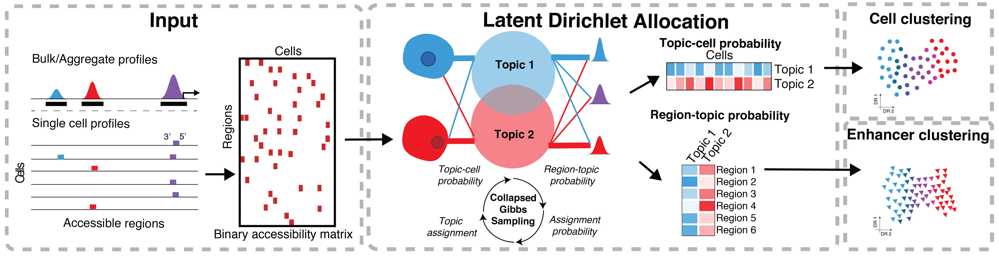


Figure 1. cisTopic workflow. The input for cisTopic is a binary accessibility matrix. This matrix can be formed from single-cell BAM files and a set of genome-wide regulatory regions (e.g., from peak calling on the bulk or aggregate data). Next, Latent Dirichlet Allocation (LDA) is applied on the binary accessibility matrix to obtain the topic-cell distributions (contributions of each topic per cell) and the region-topic distributions (contributions of each region to a topic). Note that a region can contribute to more than one topic (represented by the purple peaks). Finally, the topic-cell distributions are used for dimensionality reduction (e.g. PCA, tSNE, diffusion maps) and clustering to identify cell states, while the region-topic distributions can be used to predict the regulatory code underlying the topic.

<br/> 

---
<br>
<b><font color='darkorange'; size='6'>
Running cisTopic
    </font> </b>
    
# Input Data

In [5]:
# Directories
ProjectDir <- '/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/'

ChiouNatGen_T2D <- paste0(ProjectDir, "Chiou.et.al.2021_NatureGenetics_T2D/")
ChiouNatGen_T2D_DATA_Dir <- paste0(ChiouNatGen_T2D, "OUTPUTDIR/")



RDS_Dir <- paste0(ProjectDir, "RDS/")
FIG_Dir <- paste0(ProjectDir, "Figure/")
DATA_Dir <- paste0(ProjectDir, "Data/cisTopic/")





# Create CisTopicObject

In [ ]:
library("stringi")

In [ ]:
# Create Count Matrices 

#Hg38 Pancreas Islet1
CountMatrix <- read.csv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet1"))
CountSparseMatrix <- CountMatrix  %>% column_to_rownames(var ='X') %>% as.matrix %>% Matrix(sparse = TRUE)
colnames(CountSparseMatrix) <- colnames(CountSparseMatrix) %>% paste0('_Islet1')
row.names(CountSparseMatrix) <- row.names(CountSparseMatrix) %>% stri_replace_first(fixed = "-", ":")
CountMatrix_Islet1 <- CountSparseMatrix

#Hg38 Pancreas Islet2
CountMatrix <- read.csv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet2"))
CountSparseMatrix <- CountMatrix  %>% column_to_rownames(var ='X') %>% as.matrix %>% Matrix(sparse = TRUE)
colnames(CountSparseMatrix) <- colnames(CountSparseMatrix) %>% paste0('_Islet2')
row.names(CountSparseMatrix) <- row.names(CountSparseMatrix) %>% stri_replace_first(fixed = "-", ":")
CountMatrix_Islet2 <- CountSparseMatrix

#Hg38 Pancreas Islet3
CountMatrix <- read.csv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet3"))
CountSparseMatrix <- CountMatrix  %>% column_to_rownames(var ='X') %>% as.matrix %>% Matrix(sparse = TRUE)
colnames(CountSparseMatrix) <- colnames(CountSparseMatrix) %>% paste0('_Islet3')
row.names(CountSparseMatrix) <- row.names(CountSparseMatrix) %>% stri_replace_first(fixed = "-", ":")
CountMatrix_Islet3 <- CountSparseMatrix

#Hg38 Whole Pancreas CB
CountMatrix <- read.csv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_WholeCB"))
CountSparseMatrix <- CountMatrix  %>% column_to_rownames(var ='X') %>% as.matrix %>% Matrix(sparse = TRUE)
colnames(CountSparseMatrix) <- colnames(CountSparseMatrix) %>% paste0('_WholeCB')
row.names(CountSparseMatrix) <- row.names(CountSparseMatrix) %>% stri_replace_first(fixed = "-", ":")
CountMatrix_WholeCB <- CountSparseMatrix

In [24]:
#Hg38 Whole Pancreas 10X Genomics
Regions <- readr::read_tsv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_regions.tsv"),col_names = F) %>% tidyr::unite(region)
Barcodes <- readr::read_tsv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_barcodes.tsv"),col_names = F) %>% tidyr::unite(barcode)
CountSparseMatrix <- Matrix::readMM(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X.mtx")) %>%
  magrittr::set_colnames(Barcodes$barcode) %>%
  magrittr::set_rownames(Regions$region)
colnames(CountSparseMatrix) <- colnames(CountSparseMatrix) %>% paste0('_Whole10X')
row.names(CountSparseMatrix) <- row.names(CountSparseMatrix) %>% stri_replace_first(fixed = "-", ":")
CountMatrix_Whole10X <- CountSparseMatrix

Rows: 209921 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 23433 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [30]:
CombinedCountMatrix <- cbind(CountMatrix_Islet1, CountMatrix_Islet2, CountMatrix_Islet3, CountMatrix_WholeCB, CountMatrix_Whole10X)


In [31]:
cisTopicObject <- createcisTopicObject(CombinedCountMatrix, project.name='CombinedHg38Pancreas')


## Save RDS

In [33]:
saveRDS(cisTopicObject, file=paste0(RDS_Dir,"SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"))

setwd(RDS_Dir)
getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"

# Building the models

The next step in the cisTopic workflow is to use Latent Dirichlet Allocation (LDA) for the modelling of cis-regulatory topics. LDA allows to derive, from the original high-dimensional and sparse data, (1) the probability distributions over the topics for each cell in the data set and (2) the probability distributions over the regions for each topic (Blei et al., 2003). These distributions indicate, respectively, how important a regulatory topic is for a cell, and how important regions are for the regulatory topic. Here, we use WarpLDA (Chen et al, 2016), in which we assign regions to a certain topic by randomly sampling from a distribution where the probability of a region being assigned to a topic is proportional to the contributions of that region to the topic and the contributions of that topic in a cell, with delayed count update.

To do this, runWarpLDAModels() builds several models (e.g. with diferent numbers of topics) using Latent Dirichlet Allocation (LDA) on the binary accessibility matrix (automatically stored in the initialized cisTopicObject). We can then select the best model using selectModel().

The main parameters for running the models (runWarpLDAModels) are:

* **Number of topics** (topic): The number of topics are usually slightly bigger than the potential cell states in the data set. In the case of single cell epigenomics data the number of topics is low compared to other implementations (e.g. text classification). The running time will be affected by the number of topics.

<br>
* The Dirichlet hyperparameters <b>Alpha</b> (topic proportions) and <b>Beta</b> (topic multinomials):
    </b>
    <br>
<b><font color='cyan'; size='3'>
    Alpha  
    </font> </b>
    affects the topic-cell contributions; low alpha forces to pick for each cell a few topics with significant contribution, while a high alpha allows cells to have similar, smooth topic proportions. 
<b><font color='cyan'; size='3'>
   <br> Beta  
    </font> </b>
    affects to the region combinations; the lower the beta, the fewer regions a topic will have; the higher the beta, the less distinct these topics will be (i.e. there will be more overlap between the topics). 
    
  <br> By default, we select alpha as 50/number of topics and beta as 0.1 (as Griffiths & Steyvers, 2004).

In this tutorial, we will test models with 2, 5, 10 to 25, 30, 35, 40 topics [Reference running time for the example data set (5k cells; ~97k regions): 40 minutes].

In [7]:
setwd(RDS_Dir)
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('SKT012.01.01_CisTopic_Hg38PancreasCombined.rds')


[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"

In [17]:
cisTopicObject <- runWarpLDAModels(cisTopicObject, topic=c(1:100),
                                   seed=1234,
                                   nCores=8,
                                   iterations = 500,
                                   addModels=TRUE, tmp=paste0(DATA_Dir,"WarpLDAModels/","WarpLDAModels"))
saveRDS(cisTopicObject, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds')

In order to compare these models with previous models, these parameters will take the values from the previous run: 
 seed: 1234 
 iterations: 500 
 burnin:  
 alpha: 50 
 alphaByTopic: TRUE 
 beta: 0.1[1] "Exporting data..."
[1] "Run models..."


## Save Data

In [11]:
setwd(RDS_Dir)
saveRDS(cisTopicObject, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds')

getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"                 
[2] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds"
[3] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA.rds"

**NOTE**: For large data sets, we recommend to use the tmp parameter, that allows to save models in the specified folder as finished.
<br> If using these models for filling a cisTopicObject later on,
<br> you will need to fill the parameters in cisTopicObject@calc.params[['runWarpLDAModels']] or cisTopicObject@calc.params[['runCGSModels']] manually:

In [15]:
# For WarpLDA
cisTopicObject@calc.params[['runWarpLDAModels']]$seed <- seed
cisTopicObject@calc.params[['runWarpLDAModels']]$iterations <- iterations
cisTopicObject@calc.params[['runWarpLDAModels']]$alpha <- alpha
cisTopicObject@calc.params[['runWarpLDAModels']]$alphaByTopic <- alphaByTopic
cisTopicObject@calc.params[['runWarpLDAModels']]$beta <- beta

# For CGS
cisTopicObject@calc.params[['runCGSModels']]$seed <- seed
cisTopicObject@calc.params[['runCGSModels']]$burnin <- burnin
cisTopicObject@calc.params[['runCGSModels']]$iterations <- iterations
cisTopicObject@calc.params[['runCGSModels']]$alpha <- alpha
cisTopicObject@calc.params[['runCGSModels']]$alphaByTopic <- alphaByTopic
cisTopicObject@calc.params[['runCGSModels']]$beta <- beta

ERROR: Error in eval(expr, envir, enclos): object 'seed' not found


# Selection of the best model

In this version of cisTopic, we incorporate three different approaches to select the best topic:

* The log likelihood can be used to estimate the plausibility of a model parameter value, given the observed data (i.e. the highest the likelihood, the better the model). This is not recommended when running WarpLDA, as the curves stabilize rather than reaching a maximum.

* The second derivative in each point of the likelihood curve, as it measures the changes in the curvature from point to point (i.e. the highest the second derivative means that the next model is not improving much more the log-likelihood) . This is not recommended when running CGS, as the curves tend to be noisier or reach a maximum. This is the default in this version of cisTopic.

* The perplexity of each model (only for WarpLDA models) measures how well the model predicts the sample. The lower the perplexity is, the better the model.

Alternatively, you can also manually select the number of topics with the parameter select.

## Load Data

In [12]:
setwd(RDS_Dir)
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"                 
[2] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds"
[3] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA.rds"

In [13]:
cisTopicObject

An object of class cisTopic in project CombinedHg38Pancreas 
 209921 regions across 40049 samples.

[1] "Are these CGS models? Please, use type=\"maximum\""


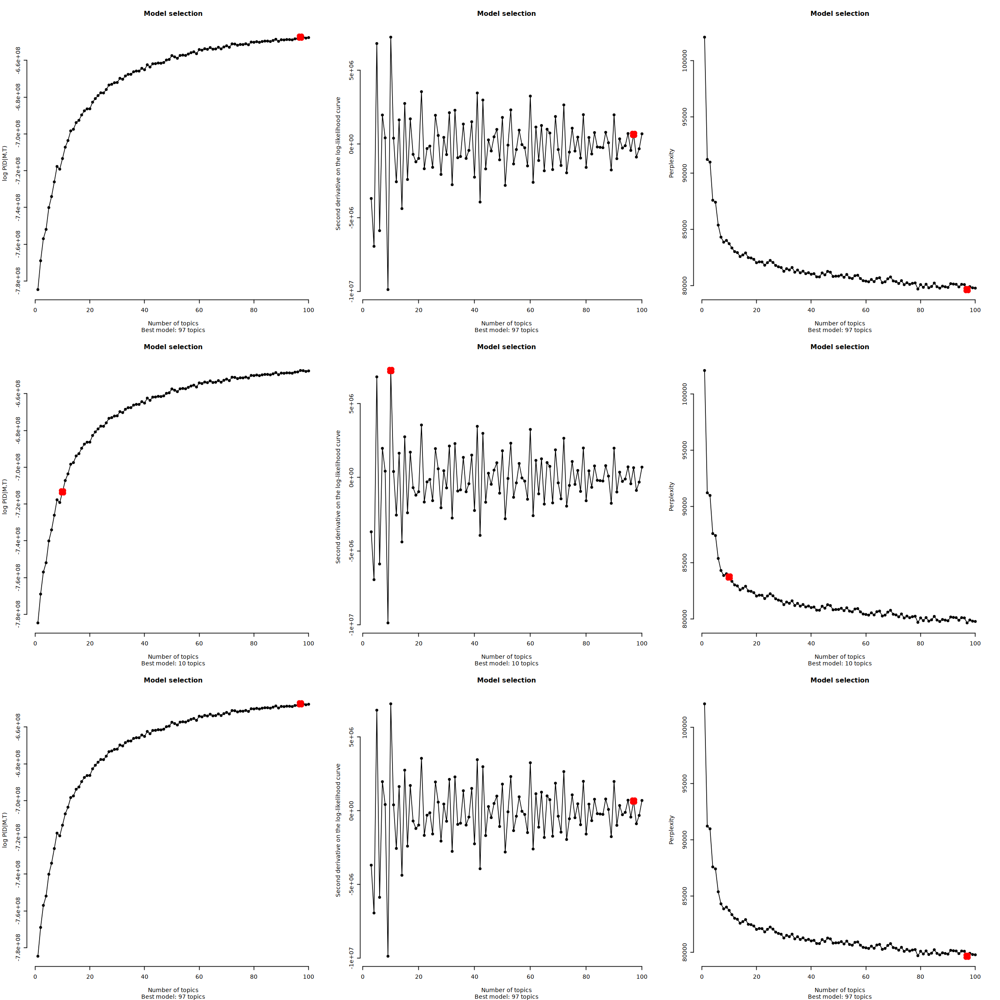

In [21]:
par(mfrow=c(3,3))
fig(20,20)


cisTopicObject <- selectModel(cisTopicObject, type='maximum')
cisTopicObject <- selectModel(cisTopicObject, type='derivative')
cisTopicObject <- selectModel(cisTopicObject, type='perplexity')

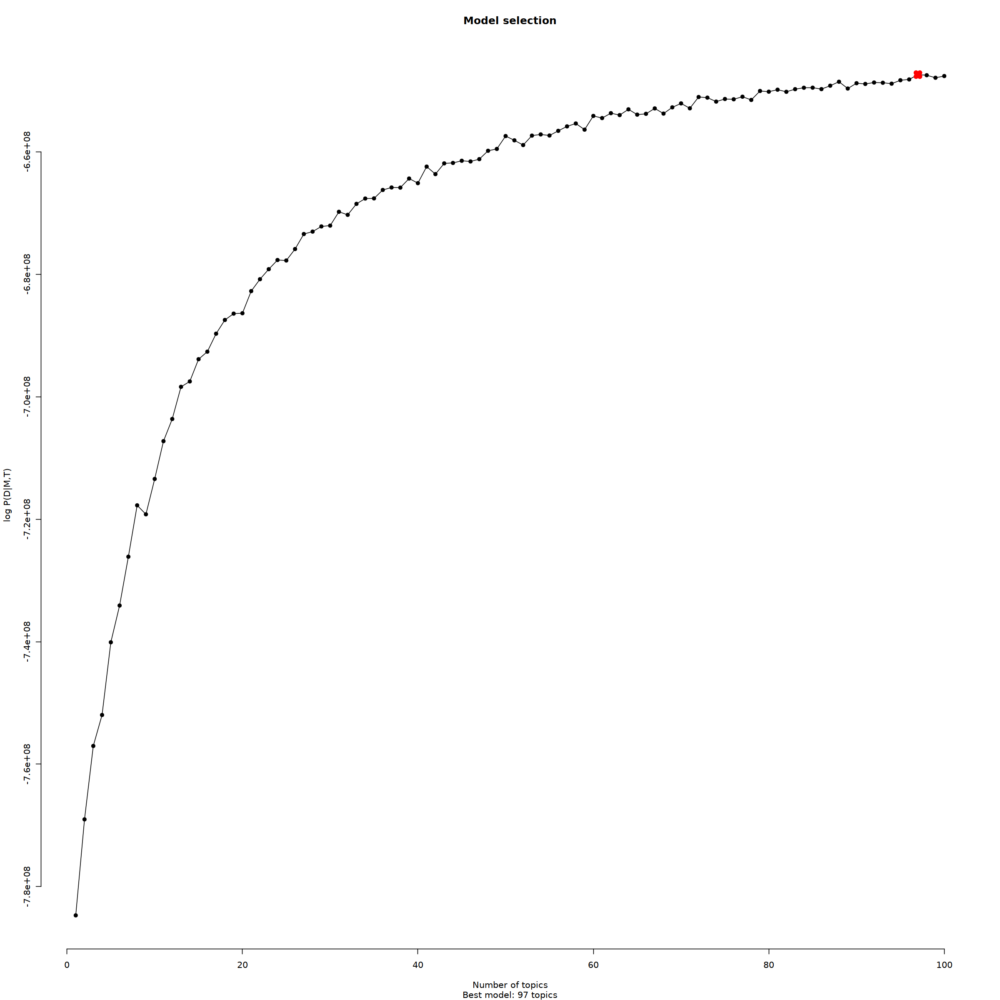

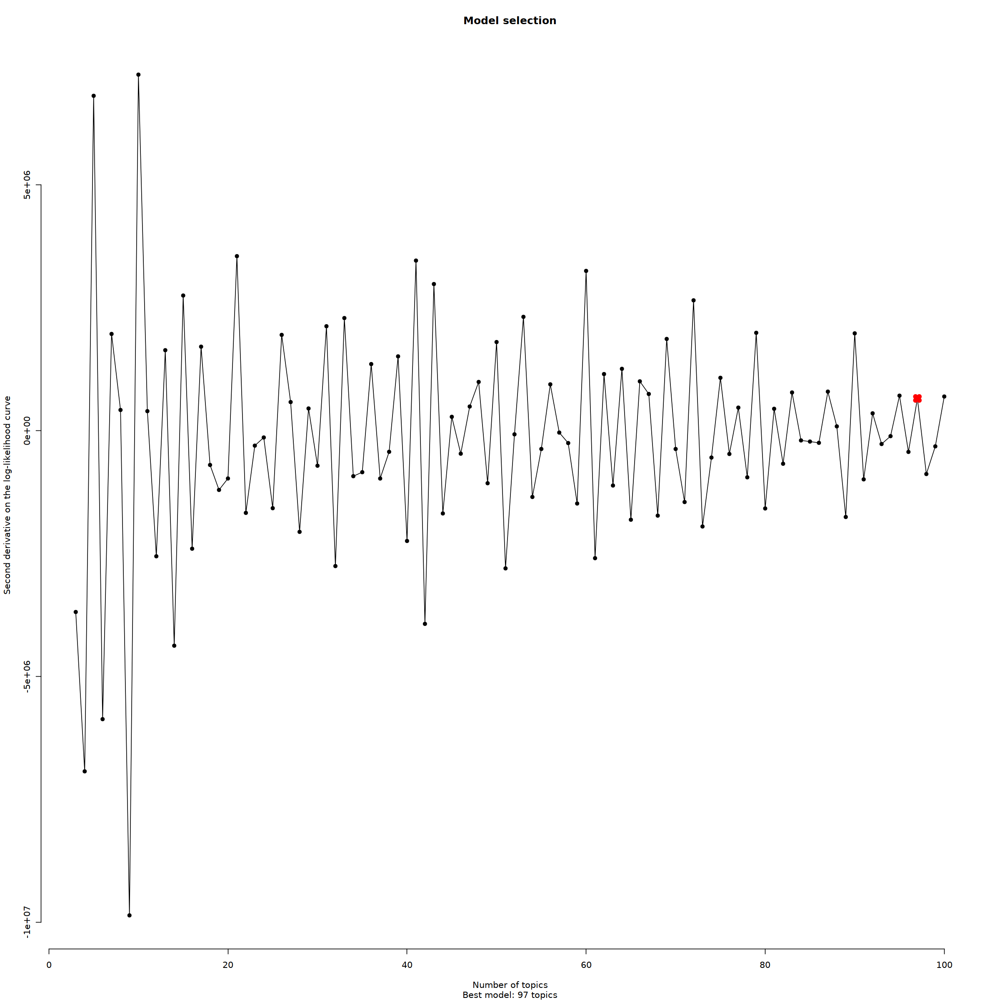

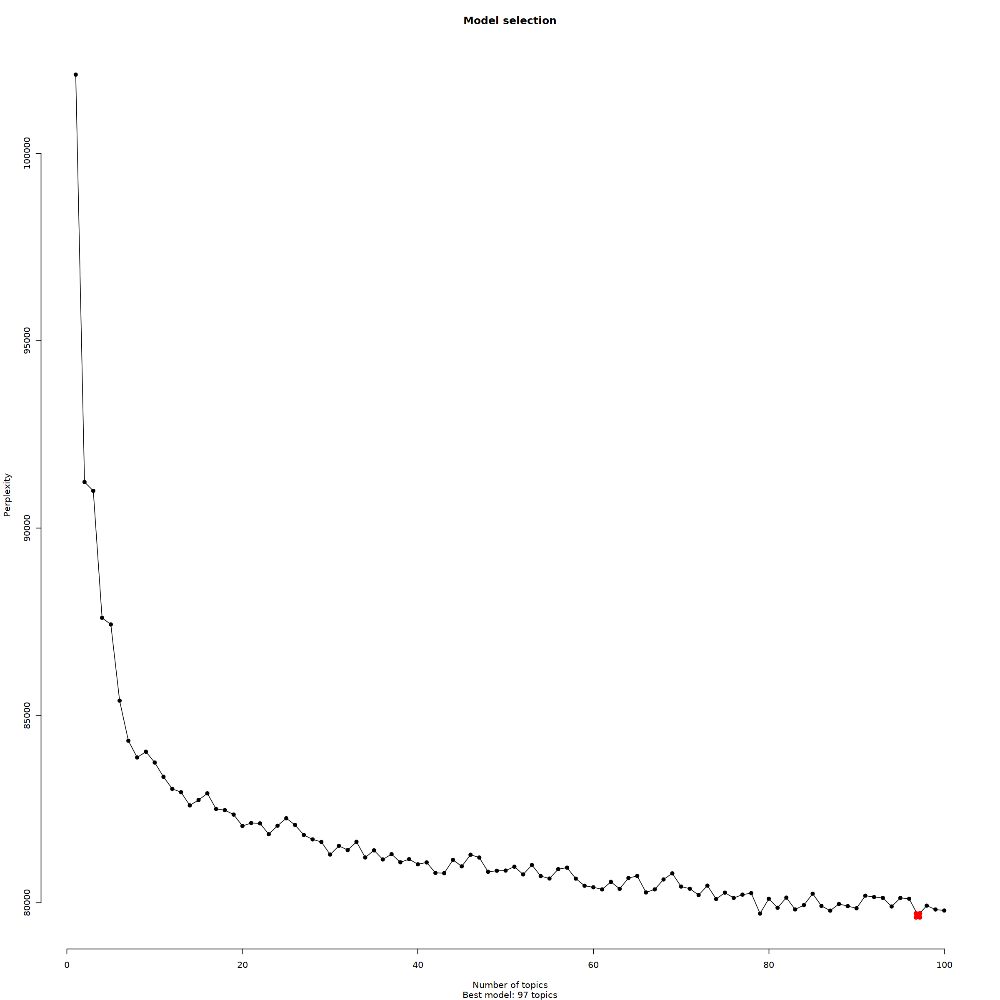

In [22]:
cisTopicObject <- selectModel(cisTopicObject, type='perplexity')

[1] "Are these CGS models? Please, use type=\"maximum\""


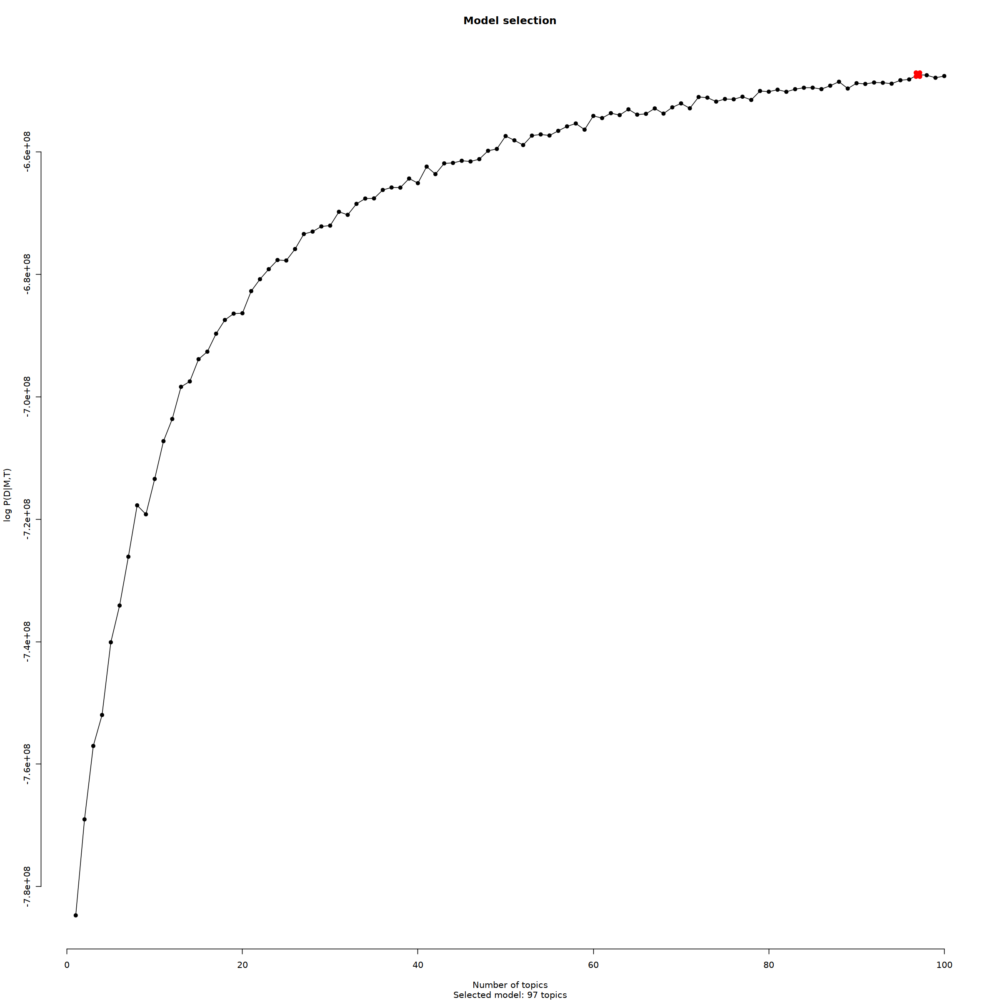

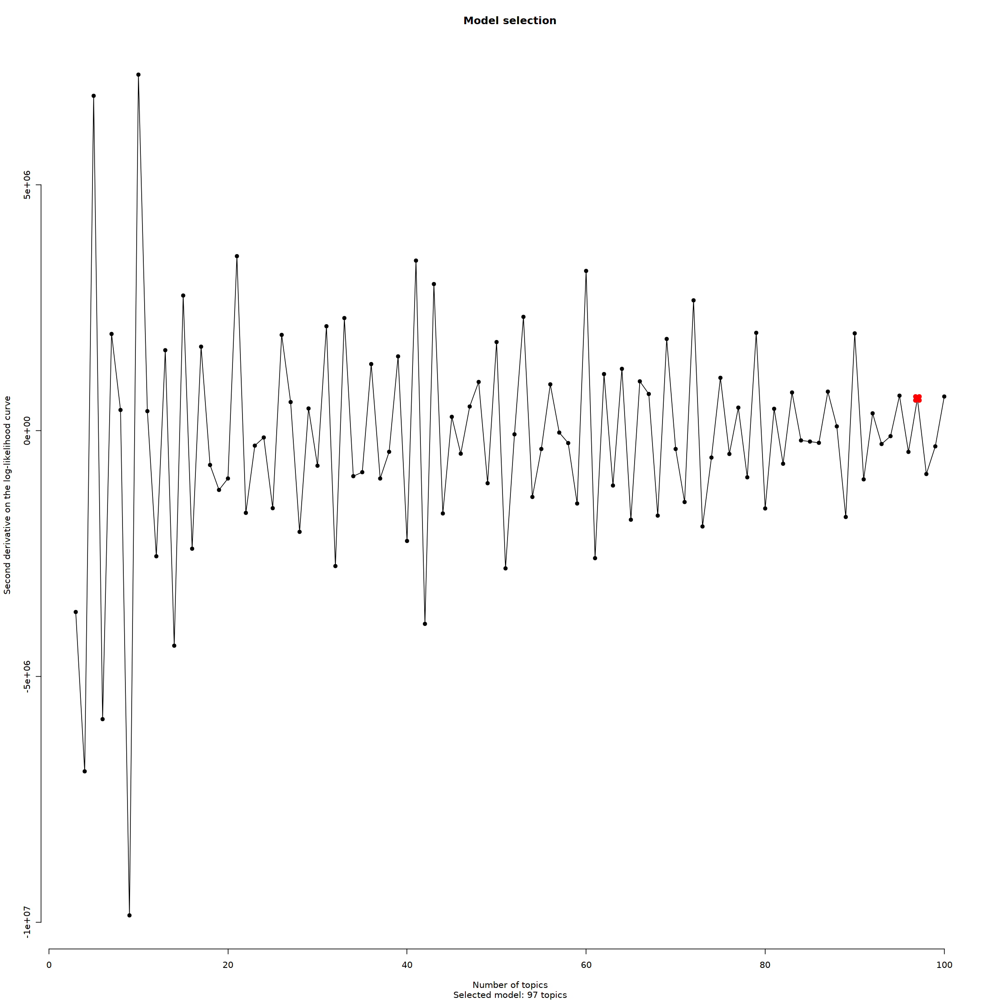

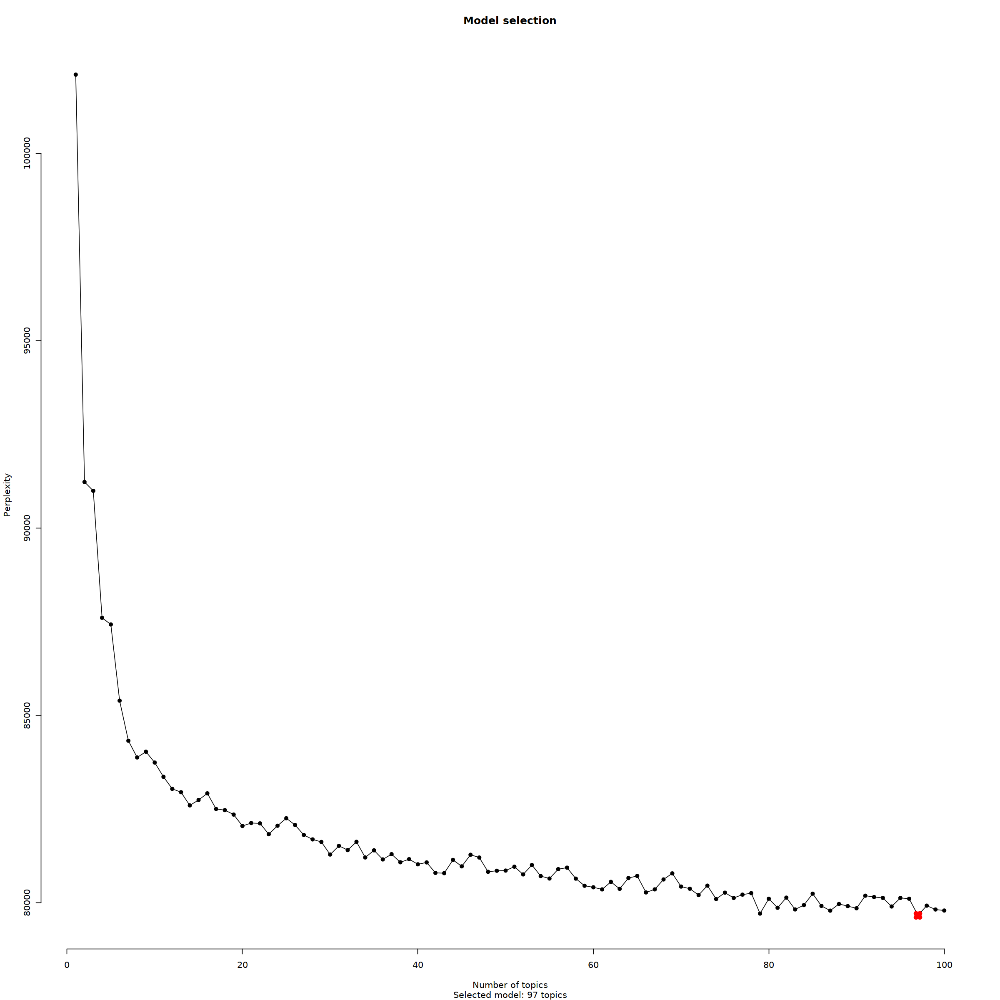

In [23]:
cisTopicObject <- selectModel(cisTopicObject, select=97)

# Add metadata

## Sample Origin

In [34]:
substrRight <- function(x, n){
  substr(x, nchar(x)-n+1, nchar(x))
}

In [35]:
substrLeft <- function(x, n){
  substr(x, 20, nchar(x))
}

In [36]:
cisTopicObject@cell.data

,nCounts,nAcc,densityClust
,<dbl>,<dbl>,<fct>
GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,26829,21238,11
AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,21887,18039,11
GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,21097,17033,9
AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,22475,16403,8
CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,19370,15829,9
GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,18139,15453,3
GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,17632,14810,9
CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,17249,14552,3
AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,5436,4984,3


In [60]:
RowNames <- cisTopicObject@cell.data %>% rownames

In [63]:
SampleName <- gsub(".*_", "", RowNames)
SampleName %>% unique

[1] "Islet1"   "Islet2"   "Islet3"   "WholeCB"  "Whole10X"

In [62]:
cisTopicObject@cell.data %>% mutate(Sample = SampleName)

,nCounts,nAcc,densityClust,Sample
,<dbl>,<dbl>,<fct>,<chr>
GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,26829,21238,11,Islet1
AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,21887,18039,11,Islet1
GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,21097,17033,9,Islet1
AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,22475,16403,8,Islet1
CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,19370,15829,9,Islet1
GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,18139,15453,3,Islet1
GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,17632,14810,9,Islet1
CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,17249,14552,3,Islet1
AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,5436,4984,3,Islet1


In [64]:
cisTopicObject@cell.data <- cisTopicObject@cell.data %>% mutate(Sample = SampleName)

In [65]:
cisTopicObject@cell.data

,nCounts,nAcc,densityClust,Sample
,<dbl>,<dbl>,<fct>,<chr>
GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,26829,21238,11,Islet1
AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,21887,18039,11,Islet1
GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,21097,17033,9,Islet1
AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,22475,16403,8,Islet1
CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,19370,15829,9,Islet1
GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,18139,15453,3,Islet1
GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,17632,14810,9,Islet1
CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,17249,14552,3,Islet1
AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,5436,4984,3,Islet1


## Annotations of different methods of nuclei isolation and single nuclei ATAC-seq methods

In [72]:
cisTopicObject@cell.data <- cisTopicObject@cell.data  %>%
    mutate(Tissue_Prep = case_when(
                           grepl("WholeCB",Sample) ~ 'WholePancreas',
                           grepl("Whole10X",Sample) ~ 'WholePancreas',
        TRUE ~ 'Islets'
                                                            )
          )

In [74]:
cisTopicObject@cell.data <- cisTopicObject@cell.data  %>%
    mutate(scATAC_methods = case_when(
                           grepl("Whole10X",Sample) ~ '10XGenomics',
        TRUE ~ 'CB'
                                                            )
          )

# Identification of cell states using cell-cisTopic distributions

LDA returns two distributions that represent <br>
(1) the topic contributions per cell and <br>
(2) the region contribution to a topic. <br>
We can interpret these values as a dimensinality reduction method, after which the data is re-represented as a matrix with cells as columns, topics as rows and contributions as values. The recorded topic assignments to the cells (not normalised) are stored in cisTopicObject@selected.model$document_expects (see lda package).

Different methods can be used for clustering and/or visualization. cisTopic includes wrapper functions to easily run Umap, tSNE, diffussion maps and PCA (the results are saved in the slot @dr$cell):

In [10]:
cisTopicObject

An object of class cisTopic in project CombinedHg38Pancreas 
 209921 regions across 40049 samples.

In [38]:
cisTopicObject %>% str(max.level=2)

Formal class 'cisTopic' [package "cisTopic"] with 24 slots
  ..@ count.matrix            :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ binary.count.matrix     :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ is.acc                  : num 1
  ..@ models                  : list()
  ..@ selected.model          :List of 6
  ..@ log.lik                 :'data.frame':	100 obs. of  5 variables:
  ..@ dr                      :List of 1
  ..@ calc.params             :List of 3
  ..@ cell.names              : chr [1:40049] "GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1" "AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1" "GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1" "AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1" ...
  ..@ cell.data               :'data.frame':	40049 obs. of  7 variables:
  ..@ region.names            : chr [1:209921] "chr1:804700-805200" "chr1:817126-817626" "chr1:826566-827066" "chr1:827306-827806" ...
  ..@ region.ranges           :Formal class 'GRanges' [package "GenomicRanges"] 

In [24]:
cisTopicObject <- runtSNE(cisTopicObject, 
                          target='cell', 
                          seed=1234, 
                          pca=FALSE, 
                          method='Probability')
cisTopicObject <- runUmap(cisTopicObject,
                          target='cell', 
                          seed=1234, 
                          method='Probability')

Additionally, we can use the cell-topic matrix to define clusters. <br>
The user can select the preferred methodology to do this. <br>
In this case, we will apply a peak density algorithm on the tsne dimensionality reduction projections, as in Cusanovich et al. (2018).

If you want to retrieve the normalised assignments for other analyses, you can use the function modelMatSelection:


In [107]:
cisTopicObject@dr$cell$tSNE

'data.frame':	40049 obs. of  7 variables:
 $ nCounts                : num  26829 21887 21097 22475 19370 ...
 $ nAcc                   : num  21238 18039 17033 16403 15829 ...
 $ densityClust           : Factor w/ 17 levels "1","2","3","4",..: 11 11 9 8 9 3 9 3 3 11 ...
 $ Sample                 : chr  "Islet1" "Islet1" "Islet1" "Islet1" ...
 $ Tissue_Prep            : chr  "Islets" "Islets" "Islets" "Islets" ...
 $ scATAC_methods         : chr  "CB" "CB" "CB" "CB" ...
 $ densityClustProbHarmony: Factor w/ 18 levels "1","2","3","4",..: 2 2 3 12 3 2 3 2 2 2 ...


In [25]:
# retrieve normalised topic-cell and region-topic assignments
cellassign <- modelMatSelection(cisTopicObject, 'cell', 'Probability')
cellassign

,GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,AGACACCTCCTAAGACATCTGAGTTATAG_Islet1,...,GCCAGACCAGACTAAA-1_Whole10X,GCCATAAGTACGCCCA-1_Whole10X,GCCCGAATCACGGGTC-1_Whole10X,GCGAGTCGTACTAGAA-1_Whole10X,GCTCGAGGTTACCCAA-1_Whole10X,GCTTGCTCACAGTTAC-1_Whole10X,TGACTCCAGACTAGGC-1_Whole10X,TGGAAGGCACAGGTAG-1_Whole10X,TGTACGAAGAACTAAC-1_Whole10X,TTGCACCAGACGAAAG-1_Whole10X
Topic1,3.517280e-03,5.100061e-04,1.937416e-04,3.657867e-04,1.718365e-03,1.494855e-03,1.384200e-03,1.374382e-03,1.017255e-02,3.316361e-03,...,0.0279661017,0.0888297872,0.0050724638,0.0190082645,0.1666666667,0.0904545455,0.0030434783,0.047126437,0.0000000000,0.0073913043
Topic2,5.348903e-03,7.433893e-03,4.391475e-03,1.450954e-03,4.542296e-03,1.003041e-03,1.022282e-02,4.556075e-03,9.831461e-04,1.386842e-02,...,0.0033898305,0.0000000000,0.0161835749,0.0000000000,0.0017857143,0.0195454545,0.0030434783,0.008045977,0.0104838710,0.0686956522
Topic3,1.883417e-04,2.200787e-03,4.696765e-05,6.706090e-05,3.619938e-03,5.047564e-04,3.828494e-03,2.858714e-03,4.012841e-04,5.024789e-03,...,0.0076271186,0.0101063830,0.0033816425,0.0057851240,0.0053571429,0.0081818182,0.0043478261,0.002298851,0.0032258065,0.0017391304
Topic4,1.789246e-04,1.441322e-04,2.935478e-05,1.219289e-05,0.000000e+00,1.941371e-05,2.700878e-05,4.260583e-04,1.805778e-04,3.349859e-05,...,0.0016949153,0.0042553191,0.0019323671,0.0578512397,0.0083333333,0.0009090909,0.0004347826,0.012643678,0.0370967742,0.0086956522
Topic5,3.018646e-02,2.194689e-02,5.260964e-02,4.206548e-03,3.651526e-02,1.474147e-02,4.118163e-02,1.034222e-02,1.245987e-02,2.988744e-02,...,0.0127118644,0.0010638298,0.0021739130,0.0438016529,0.0035714286,0.0031818182,0.0017391304,0.001149425,0.0016129032,0.0008695652
Topic6,4.360109e-03,9.257719e-04,5.518699e-04,4.206548e-04,9.792154e-04,1.339546e-03,7.022282e-04,3.992578e-03,1.243981e-03,2.298003e-03,...,0.0008474576,0.0170212766,0.0478260870,0.0148760331,0.0077380952,0.0268181818,0.0004347826,0.004597701,0.0387096774,0.0017391304
Topic7,1.039175e-02,9.967293e-03,1.494158e-02,5.196610e-02,6.323836e-03,4.742121e-02,5.259959e-03,1.023227e-02,1.484751e-03,2.081603e-02,...,0.0525423729,0.0037234043,0.0048309179,0.0454545455,0.0017857143,0.0040909091,0.0004347826,0.002298851,0.0000000000,0.0013043478
Topic8,2.825125e-05,2.771772e-05,5.870956e-06,8.535024e-05,3.790511e-05,3.365042e-04,2.700878e-05,2.061572e-05,6.019262e-04,4.287820e-04,...,0.0025423729,0.0000000000,0.0070048309,0.0066115702,0.0005952381,0.0109090909,0.0000000000,0.089655172,0.0016129032,0.0013043478
Topic9,1.320275e-02,3.087754e-03,5.870956e-05,7.925380e-05,5.054015e-05,1.412671e-02,2.700878e-05,2.179769e-02,2.110754e-02,8.468444e-03,...,0.0000000000,0.0015957447,0.0009661836,0.0173553719,0.0023809524,0.0072727273,0.0065217391,0.000000000,0.0072580645,0.0026086957
Topic10,1.044825e-02,1.230667e-02,9.822110e-03,6.096446e-06,2.698844e-02,2.413771e-03,3.391627e-02,4.927158e-03,6.801766e-03,3.272813e-02,...,0.0033898305,0.0085106383,0.0002415459,0.0057851240,0.0000000000,0.0000000000,0.0000000000,0.008045977,0.0032258065,0.0021739130


In [26]:
# Dimension Reduction
DR <- Rtsne(t(cellassign), pca=F)
DRdist <- dist(DR$Y)
# Density Cluster
dclust <- densityClust(DRdist,gaussian=T)

Distance cutoff calculated to 3.132205 


In [27]:
# Make Clusters
# Setup threshold for rho and delta
dclust <- findClusters(dclust, rho = 50, delta = 2.5)

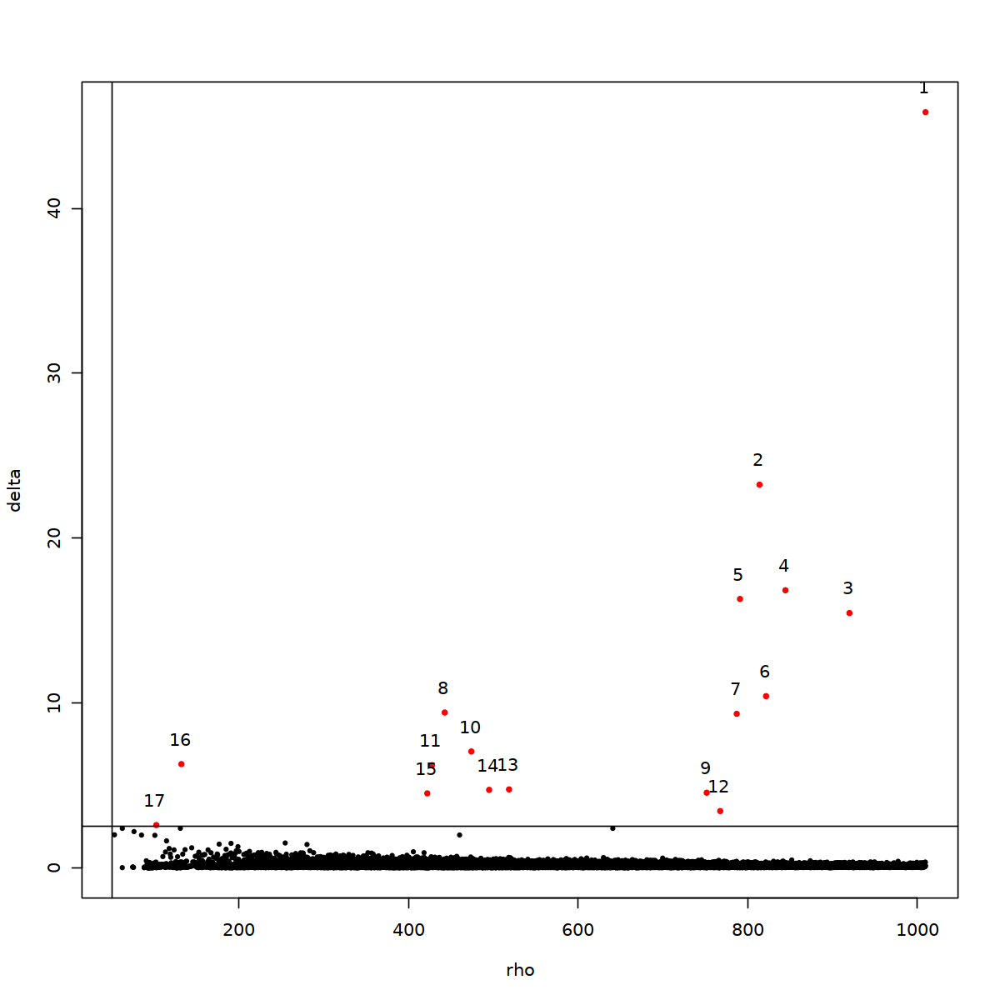

In [31]:
# Check thresholds
fig(10,10)

plot(dclust$rho,
     dclust$delta,
     pch=20,
     cex=0.6,
     xlab='rho',
     ylab='delta')
points(dclust$rho[dclust$peaks],
       dclust$delta[dclust$peaks],
       col="red",
       pch=20,
       cex=0.8)
text(dclust$rho[dclust$peaks]-2,
     dclust$delta[dclust$peaks]+1.5,
     labels=dclust$clusters[dclust$peaks])
abline(v=50)
abline(h=2.5)


In [32]:
# Add cluster information
densityClust <- dclust$clusters
densityClust <- as.data.frame(densityClust)
rownames(densityClust) <- cisTopicObject@cell.names
colnames(densityClust) <- 'densityClust'
densityClust[,1] <- as.factor(densityClust[,1])
cisTopicObject <- addCellMetadata(cisTopicObject, densityClust)

Once calculations are done, cisTopic offers a unified visualization function (plotFeatures), which allows to visualize tSNE, Umap, diffussion maps, principal components and biplots (in 2/3D), colored by metadata and/or topic enrichment.

## Plot Figure Function


In [33]:
PlotFigure <- function(Feature, TitleFigure, PointSize, Ncol, Width, Height){
    
# Step 1: Call the png command to start the plot
 # The directory you want to save the file in
pdf(file = paste0(PathToFigures, FigureDirectory, DataName, FeaturePlot, TitleFigure, Pdf),  
    width = Width, # The width of the plot in inches
    height = Height # The height of the plot in inches
  # units = "cm",
   # res = 300) 
)
# Step 2: Create the plot with R code
DefaultAssay(SeuratObject) <- 'RNA'
FeaturePlot <- FeaturePlot(
  object = SeuratObject,
  features = Feature,
  pt.size = PointSize,
 order = TRUE,
  max.cutoff = 'q95',
  ncol = 1,
  ) + 
    NoLegend() +
    theme(axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      axis.title.x=element_blank(),
      axis.title.y=element_blank(),
      panel.background = element_rect(size=1)
      #legend.position="none",
      #panel.border=element_blank(),
      #panel.grid.major=element_blank(),
      #panel.grid.minor=element_blank(),
      #plot.background=element_blank()
     ) #+
#    labs(title = NULL)
    
FeaturePlot
print(FeaturePlot)
    
# Step 3: Run dev.off() to create the file!
dev.off()
    
    
return(print(FeaturePlot)
)
    }

## UMAP

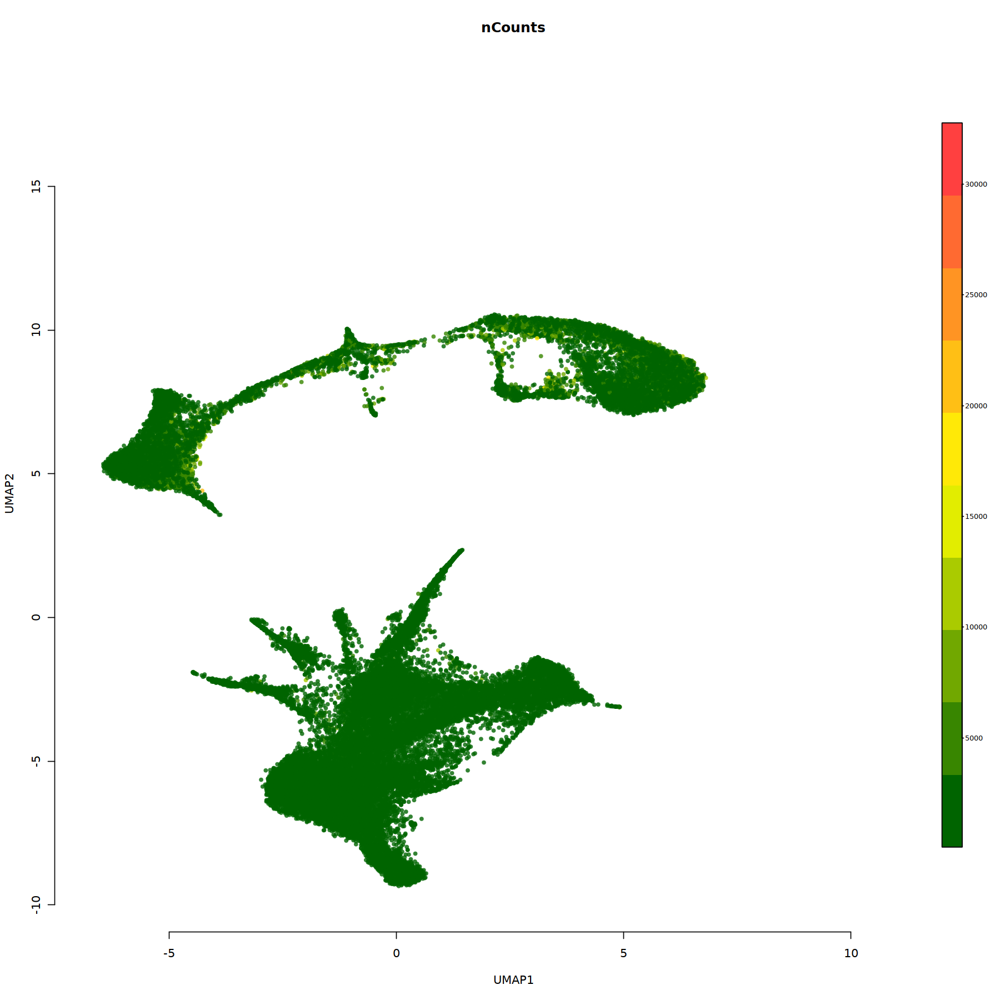

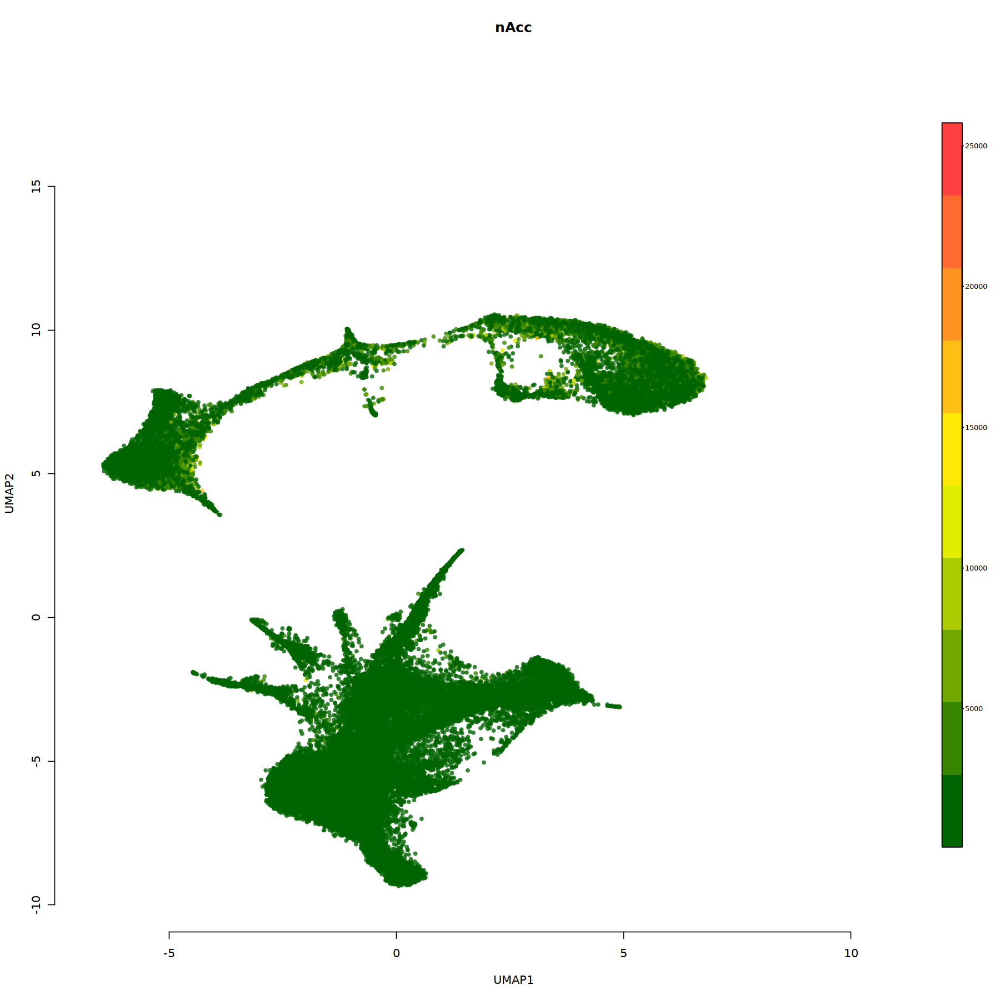

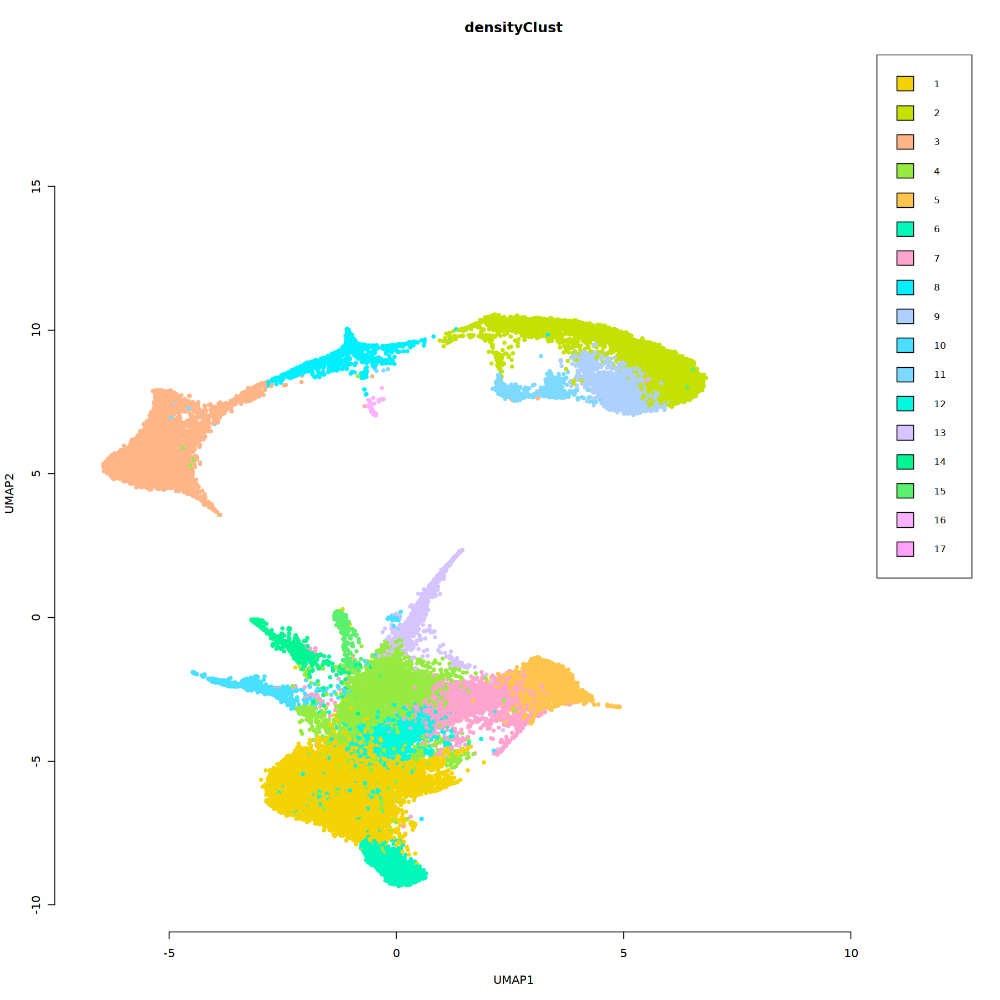

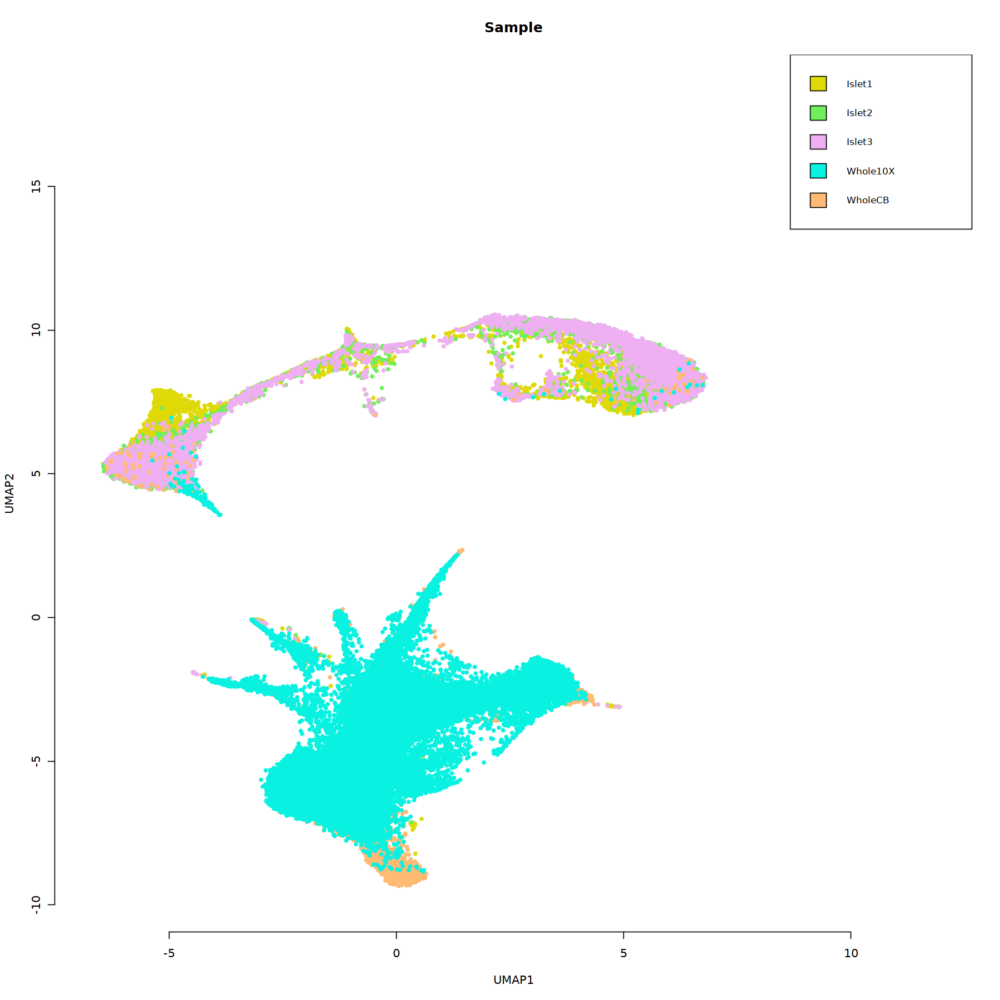

In [77]:
par(mfrow=c(1,1))
options(repr.plot.width = 15, repr.plot.height = 15)

plotFeatures(cisTopicObject,
             method='Umap',
             target='cell',
             topic_contr=NULL,
             colorBy=c('nCounts', 'nAcc','densityClust', 'Sample'),
             cex.legend = 0.8,
             cex.dot = .75,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10)

In [80]:
pdf(file = paste0(FIG_Dir,'CisTopic-UMAP-Clusters.pdf'),  
    width = 10, # The width of the plot in inches
    height = 10 # The height of the plot in inches
  # units = "cm",
   # res = 300) 
)


par(mfrow=c(1,1))
options(repr.plot.width = 15, repr.plot.height = 15)

plotFeatures(cisTopicObject,
             method='Umap',
             target='cell',
             topic_contr=NULL,
             colorBy=c('nCounts', 'nAcc','densityClust'), #'graphBasedClusters_CRA'
             cex.legend = 0.8,
             cex.dot = .50,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10)

dev.off()

png 
  2

## tSNE

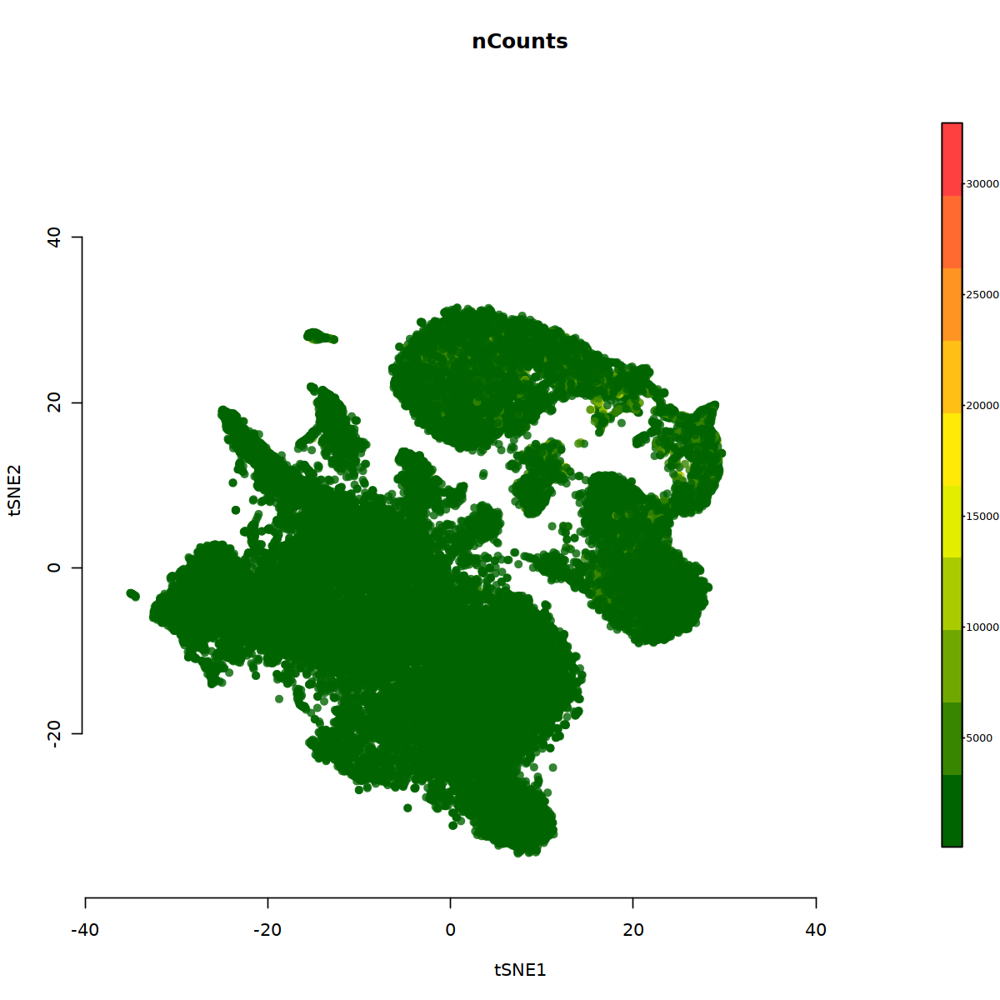

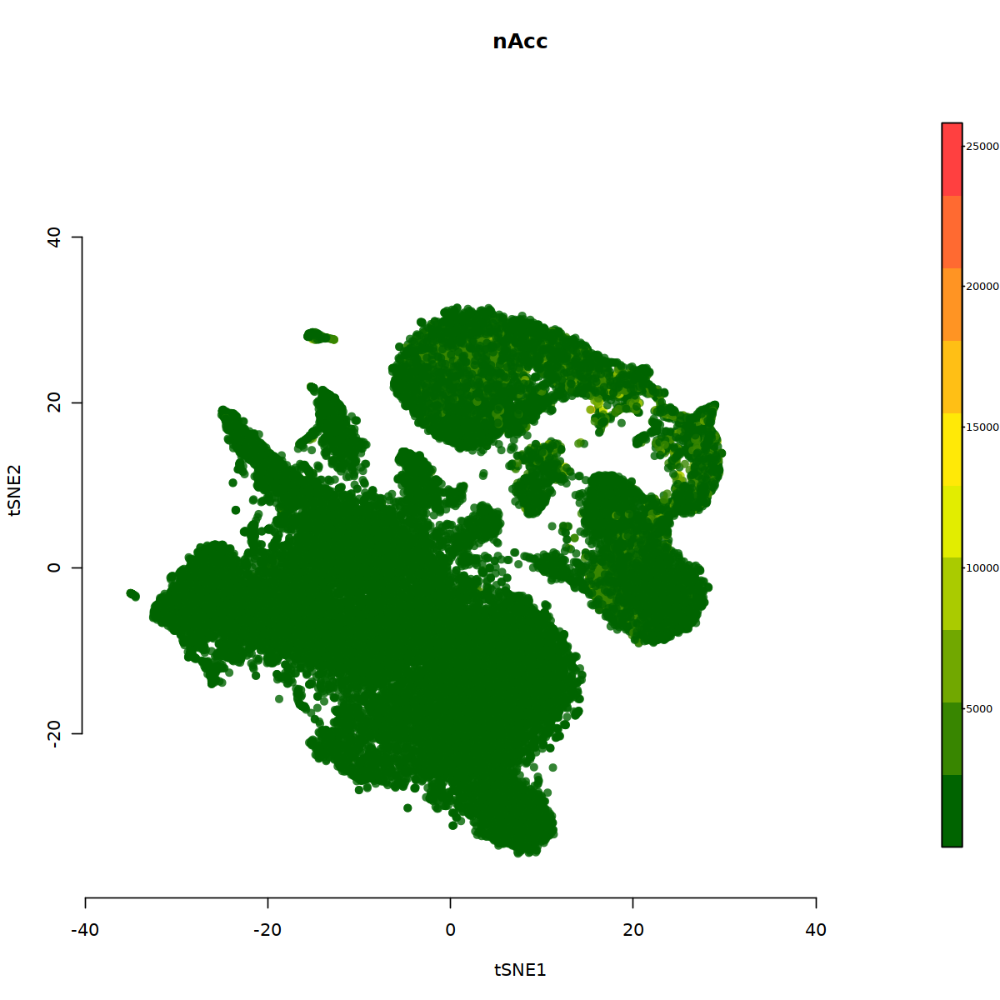

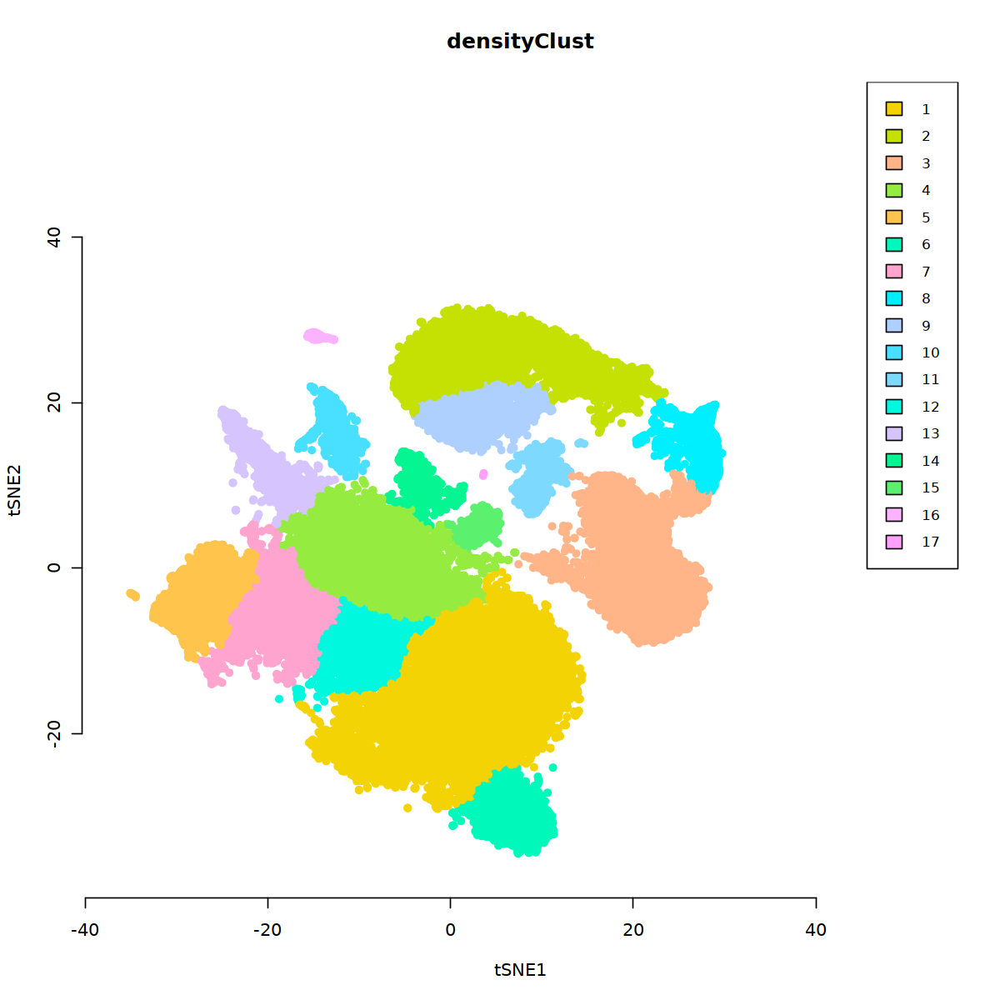

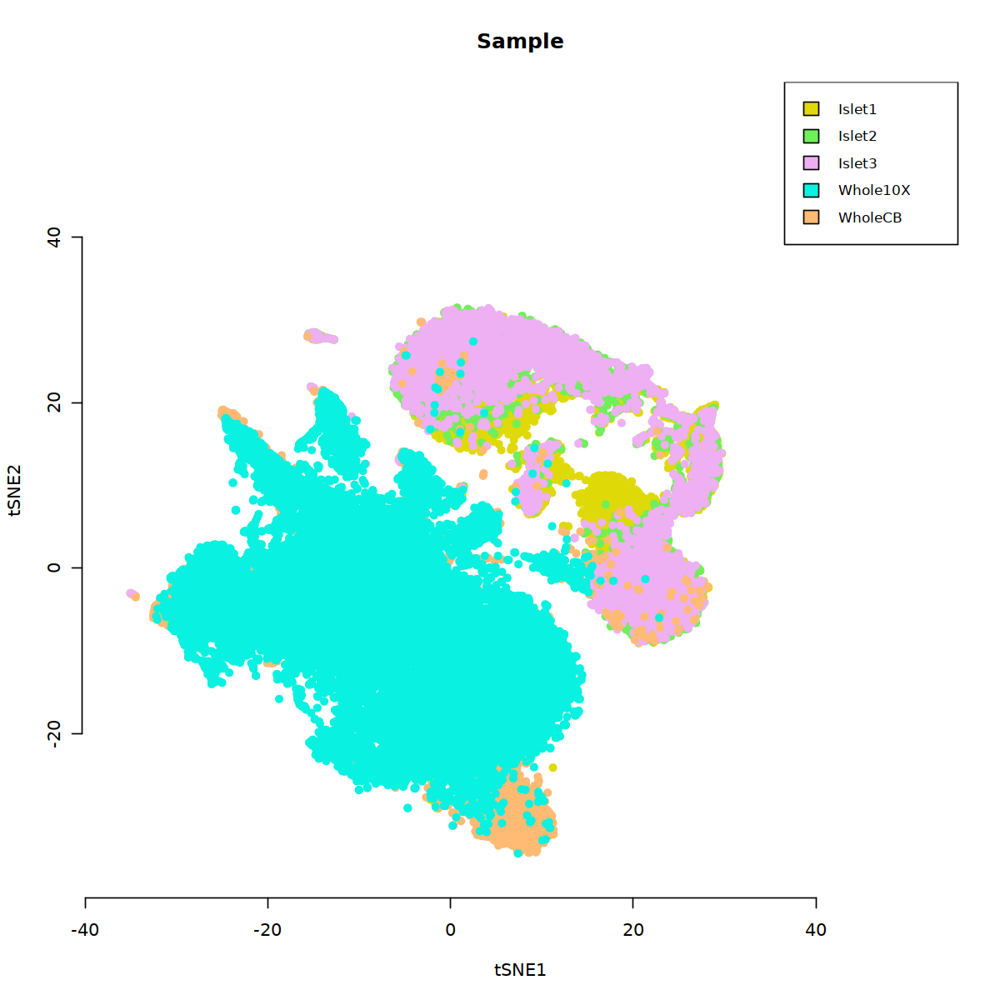

In [78]:
fig(10,10)
par(mfrow=c(1,1))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell',
             topic_contr=NULL,
             colorBy=c('nCounts', 'nAcc','densityClust', 'Sample'),
             cex.legend = 0.8,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10,
            lable=TRUE)


In [81]:
pdf(file = paste0(FIG_Dir,'CisTopic-tSNE-Clusters.pdf'),  
    width = 10, # The width of the plot in inches
    height = 10 # The height of the plot in inches
  # units = "cm",
   # res = 300) 
)


plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell',
             topic_contr=NULL,
             colorBy=c('nCounts', 'nAcc','densityClust'), #'graphBasedClusters_CRA'
             cex.legend = 0.8,
             cex.dot = .75,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10)

dev.off()

png 
  2

In [121]:
saveRDS(cisTopicObject, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_Embeddings.rds')

In [120]:
saveRDS(cisTopicObjectPerplexity97Topics, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')


# cisTopic TSNE with Harmony

## Read RDS

In [7]:
setwd(RDS_Dir)
getwd()
list.files()
#Load Data
cisTopicObject <- readRDS('SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"                    
[2] "SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds"
[3] "SKT012.01.02_CisTopic_Hg38PancreasCombined_Embeddings.rds"         
[4] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds"   
[5] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA.rds"

## Harmony

In [8]:
library(harmony)

Loading required package: Rcpp

Warning message:
“package ‘Rcpp’ was built under R version 4.0.5”


In [9]:
# retrieve normalised topic-cell and region-topic assignments
TopicCellContribution <- modelMatSelection(cisTopicObject, 'cell', 'Probability')
TopicCellContribution

,GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,AGACACCTCCTAAGACATCTGAGTTATAG_Islet1,...,GCCAGACCAGACTAAA-1_Whole10X,GCCATAAGTACGCCCA-1_Whole10X,GCCCGAATCACGGGTC-1_Whole10X,GCGAGTCGTACTAGAA-1_Whole10X,GCTCGAGGTTACCCAA-1_Whole10X,GCTTGCTCACAGTTAC-1_Whole10X,TGACTCCAGACTAGGC-1_Whole10X,TGGAAGGCACAGGTAG-1_Whole10X,TGTACGAAGAACTAAC-1_Whole10X,TTGCACCAGACGAAAG-1_Whole10X
Topic1,3.517280e-03,5.100061e-04,1.937416e-04,3.657867e-04,1.718365e-03,1.494855e-03,1.384200e-03,1.374382e-03,1.017255e-02,3.316361e-03,...,0.0279661017,0.0888297872,0.0050724638,0.0190082645,0.1666666667,0.0904545455,0.0030434783,0.047126437,0.0000000000,0.0073913043
Topic2,5.348903e-03,7.433893e-03,4.391475e-03,1.450954e-03,4.542296e-03,1.003041e-03,1.022282e-02,4.556075e-03,9.831461e-04,1.386842e-02,...,0.0033898305,0.0000000000,0.0161835749,0.0000000000,0.0017857143,0.0195454545,0.0030434783,0.008045977,0.0104838710,0.0686956522
Topic3,1.883417e-04,2.200787e-03,4.696765e-05,6.706090e-05,3.619938e-03,5.047564e-04,3.828494e-03,2.858714e-03,4.012841e-04,5.024789e-03,...,0.0076271186,0.0101063830,0.0033816425,0.0057851240,0.0053571429,0.0081818182,0.0043478261,0.002298851,0.0032258065,0.0017391304
Topic4,1.789246e-04,1.441322e-04,2.935478e-05,1.219289e-05,0.000000e+00,1.941371e-05,2.700878e-05,4.260583e-04,1.805778e-04,3.349859e-05,...,0.0016949153,0.0042553191,0.0019323671,0.0578512397,0.0083333333,0.0009090909,0.0004347826,0.012643678,0.0370967742,0.0086956522
Topic5,3.018646e-02,2.194689e-02,5.260964e-02,4.206548e-03,3.651526e-02,1.474147e-02,4.118163e-02,1.034222e-02,1.245987e-02,2.988744e-02,...,0.0127118644,0.0010638298,0.0021739130,0.0438016529,0.0035714286,0.0031818182,0.0017391304,0.001149425,0.0016129032,0.0008695652
Topic6,4.360109e-03,9.257719e-04,5.518699e-04,4.206548e-04,9.792154e-04,1.339546e-03,7.022282e-04,3.992578e-03,1.243981e-03,2.298003e-03,...,0.0008474576,0.0170212766,0.0478260870,0.0148760331,0.0077380952,0.0268181818,0.0004347826,0.004597701,0.0387096774,0.0017391304
Topic7,1.039175e-02,9.967293e-03,1.494158e-02,5.196610e-02,6.323836e-03,4.742121e-02,5.259959e-03,1.023227e-02,1.484751e-03,2.081603e-02,...,0.0525423729,0.0037234043,0.0048309179,0.0454545455,0.0017857143,0.0040909091,0.0004347826,0.002298851,0.0000000000,0.0013043478
Topic8,2.825125e-05,2.771772e-05,5.870956e-06,8.535024e-05,3.790511e-05,3.365042e-04,2.700878e-05,2.061572e-05,6.019262e-04,4.287820e-04,...,0.0025423729,0.0000000000,0.0070048309,0.0066115702,0.0005952381,0.0109090909,0.0000000000,0.089655172,0.0016129032,0.0013043478
Topic9,1.320275e-02,3.087754e-03,5.870956e-05,7.925380e-05,5.054015e-05,1.412671e-02,2.700878e-05,2.179769e-02,2.110754e-02,8.468444e-03,...,0.0000000000,0.0015957447,0.0009661836,0.0173553719,0.0023809524,0.0072727273,0.0065217391,0.000000000,0.0072580645,0.0026086957
Topic10,1.044825e-02,1.230667e-02,9.822110e-03,6.096446e-06,2.698844e-02,2.413771e-03,3.391627e-02,4.927158e-03,6.801766e-03,3.272813e-02,...,0.0033898305,0.0085106383,0.0002415459,0.0057851240,0.0000000000,0.0000000000,0.0000000000,0.008045977,0.0032258065,0.0021739130


In [10]:
cisTopicObject@cell.data %>% colnames


[1] "nCounts"                 "nAcc"                   
[3] "densityClust"            "Sample"                 
[5] "Tissue_Prep"             "scATAC_methods"         
[7] "densityClustProbHarmony"

In [11]:
cisTopicObject@cell.data$Sample %>% unique

[1] "Islet1"   "Islet2"   "Islet3"   "WholeCB"  "Whole10X"

In [12]:
my_harmony_embeddings <- HarmonyMatrix(TopicCellContribution,
                                       cisTopicObject@cell.data,
                                       c("Sample", "Tissue_Prep", "scATAC_methods"),
                                       do_pca=FALSE)

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



In [13]:
my_harmony_embeddings %>% head

,GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,AGACACCTCCTAAGACATCTGAGTTATAG_Islet1,...,GCCAGACCAGACTAAA-1_Whole10X,GCCATAAGTACGCCCA-1_Whole10X,GCCCGAATCACGGGTC-1_Whole10X,GCGAGTCGTACTAGAA-1_Whole10X,GCTCGAGGTTACCCAA-1_Whole10X,GCTTGCTCACAGTTAC-1_Whole10X,TGACTCCAGACTAGGC-1_Whole10X,TGGAAGGCACAGGTAG-1_Whole10X,TGTACGAAGAACTAAC-1_Whole10X,TTGCACCAGACGAAAG-1_Whole10X
Topic1,0.0372121084,0.032555319,0.0339859961,0.0070738711,0.0353685930,0.016775967,0.032854910,0.011409377,0.035427167,0.0350876163,...,0.019020865,0.068685118,-0.0159872911,0.006843070,0.146592093,0.0709248556,-0.005687080,0.034728167,-0.0090013244,0.0022140880
Topic2,0.0103512424,0.011929785,0.0094186825,0.0069171573,0.0095196398,0.004565690,0.014581025,0.002073181,0.003643113,0.0185813027,...,0.012011565,0.009350353,0.0254535000,0.007319752,0.011090203,0.0287323847,0.009642165,0.016841270,0.0191096174,0.0762983996
Topic3,0.0007235197,0.002774260,0.0005764631,0.0011484697,0.0041583756,0.001437445,0.004372330,0.004022724,0.001155542,0.0056026162,...,0.006922855,0.010069183,0.0033935587,0.005300983,0.005316894,0.0081142076,0.003674325,0.002308850,0.0025243638,0.0025470806
Topic4,0.0009795339,0.001180686,0.0008344639,0.0005328586,0.0008304213,0.001351638,0.001205804,0.004144403,0.001888188,0.0009377355,...,-0.003021653,0.002829278,0.0006964287,0.056337046,0.006886690,-0.0005422923,-0.001297741,0.008980164,0.0323908902,0.0078383806
Topic5,0.0258330418,0.017820457,0.0481906186,0.0055179477,0.0321030138,0.014194531,0.036910484,0.011085890,0.009905777,0.0259467040,...,0.011844559,0.018319247,0.0200228055,0.052305525,0.020491530,0.0194704677,0.005448949,0.012854325,0.0008121895,0.0003742734
Topic6,0.0241099073,0.019876285,0.0203653209,0.0052220710,0.0207428567,0.011215258,0.019374850,0.011639950,0.016648725,0.0210292052,...,-0.006941347,0.003102884,0.0335000077,0.005849235,-0.006107297,0.0133246875,-0.006523350,-0.004846560,0.0308899366,-0.0018363546


In [15]:
save(my_harmony_embeddings, file=paste0(DATA_Dir,"my_harmony_embeddings"))

## Dimension Reduction: tSNE

In [ ]:
# Dimension Reduction
tSNE_coords <- Rtsne(t(my_harmony_embeddings), perplexity=100, seed=1234, pca=F)

### Save whole Rtsne output

In [79]:
save(tSNE_coords, file=paste0(DATA_Dir,"CisTopic_Hg38Pancreas_Harmony_tSNE_ParametersList"))

In [71]:
write.csv(as.matrix(tSNE_coords), paste0(DATA_Dir, "CisTopic_Hg38Pancreas_Harmony_tSNE_ParametersList.csv"))

### Save tSNE coordinates only

In [67]:
tSNE_coords_df <- tSNE_coords$Y %>% as.data.frame 
rownames(tSNE_coords_df) <- cisTopicObject@cell.names
tSNE_coords_df %>% head

,V1,V2
,<dbl>,<dbl>
GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,7.738803,-12.477171
AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,7.425526,-12.374702
GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,-4.323234,-13.941760
AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,10.302021,-9.238922
CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,-9.773653,-14.330709
GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,19.001541,-10.428318


In [68]:
write.csv(as.matrix(tSNE_coords_df), paste0(DATA_Dir, "CisTopic_Hg38Pancreas_Harmony_tSNE.csv"))

## Clustering

### Add Chiou cell type annotation

In [154]:
# This is the cluster label downloaded from Chiou et al. 2022 Nature Genetics

ClusterLabel <- read.table(
  file = paste0(ChiouNatGen_T2D,"GSE160472_islet_snATAC.cluster_labels.txt.gz"),
    sep = "\t",
        header = FALSE,
#    row.names = 1,
    col.names = c("CellId","UMAP1", "UMAP2", "Chiou")
)


In [155]:
AdjustedClusterLabel <- ClusterLabel %>% 
    separate(col = CellId, sep =  "_", into = c("Sample", "Barcode"), remove = FALSE) %>%
    mutate(X = str_c(Barcode,"_",Sample)) %>%
    select(X, Chiou)

AdjustedClusterLabel %>% head(5)



,X,Chiou
,<chr>,<chr>
1,AGACACCTAAGAGGCAAAGGAGTAGGCTC_Islet1,alpha_2
2,AGACACCTAAGAGGCAAAGGAGTAGGTTG_Islet1,beta_2
3,AGACACCTAAGAGGCAAAGGCTATATAGA_Islet1,immune
4,AGACACCTAAGAGGCAACTGCATAGTACT_Islet1,alpha_1
5,AGACACCTAAGAGGCACCTAGAGTAGGCG_Islet1,beta_1


In [157]:
cisTopicObject@cell.data  <- cisTopicObject@cell.data %>% 
                            rownames_to_column("X") %>%
                            left_join(AdjustedClusterLabel, ) %>% 
                            column_to_rownames("X")

Joining, by = "X"


### Define Clusters

densityClust

This function takes a distance matrix and optionally a distance cutoff and calculates the values necessary for clustering based on the algorithm proposed by Alex Rodrigues and Alessandro Laio (see references). The actual assignment to clusters are done in a later step, based on user defined threshold values. If a distance matrix is passed into distance the original algorithm described in the paper is used. If a matrix or data.frame is passed instead it is interpretted as point coordinates and rho will be estimated based on k-nearest neighbors of each point (rho is estimated as exp(-mean(x)) where x is the distance to the nearest neighbors). This can be useful when data is so large that calculating the full distance matrix can be prohibitive.

In [17]:
load(file="/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/cisTopic/CisTopic_Hg38Pancreas_Harmony_tSNE_ParametersList")

In [105]:
tSNE_coords %>% str

List of 14
 $ N                  : int 40049
 $ Y                  :'data.frame':	40049 obs. of  2 variables:
  ..$ V1: num [1:40049] 7.74 7.43 -4.32 10.3 -9.77 ...
  ..$ V2: num [1:40049] -12.48 -12.37 -13.94 -9.24 -14.33 ...
 $ costs              : num [1:40049] 8.43e-05 6.86e-05 7.99e-05 1.30e-04 3.37e-04 ...
 $ itercosts          : num [1:20] 96.5 96.5 94.6 89 88.5 ...
 $ origD              : int 97
 $ perplexity         : num 100
 $ theta              : num 0.5
 $ max_iter           : num 1000
 $ stop_lying_iter    : int 250
 $ mom_switch_iter    : int 250
 $ momentum           : num 0.5
 $ final_momentum     : num 0.8
 $ eta                : num 200
 $ exaggeration_factor: num 12


In [106]:
# Density Cluster

# Distance
# This function computes and returns the distance matrix computed by using the specified distance measure 
# to compute the distances between the rows of a data matrix.
tSNE_coords_dist <- dist(tSNE_coords$Y)


# Clustering
dclust <- densityClust(tSNE_coords_dist,gaussian=T)

Distance cutoff calculated to 2.434409 


In [107]:
dclust %>% str(max.level = 1)

List of 12
 $ rho                            : Named num [1:40049] 176 182 638 466 907 ...
  ..- attr(*, "names")= chr [1:40049] "GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1" "AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1" "GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1" "AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1" ...
 $ delta                          : Named num [1:40049] 0.0579 0.0589 0.0099 0.0963 0.1132 ...
  ..- attr(*, "names")= chr [1:40049] "GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1" "AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1" "GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1" "AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1" ...
 $ distance                       : 'dist' num [1:801941176] 0.33 12.15 4.13 17.61 11.45 ...
  ..- attr(*, "Size")= int 40049
  ..- attr(*, "Labels")= chr [1:40049] "GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1" "AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1" "GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1" "AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1" ...
  ..- attr(*, "Diag")= logi FALSE
  ..- attr(*, "Upper")= logi FALSE
  ..- attr(*, "method")=

In [171]:
# define clusters
# Setup threshold for rho and delta
dclust <- findClusters(dclust, rho = 40, delta = 1.5)

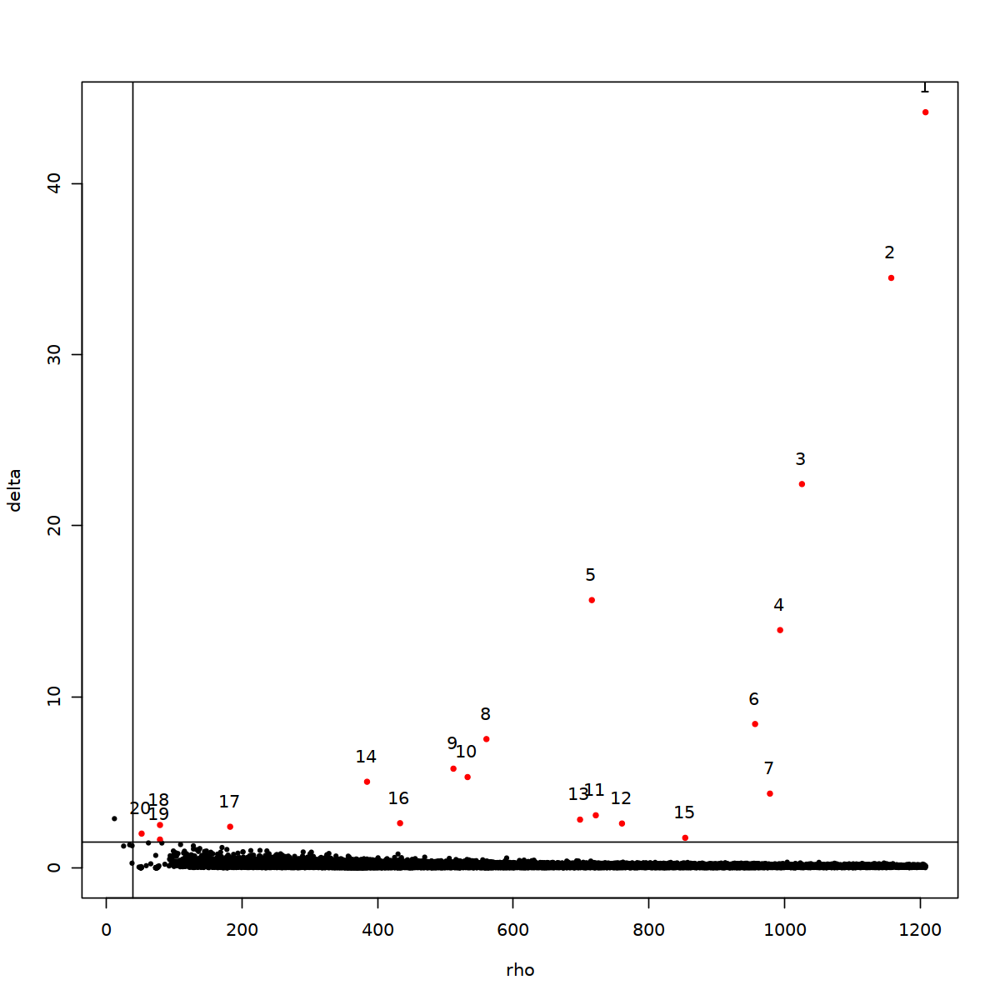

In [172]:
# Check thresholds
fig(10,10)

plot(dclust$rho,
     dclust$delta,
     pch=20,
     cex=0.6,
     xlab='rho',
     ylab='delta')
points(dclust$rho[dclust$peaks],
       dclust$delta[dclust$peaks],
       col="red",
       pch=20,
       cex=0.8)
text(dclust$rho[dclust$peaks]-2,
     dclust$delta[dclust$peaks]+1.5,
     labels=dclust$clusters[dclust$peaks])
abline(v=40)
abline(h=1.5)


### Plot tSNE coordinates and cluster information

In [111]:
# Add tSNE_Harmony coordinates in cisTopic object
cisTopicObject@dr$cell$tSNE_Harmony <- tSNE_coords$Y %>% `colnames<-`(c("tSNE1", "tSNE2")) %>% as.matrix

In [175]:
# Add cluster information in cisTopic object

densityClusters <- dclust$clusters %>%
                        as.data.frame %>%
                        `rownames<-`(cisTopicObject@cell.names) %>%
                        `colnames<-`('densityClustProbHarmony') %>%
                        mutate_if(is.integer,as.factor)

cisTopicObject <- addCellMetadata(cisTopicObject, densityClusters)

### Make a new function based of an existing cisTopic function

In [169]:
plotFeatures_SKT <- function(
  object,
  target,
  method='tSNE',
  colorBy=NULL,
  dim=2,
  intervals=10,
  topic_contr=NULL,
  topics=NULL,
  col.low = "pink",
  col.mid = "red",
  col.high = "darkred",
  labels=3,
  colVars=list(),
  plot_ly=FALSE,
  legend=TRUE,
  cex.legend=0.7,
  factor.min=0.05,
  factor.max=0.75,
  cex.dot=1,
  ...
){
  if (is.null(colorBy) && is.null(topic_contr)){
    stop('Please select whether to color by some feature or topic contributions.')
  }
  # Check dependencies
  if(! "plotly" %in% installed.packages() && plot_ly ){
    stop('Please, install plotly: \n install.packages("plotly")')
  }  else {
    require(plotly)
  }
  
  if(! "scatterplot3d" %in% installed.packages() && !plot_ly && dim == 3 ){
    stop('Please, install scatterplot3d: \n install.packages("scatterplot3d")')
  } else {
    require(scatterplot3d)
  }
  
  # Select coordinates to plot
  coordinates <- .selectCoordinates(object, target, method, dim)  
  
  # Select cell/region data
  if (target == 'cell'){
    feature.data <- object@cell.data[rownames(coordinates),]
  }
  else if (target == 'region'){
    feature.data <- object@region.data[rownames(coordinates),]
  }
  feature.names <- rownames(feature.data)
  
  # Get par values
  par.opts <- par()

  # Variables to color by
  if (!is.null(colorBy)){
    
    if (sum(colorBy %in% colnames(feature.data)) != length(colorBy)){
      stop(paste('The variable', colorBy[-which(colorBy %in% colnames(feature.data))], 'is not included in the', target, 'data. Please check and re-run.'))
    }
    
    for (columnName in colorBy){
      variable <- setNames(feature.data[,columnName], feature.names)
      
      # Continuous plotting
      if(is.numeric(variable)){
        colorPal <- grDevices::colorRampPalette(c(col.low, col.mid, col.high))
        if (method != 'Biplot'){
          .plotContinuous(coordinates, variable, feature.names, colorPal, main=columnName, intervals=intervals, dim=dim, plot_ly=plot_ly, legend=legend, factor.min = factor.min, factor.max=factor.max, cex.dot=cex.dot)
        }
        else{
          coordinates <- .rescaleVector(coordinates[,c(1:2)])
          var.coord <- .rescaleVector(object@dr[[target]][['PCA']]$var.coord[,c(1:2)])
          .plotContinuous(coordinates, variable, feature.names, colorPal, main=columnName, intervals=intervals, dim=2, var.coord=var.coord, plot_ly=plot_ly, legend=legend, factor.min = factor.min, factor.max=factor.max, cex.dot=cex.dot)
        }
        
      }
      
      else{
        if (method != 'Biplot'){
          .plotFactor(coordinates, variable, feature.names, main=columnName, dim=dim, colVars=colVars, plot_ly=plot_ly, legend=legend, cex.legend = cex.legend, factor.min = factor.min, factor.max=factor.max, cex.dot=cex.dot)
        }
        else{
          coordinates <- .rescaleVector(coordinates[,c(1:2)])
          var.coord <- .rescaleVector(object@dr[[target]][['PCA']]$var.coord[,c(1:2)])
          .plotFactor(coordinates, variable, feature.names, main=columnName, dim=2, var.coord=var.coord, colVars=colVars, plot_ly=plot_ly, legend=legend, cex.legend = cex.legend, factor.min = factor.min, factor.max = factor.max, cex.dot=cex.dot)
        }
      }
    }
  }

    
  if (!is.null(topic_contr)){
    topic.mat <- modelMatSelection(object, target, topic_contr)
    
    if (!is.null(topics)){
      topic.mat <- topic.mat[topics,,drop=FALSE]
    }
    
    colorPal <- grDevices::colorRampPalette(c(col.low, col.mid, col.high))
    for (i in 1:nrow(topic.mat)){
      if(method != 'Biplot'){
        .plotContinuous(coordinates, topic.mat[i,], feature.names, colorPal, main=rownames(topic.mat)[i], intervals=intervals, dim=dim, labels=labels, plot_ly=plot_ly, legend=legend, factor.min = factor.min, factor.max=factor.max, cex.dot=cex.dot)
      }
      else{
        coordinates <- .rescaleVector(coordinates[,c(1:2)])
        var.coord <- .rescaleVector(object@dr[[target]][['PCA']]$var.coord[,c(1:2)])
        .plotContinuous(coordinates, topic.mat[i,], feature.names, colorPal, main=rownames(topic.mat)[i], intervals=intervals, dim=2, var.coord = var.coord, labels=labels, plot_ly=plot_ly, legend=legend, factor.min = factor.min, factor.max=factor.max, cex.dot=cex.dot)
      }
    }
  }
  # Restore par
  suppressWarnings(par(par.opts))
}

# Adjust function in cisTopic package.

.selectCoordinates <- function(
  object,
  target,
  method,
  dim=dim
){
  if (!target %in% c('cell', 'region')){
    stop('Please, provide target="cell" or "region".')
  } 
  
  if (method == 'tSNE'){
    if (is.null(object@dr[[target]][['tSNE']])){
      stop(paste0('Please, run first: cisTopicObject <- runtSNE(cisTopicObject, target="', target,'", ...).'))
    }
    
    coordinates <- object@dr[[target]][['tSNE']]
    
    if (ncol(coordinates) == 2 && dim > 2){
      stop(paste0('Please, run first: cisTopicObject <- runtSNE(cisTopicObject, target="', target,'", dim=3 ...)for a 3D tSNE.'))
    }
  }
 
# Add new condition: tSNE Harmony    
    
     else if (method == 'tSNE_Harmony'){
    if (is.null(object@dr[[target]][['tSNE_Harmony']])){
      stop(paste0('Please, run first: cisTopicObject <- runUmap(cisTopicObject, target="', target,'", ...).'))
    }
    
    coordinates <- object@dr[[target]][['tSNE_Harmony']]
    
    if (ncol(coordinates) == 2 && dim > 2){
      stop(paste0('Please, run first: cisTopicObject <- runUmap(cisTopicObject, target="', target,'", n_components=3 ...)for a 3D tSNE.'))
    }
  }
    
# end adjustment    
  
  else if (method == 'Umap'){
    if (is.null(object@dr[[target]][['Umap']])){
      stop(paste0('Please, run first: cisTopicObject <- runUmap(cisTopicObject, target="', target,'", ...).'))
    }
    
    coordinates <- object@dr[[target]][['Umap']]
    
    if (ncol(coordinates) == 2 && dim > 2){
      stop(paste0('Please, run first: cisTopicObject <- runUmap(cisTopicObject, target="', target,'", n_components=3 ...)for a 3D tSNE.'))
    }
  }
  
  else if (method == 'PCA' || method == 'Biplot'){
    if (is.null(object@dr[[target]][['PCA']])){
      stop(paste0('Please, run first: cisTopicObject <- runPCA(cisTopicObject, target="', target,'", ...).'))
    }
    coordinates <- object@dr[[target]][['PCA']]$ind.coord
  }
  
  else if (method == 'DM'){
    if (is.null(object@dr[[target]][['DiffusionMap']])){
      stop(paste0('Please, run first: cisTopicObject <- runDM(cisTopicObject, target="', target,'", ...).'))
    }
    coordinates <- object@dr[[target]][['DiffusionMap']]
  }
  return(coordinates)
}


.plotContinuous <- function(
  coordinates,
  variable,
  names,
  colorPal,
  main,
  intervals,
  dim=2,
  var.coord=NULL,
  labels=3,
  plot_ly=FALSE,
  legend=TRUE,
  factor.min=0.05,
  factor.max=0.2,
  cex.dot=1,
  ...
){
  cellColor <- setNames(adjustcolor(colorPal(intervals), alpha=.8)[as.numeric(cut(variable,breaks=10, right=F,include.lowest=T))], names)
  par(bty='n')
  
  if (!is.null(var.coord)){
    # Plot the correlation circle
    a <- seq(0, 2*pi, length = 100)
    plot(cos(a), sin(a), type = 'l', col="gray", xlab = "PC1",  ylab = "PC2", xlim = c(-1-factor.min, 1+factor.max), ylim= c(-1-factor.min, 1+factor.max))
    abline(h = 0, v = 0, lty = 2)

    # Plot dots
    points(coordinates, col=cellColor[rownames(coordinates)], pch=16, cex=cex.dot)

    # Add active variables
    arrows(0, 0, var.coord[, 1], var.coord[, 2], length = 0.1, angle = 15, code = 2)

    # Add labels
    text(var.coord, labels=rownames(var.coord), cex = 0.75, adj=1, font=2)
  }
  else{
    if (dim == 2){
      if (!plot_ly){
        plot(coordinates, col=cellColor[rownames(coordinates)], pch=16, xlab=colnames(coordinates)[1], ylab=colnames(coordinates)[2], xlim = c(min(coordinates[,1])-factor.min*abs(min(coordinates[,1])), max(coordinates[,1])+factor.max*abs(max(coordinates[,1]))), 
             ylim=c(min(coordinates[,2])-factor.min*abs(min(coordinates[,2])), max(coordinates[,2])+factor.max*abs(max(coordinates[,2]))), main=main, cex=cex.dot)
      } else {
        p <- plot_ly(x = coordinates[,1], y = coordinates[,2], color = variable, colors=adjustcolor(colorPal(intervals), alpha=.8)) %>%
          add_markers() %>%
          layout(title = main,
                 scene = list(xaxis = list(title = colnames(coordinates)[1]),
                 yaxis = list(title = colnames(coordinates)[2])))
        print(p)
      }
    }
    if (dim == 3) {
      if (!plot_ly){
        scatterplot3d(coordinates[,1], coordinates[,2], coordinates[,3], color=cellColor[rownames(coordinates)], pch=16, xlab=colnames(coordinates)[1], ylab=colnames(coordinates)[2], zlab = colnames(coordinates)[3], main=main,
                      xlim = c(min(coordinates[,1])-factor.min*abs(min(coordinates[,1])), max(coordinates[,1])+factor.max*abs(max(coordinates[,1]))), ylim = c(min(coordinates[,2])-factor.min*abs(min(coordinates[,2])), max(coordinates[,2])+factor.max*abs(max(coordinates[,2]))),
                      zlim = c(min(coordinates[,3])-factor.min*abs(min(coordinates[,3])), max(coordinates[,3])+factor.max*abs(max(coordinates[,3]))), cex.symbols=cex.dot)
      } else {
        p <- plot_ly(x = coordinates[,1], y = coordinates[,2], z = coordinates[,3], color = variable, colors=adjustcolor(colorPal(intervals), alpha=.8)) %>%
          add_markers() %>%
          layout(title = main,
                 scene = list(xaxis = list(title = colnames(coordinates)[1]),
                 yaxis = list(title = colnames(coordinates)[2]),
                 zaxis = list(title = colnames(coordinates)[3])))
        print(p)
      }
    }
  }
  
  if (!plot_ly){
    if (legend){
      .vertical.image.legend(c(min(variable), max(variable)), colorPal(intervals))
    } else {
      plot.new()
      .vertical.image.legend(c(min(variable), max(variable)), colorPal(intervals))
    }
  }
}

.distinctColorPalette <-function(k) {
  set.seed(123)
  if(packageVersion("scales") >= '1.1.0'){
    ColorSpace <- t(unique(col2rgb(scales::hue_pal(l=85)(2e3))))
  } else {
    ColorSpace <- t(unique(col2rgb(scales::hue_pal(l=60:100)(2e3))))
  }
  km <- kmeans(ColorSpace, k, iter.max=20)
  colors <- rgb(round(km$centers), maxColorValue=255)
  return(colors)
}

# Adapted from aqfig


.vertical.image.legend <- function(zlim, col){
  starting.par.settings <- par(no.readonly=TRUE)
  mai <- par("mai")
  fin <- par("fin")
  x.legend.fig <- c( 1.0-(mai[4]/fin[1]), 1.0 )
  y.legend.fig <- c( mai[1]/fin[2], 1.0-(mai[3]/fin[2]) )
  x.legend.plt <- c( x.legend.fig[1]+(0.08*(x.legend.fig[2]-x.legend.fig[1])),
                     x.legend.fig[2]-(0.6*(x.legend.fig[2]-x.legend.fig[1])) )
  y.legend.plt <- y.legend.fig
  cut.pts <- seq(zlim[1], zlim[2], length=length(col)+1)
  z <- ( cut.pts[1:length(col)] + cut.pts[2:(length(col)+1)] ) / 2
  par(new=TRUE, pty="m", plt=c(x.legend.plt, y.legend.plt), bty='o')
  image(x=1, y=z, z=matrix(z, nrow=1, ncol=length(col)),
        col=col, xlab="", ylab="", xaxt="n", yaxt="n")
  axis(4, mgp = c(3, 0.2, 0), las = 2, cex.axis=0.6, tcl=-0.1)
  box()
  mfg.settings <- par()$mfg
  par(starting.par.settings)
  par(mfg=mfg.settings, new=FALSE)
}

.plotFactor <- function(
  coordinates,
  variable,
  names,
  main,
  dim=2,
  var.coord=NULL,
  colVars=list(),
  plot_ly = FALSE,
  legend = TRUE, 
  cex.legend=0.7,
  factor.min=0.05,
  factor.max=0.5,
  cex.dot=1,
  ...
){
  levels <- as.vector(sort(unique(variable)))
  
  if(is.null(colVars[[main]])) {
    colVars[[main]] <- setNames(.distinctColorPalette(k=length(levels)), levels)
  }
  
  cellColor <- setNames(colVars[[main]][variable], names)
  
  par(bty = 'n')
  
  if (!is.null(var.coord)){
    # Plot the correlation circle
    a <- seq(0, 2*pi, length = 100)
    plot(cos(a), sin(a), type = 'l', col="gray", xlab = "PC1",  ylab = "PC2", xlim = c(-1-factor.min, 1+factor.max), ylim = c(-1-factor.min, 1+factor.max))
    abline(h = 0, v = 0, lty = 2)

    # Plot dots
    points(coordinates, col=cellColor[rownames(coordinates)], pch=16, cex=cex.dot)

    # Add active variables
    arrows(0, 0, var.coord[, 1], var.coord[, 2], length = 0.1, angle = 15, code = 2)

    # Add labels
    text(var.coord, labels=rownames(var.coord), cex = 0.75, adj=1, font=2)
  }
  else{
    if (dim == 2){
      if (!plot_ly){
        plot(coordinates, col=cellColor[rownames(coordinates)], pch=16, xlab=colnames(coordinates)[1], ylab=colnames(coordinates)[2], xlim = c(min(coordinates[,1])-factor.min*abs(min(coordinates[,1])), max(coordinates[,1])+factor.max*abs(max(coordinates[,1]))), 
             ylim=c(min(coordinates[,2])-factor.min*abs(min(coordinates[,2])), max(coordinates[,2])+factor.max*abs(max(coordinates[,2]))), main=main, cex=cex.dot)
      } else {
        p <- plot_ly(x = coordinates[,1], y = coordinates[,2], color = variable, colors= unique(colVars[[main]][variable])) %>%
          add_markers() %>%
          layout(title = main,
                 scene = list(xaxis = list(title = colnames(coordinates)[1]),
                 yaxis = list(title = colnames(coordinates)[2])))
        print(p)
      }
    }
    if (dim == 3) {
      if (!plot_ly){
        s3d <-  scatterplot3d(coordinates[,1], coordinates[,2], coordinates[,3], color=cellColor[rownames(coordinates)], pch=16, xlab=colnames(coordinates)[1], ylab=colnames(coordinates)[2], zlab = colnames(coordinates)[3], main=main, 
                              xlim = c(min(coordinates[,1])-factor.min*abs(min(coordinates[,1])), max(coordinates[,1])+factor.max*abs(max(coordinates[,1]))), ylim = c(min(coordinates[,2])-factor.min*abs(min(coordinates[,2])), max(coordinates[,2])+factor.max*abs(max(coordinates[,2]))),
                              zlim = c(min(coordinates[,3])-factor.min*abs(min(coordinates[,3])), max(coordinates[,3])+factor.max*abs(max(coordinates[,3]))), cex.symbols=cex.dot)
      } else {
        p <- plot_ly(x = coordinates[,1], y = coordinates[,2], z = coordinates[,3], color = variable, colors = unique(colVars[[main]][variable])) %>%
          add_markers() %>%
          layout(title = main,
                 scene = list(xaxis = list(title = colnames(coordinates)[1]),
                 yaxis = list(title = colnames(coordinates)[2]),
                 zaxis = list(title = colnames(coordinates)[3])))
        print(p)
      }
    }
  }
  
  if (!plot_ly){
    if (legend){
      if (dim == 2){
        legend("topright", legend =  names(colVars[[main]]), fill=colVars[[main]], cex=cex.legend)
      } else {
        legend(s3d$xyz.convert(max(coordinates[,1]), max(coordinates[,2]), max(coordinates[,3])), fill = colVars[[main]], legend = names(colVars[[main]]), cex = cex.legend)
      }
    }
    else {
      plot.new()
      legend(x="top", legend = names(colVars[[main]]), fill=colVars[[main]], cex=cex.legend, title=as.expression(bquote(bold(.(main)))))
    }
  }
}

.rescaleVector<- function(coordinates){
  vectors.length <- apply(coordinates, 1, function(x) sqrt(x[1]^2+x[2]^2))
  target.vector.length <- vectors.length/max(vectors.length)
  new.rescaled <- t(sapply(1:nrow(coordinates), function(i) (coordinates[i,]/sqrt(sum(coordinates[i,]^2))*target.vector.length[i])))
  rownames(new.rescaled) <- rownames(coordinates)
  return(new.rescaled)
}

### Plot tSNE

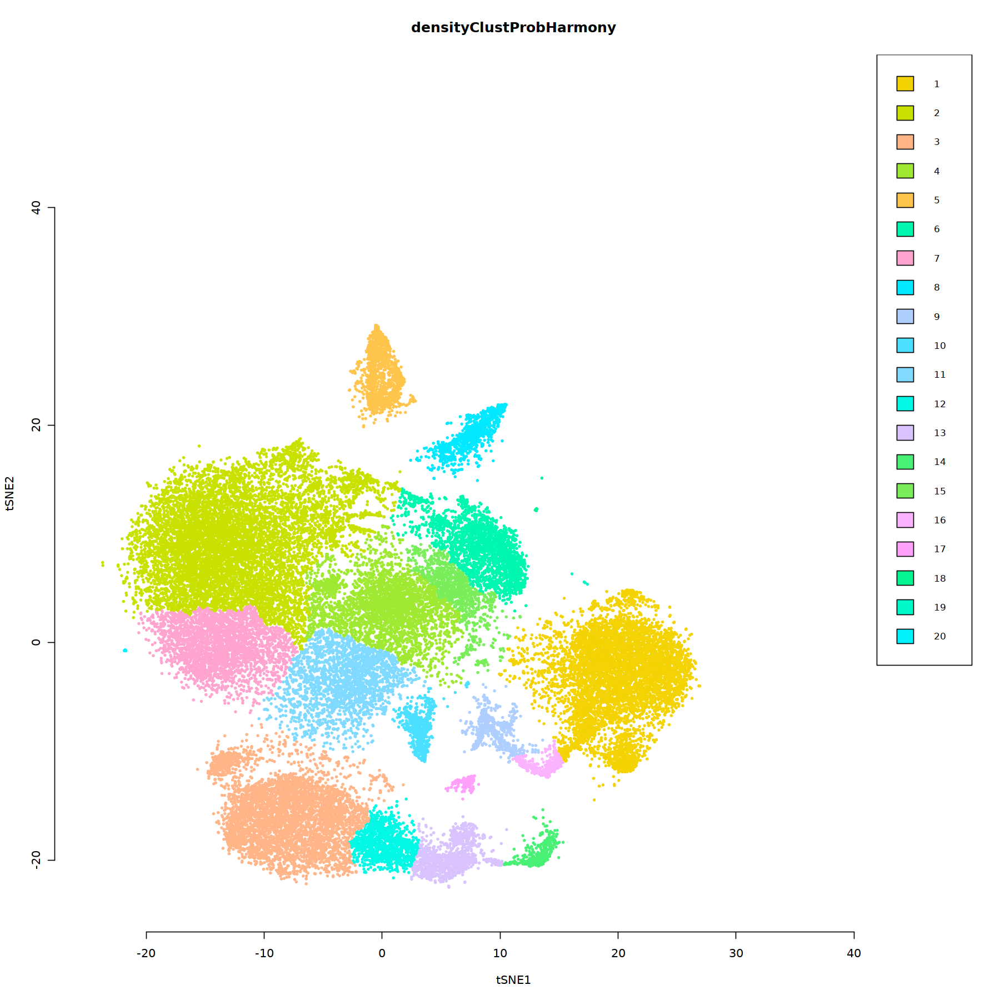

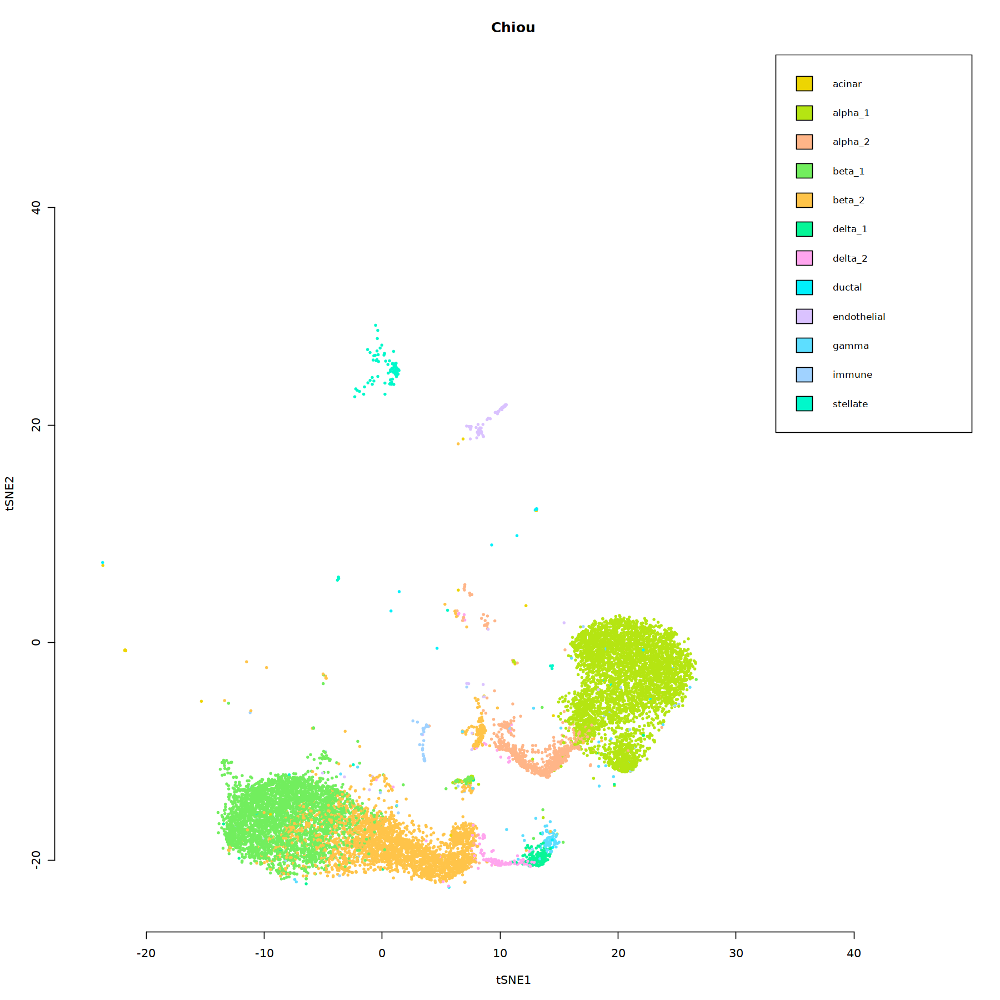

In [176]:
fig(15,15)
par(mfrow=c(1,1))
plotFeatures_SKT(cisTopicObject,
             method='tSNE_Harmony',
             target='cell',
             topic_contr=NULL,
             colorBy=c('densityClustProbHarmony', 'Chiou'),
             cex.legend = 0.8,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10,
            lable=TRUE,
                cex.dot = .5)


In [70]:
write.csv(as.matrix(dclust), paste0(DATA_Dir, "CisTopic_Hg38Pancreas_Harmony_tSNE_DensityCluster.csv"))

## Save RDS

In [121]:
saveRDS(cisTopicObject, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_Embeddings.rds')

In [120]:
saveRDS(cisTopicObjectPerplexity97Topics, file='SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

# Topic Distribution

## Load RDS

In [9]:
setwd(RDS_Dir)
getwd()
list.files()
#Load Data
cisTopicObject <- readRDS('SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"                    
[2] "SKT012.01.02_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds"
[3] "SKT012.01.02_CisTopic_Hg38PancreasCombined_Embeddings.rds"         
[4] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds"   
[5] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA.rds"

In [49]:
library(fastcluster)
library(Cairo)
library(grid)
library(ComplexHeatmap)

## Heatmap

In [50]:
cisTopicObject@cell.data %>% str

'data.frame':	40049 obs. of  7 variables:
 $ nCounts                : num  26829 21887 21097 22475 19370 ...
 $ nAcc                   : num  21238 18039 17033 16403 15829 ...
 $ densityClust           : Factor w/ 17 levels "1","2","3","4",..: 11 11 9 8 9 3 9 3 3 11 ...
 $ Sample                 : chr  "Islet1" "Islet1" "Islet1" "Islet1" ...
 $ Tissue_Prep            : chr  "Islets" "Islets" "Islets" "Islets" ...
 $ scATAC_methods         : chr  "CB" "CB" "CB" "CB" ...
 $ densityClustProbHarmony: Factor w/ 18 levels "1","2","3","4",..: 2 2 3 12 3 2 3 2 2 2 ...


In [51]:
library(magick)

In [59]:
# Select topic-cell matrix
topicCell <- t(modelMatSelection(cisTopicObject, method='Probability', target='cell'))

In [68]:
cisTopicObject@cell.data

,nCounts,nAcc,densityClust,Sample,Tissue_Prep,scATAC_methods,densityClustProbHarmony
,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<fct>
GAGATTCCGCGTAGTAAAGGCTATGTACT_Islet1,26829,21238,11,Islet1,Islets,CB,2
AGACACCTTAGGCATGCCTAGAGTGTACT_Islet1,21887,18039,11,Islet1,Islets,CB,2
GAGATTCCTAAGGCGACTAAGCCTGTACT_Islet1,21097,17033,9,Islet1,Islets,CB,3
AGACACCTTCCTGAGCCCTAGAGTGTACT_Islet1,22475,16403,8,Islet1,Islets,CB,12
CTATTAGGACTGAGCGCTCTCTATGTACT_Islet1,19370,15829,9,Islet1,Islets,CB,3
GAGATTCCTAGCGCTCCCTAGAGTGTACT_Islet1,18139,15453,3,Islet1,Islets,CB,2
GAGATTCCCGTACTAGCCTAGAGTTATAG_Islet1,17632,14810,9,Islet1,Islets,CB,3
CTATTAGGTCGACGTCTTCTAGCTTATAG_Islet1,17249,14552,3,Islet1,Islets,CB,2
AGACACCTATGCGCAGTTATGCGAGTACT_Islet1,5436,4984,3,Islet1,Islets,CB,2


In [ ]:
maxs <- max.col(as.matrix(topicCell))
names(maxs) <- rownames(topicCell)
order <- names(maxs)
class <- as.vector(unlist(cisTopicObject@cell.data$Cell_type))



In [9]:
# Sort cells by topic enrichment
maxs <- max.col(as.matrix(sub.topicCell))
names(maxs) <- rownames(sub.topicCell)
maxs <-  sort(maxs)
order <- names(maxs)
class <- as.vector(unlist(cisTopicObject@cell.data$Cell_type))
names(class) <- cisTopicObject@cell.names
order <- c(names(class)[which(class == 'Peripodial_membrane_medial')], names(class)[which(class == 'Peripodial_membrane_lateral')], names(class)[which(class == 'Head_vertex')], names(class)[which(class == 'Antenna_A1')], names(class)[which(class == 'Antenna_A2a')], names(class)[which(class == 'Antenna_A2b')], names(class)[which(class == 'Antenna_A3_Arista')], names(class)[which(class == 'AMF_Prec')], names(class)[which(class == 'AMF_Prog')], names(class)[which(class == 'MF_Morphogenetic_Furrow')], names(class)[which(class == 'PMF_PR_Early')], names(class)[which(class == 'PMF_PR_Late/CC')], names(class)[which(class == 'PMF_Interommatidial')], names(class)[which(class == 'PMF_Interommatidial_Late')], names(class)[which(class == 'Glia')], names(class)[which(class == 'twi_cells')], names(class)[which(class == 'Hemocytes')])
class <- class[order]
# Order JOP subpopulation based on JOP topic
JOPs_names <- names(class)[which(class == 'Antenna_A2b')]
JOPs <- sub.topicCell[JOPs_names, '29_JOP']
names(JOPs) <- JOPs_names
JOPs <- sort(JOPs)
class[JOPs_names] <- class[names(JOPs)]
order <- c(names(class)[which(class == 'Peripodial_membrane_medial')], names(class)[which(class == 'Peripodial_membrane_lateral')], names(class)[which(class == 'Head_vertex')], names(class)[which(class == 'Antenna_A1')], names(class)[which(class == 'Antenna_A2a')], names(JOPs), names(class)[which(class == 'Antenna_A3_Arista')], names(class)[which(class == 'AMF_Prec')], names(class)[which(class == 'AMF_Prog')], names(class)[which(class == 'MF_Morphogenetic_Furrow')], names(class)[which(class == 'PMF_PR_Early')], names(class)[which(class == 'PMF_PR_Late/CC')], names(class)[which(class == 'PMF_Interommatidial')], names(class)[which(class == 'PMF_Interommatidial_Late')], names(class)[which(class == 'Glia')], names(class)[which(class == 'twi_cells')], names(class)[which(class == 'Hemocytes')])
class <- class[order]
# Set colors
topicCell <- t(topicCell[order,])
colors <- readRDS('Figure_2/Processed_data/cisTopic/Cell_Type_ColVars.Rds')
colors['PMF_Interommatidial_Late'] <- colors['PMF_Interommatidial']
colVars <- list()
colVars[['Celltype']] <- colors
# Set annotation
color_cells <- setNames(colors[class], names(class))
class_fr <- as.data.frame(class)
rownames(class_fr) <- names(class)
colnames(class_fr) <- 'Celltype'
# Heatmap
library(ComplexHeatmap)
colorPal <- grDevices::colorRampPalette(c('floralwhite', 'red', 'darkred'))
annotation <- ComplexHeatmap::HeatmapAnnotation(df = class_fr, col = colVars, which='column', annotation_legend_param = list(labels_gp = gpar(fontsize = 5)))
heatmap <- ComplexHeatmap::Heatmap(data.matrix(topicCell), col=colorPal(20), cluster_columns=FALSE, cluster_rows=FALSE, show_column_names=FALSE, show_row_names = TRUE, top_annotation = annotation, heatmap_legend_param = list(legend_direction = "horizontal", legend_width = unit(6, "cm"), title_position='topcenter'), name = "Topic contribution per cell", row_names_gp = gpar(fontsize = 5))
saveRDS(heatmap, file='Figure_2/Processed_data/cisTopic/topicCell_Heatmap.Rds')

In [ ]:
cellTopicHeatmap()

In [ ]:
Cairo

In [ ]:
fig(50,50)
cellTopicHeatmap(cisTopicObject,
                 method='Z-score', 
                 colorBy=c('densityClustProbHarmony'), 
                 col.low = "dodgerblue",
                 col.mid = "floralwhite", 
                 col.high = "brown1", )

In [ ]:
# Select topic-cell matrix
topicCell <- t(modelMatSelection(cisTopicObject, method='Probability', target='cell'))
topicCell <- topicCell[,c(9,15,31,33,14,19,26,40,29,22,8,38,7,12,24,43,2,5,48)]
colnames(topicCell) <- c('9_General', '15_General',  '31_PM_medial', '33_PM_lateral', '14_Head_vertex', '19_Antenna_A1', '26_Antenna_A2_a', '40_Antenna_A2_b', '29_JOP',  '22_Antenna_A3_Arista', '8_AMF_prog', '38_AMF_prec', '7_MF', '12_Early_PRs', '24_PMF_PR_Late/CC', '43_PMF_Interommatidial', '2_Glia', '5_twi_cells', '48_Hemocytes')
rownames(topicCell) <- rownames(cisTopicObject@cell.data)
# Sort cells by topic enrichment
sub.topicCell <- topicCell[,3:ncol(topicCell)]
maxs <- max.col(as.matrix(sub.topicCell))
names(maxs) <- rownames(sub.topicCell)
maxs <-  sort(maxs)
order <- names(maxs)
class <- as.vector(unlist(cisTopicObject@cell.data$Cell_type))
names(class) <- cisTopicObject@cell.names
order <- c(names(class)[which(class == 'Peripodial_membrane_medial')], names(class)[which(class == 'Peripodial_membrane_lateral')], names(class)[which(class == 'Head_vertex')], names(class)[which(class == 'Antenna_A1')], names(class)[which(class == 'Antenna_A2a')], names(class)[which(class == 'Antenna_A2b')], names(class)[which(class == 'Antenna_A3_Arista')], names(class)[which(class == 'AMF_Prec')], names(class)[which(class == 'AMF_Prog')], names(class)[which(class == 'MF_Morphogenetic_Furrow')], names(class)[which(class == 'PMF_PR_Early')], names(class)[which(class == 'PMF_PR_Late/CC')], names(class)[which(class == 'PMF_Interommatidial')], names(class)[which(class == 'PMF_Interommatidial_Late')], names(class)[which(class == 'Glia')], names(class)[which(class == 'twi_cells')], names(class)[which(class == 'Hemocytes')])
class <- class[order]
# Order JOP subpopulation based on JOP topic
JOPs_names <- names(class)[which(class == 'Antenna_A2b')]
JOPs <- sub.topicCell[JOPs_names, '29_JOP']
names(JOPs) <- JOPs_names
JOPs <- sort(JOPs)
class[JOPs_names] <- class[names(JOPs)]
order <- c(names(class)[which(class == 'Peripodial_membrane_medial')], names(class)[which(class == 'Peripodial_membrane_lateral')], names(class)[which(class == 'Head_vertex')], names(class)[which(class == 'Antenna_A1')], names(class)[which(class == 'Antenna_A2a')], names(JOPs), names(class)[which(class == 'Antenna_A3_Arista')], names(class)[which(class == 'AMF_Prec')], names(class)[which(class == 'AMF_Prog')], names(class)[which(class == 'MF_Morphogenetic_Furrow')], names(class)[which(class == 'PMF_PR_Early')], names(class)[which(class == 'PMF_PR_Late/CC')], names(class)[which(class == 'PMF_Interommatidial')], names(class)[which(class == 'PMF_Interommatidial_Late')], names(class)[which(class == 'Glia')], names(class)[which(class == 'twi_cells')], names(class)[which(class == 'Hemocytes')])
class <- class[order]
# Set colors
topicCell <- t(topicCell[order,])
colors <- readRDS('Figure_2/Processed_data/cisTopic/Cell_Type_ColVars.Rds')
colors['PMF_Interommatidial_Late'] <- colors['PMF_Interommatidial']
colVars <- list()
colVars[['Celltype']] <- colors
# Set annotation
color_cells <- setNames(colors[class], names(class))
class_fr <- as.data.frame(class)
rownames(class_fr) <- names(class)
colnames(class_fr) <- 'Celltype'
# Heatmap
library(ComplexHeatmap)
colorPal <- grDevices::colorRampPalette(c('floralwhite', 'red', 'darkred'))
annotation <- ComplexHeatmap::HeatmapAnnotation(df = class_fr, col = colVars, which='column', annotation_legend_param = list(labels_gp = gpar(fontsize = 5)))
heatmap <- ComplexHeatmap::Heatmap(data.matrix(topicCell), col=colorPal(20), cluster_columns=FALSE, cluster_rows=FALSE, show_column_names=FALSE, show_row_names = TRUE, top_annotation = annotation, heatmap_legend_param = list(legend_direction = "horizontal", legend_width = unit(6, "cm"), title_position='topcenter'), name = "Topic contribution per cell", row_names_gp = gpar(fontsize = 5))
saveRDS(heatmap, file='Figure_2/Processed_data/cisTopic/topicCell_Heatmap.Rds')

## UMAP or tSNE

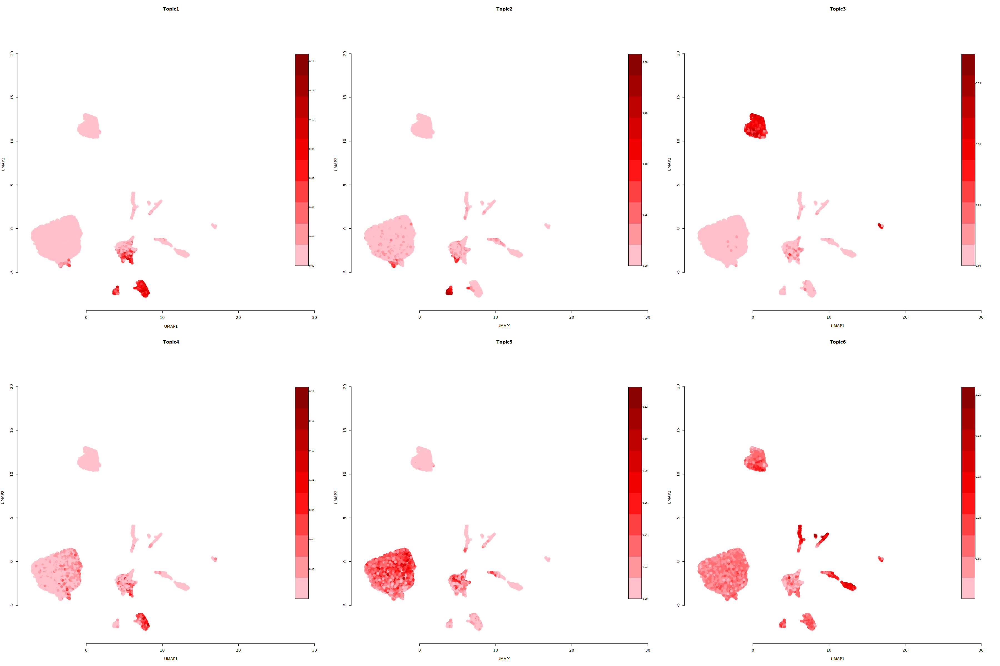

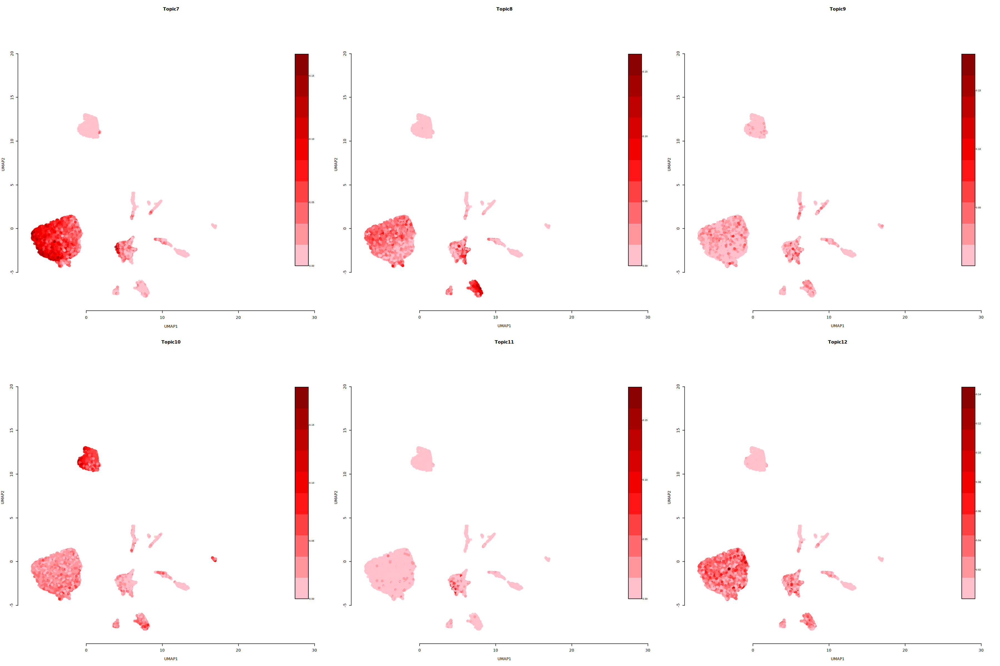

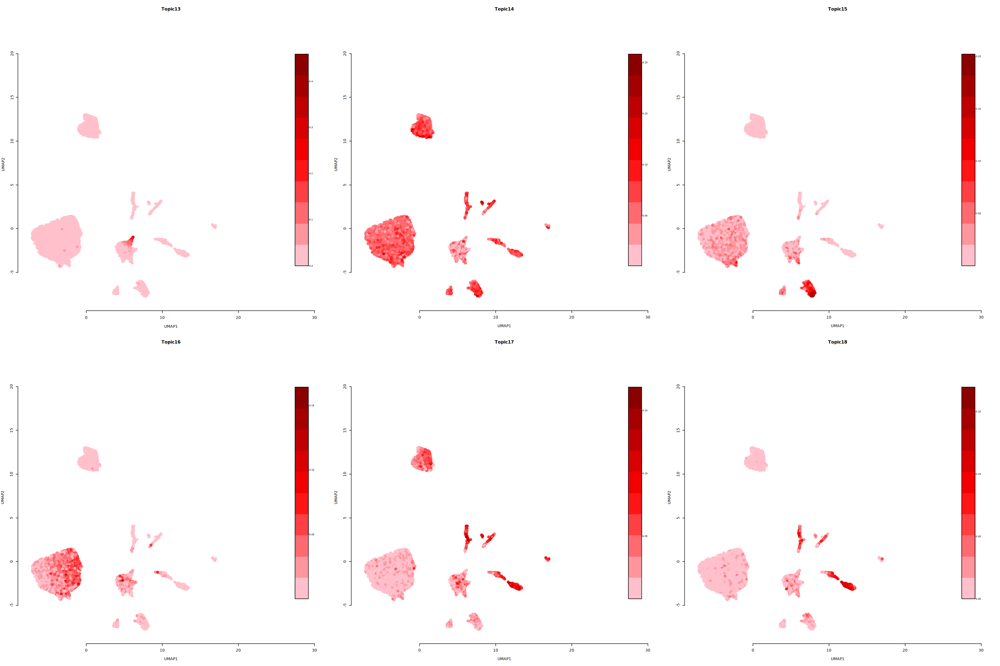

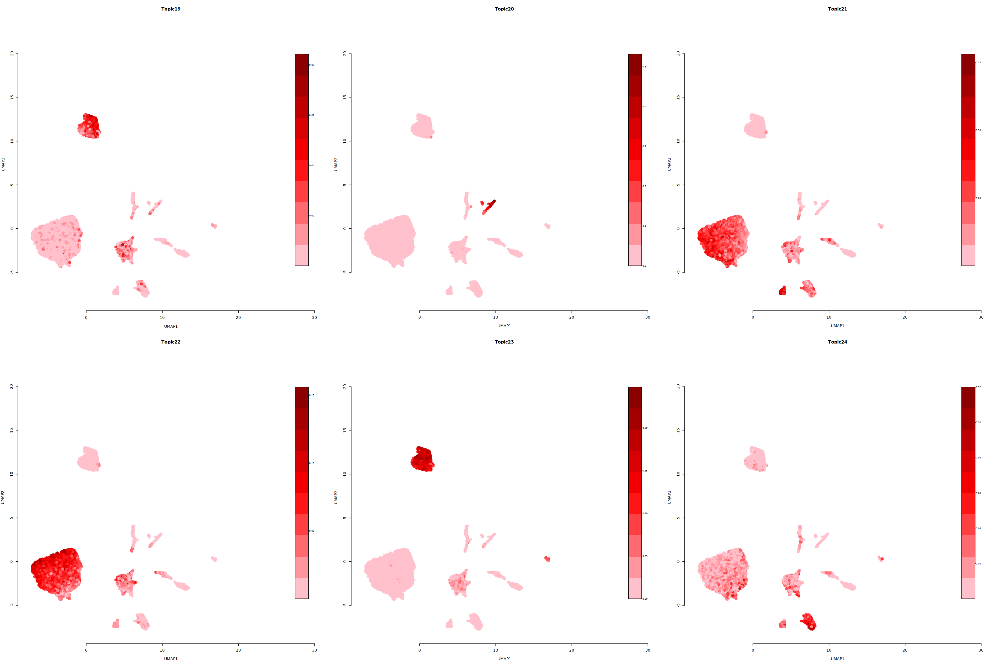

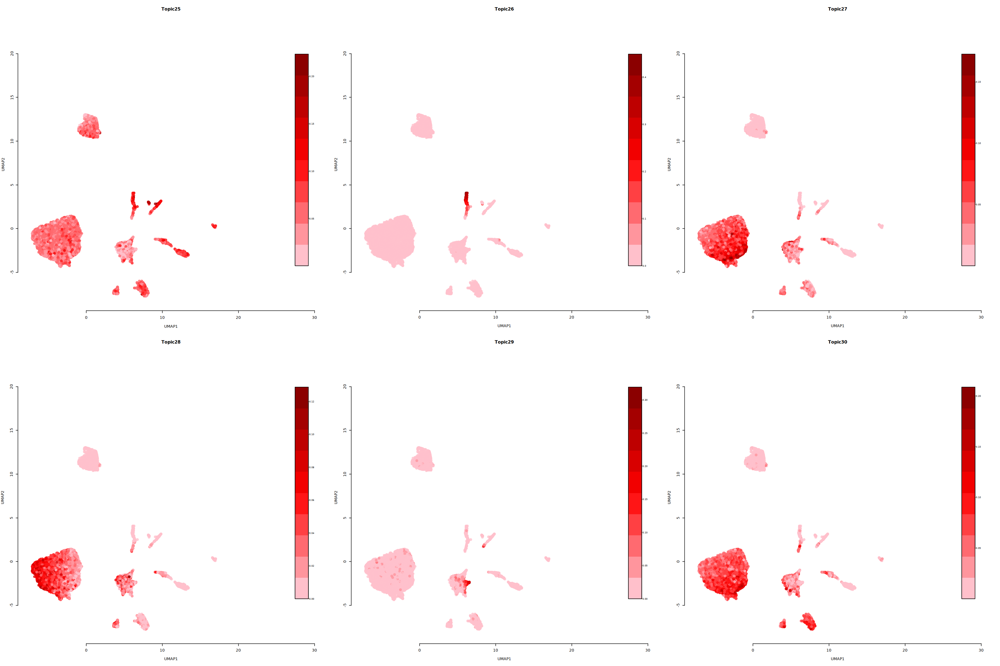

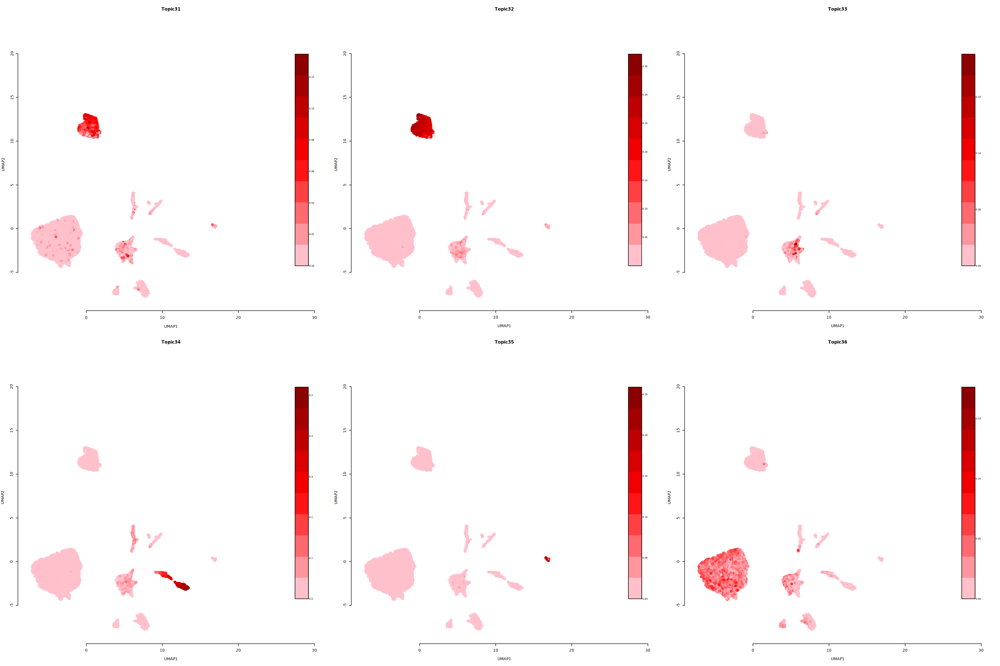

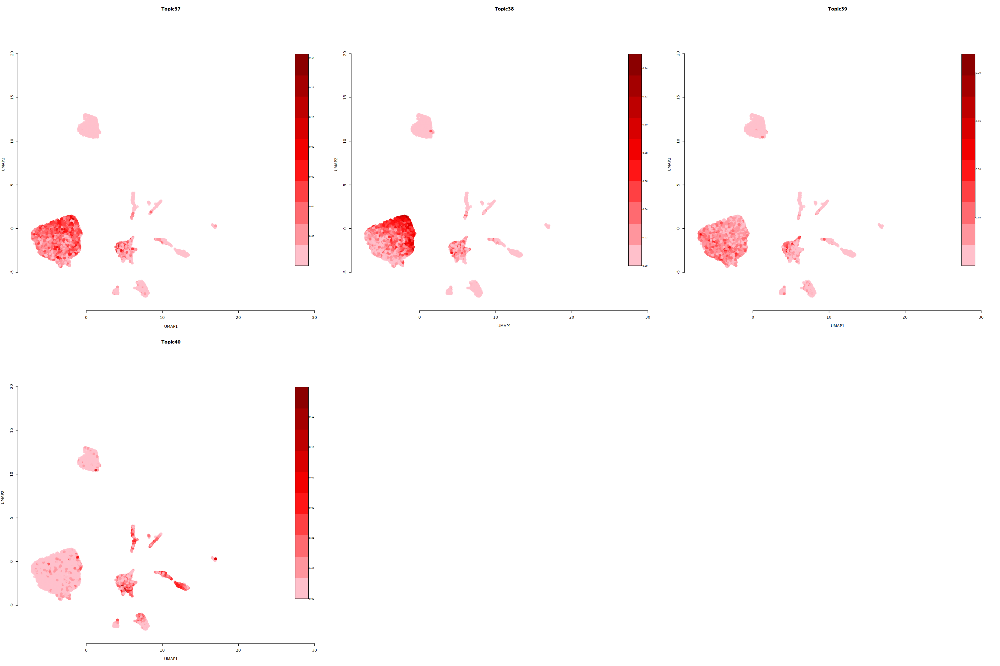

In [28]:
options(repr.plot.width = 30, repr.plot.height = 20)
par(mfrow=c(2,3))

plotFeatures(cisTopicObject,
             method='Umap',
             target='cell', 
             topic_contr='Probability', 
             colorBy=NULL, 
             cex.legend = 0.7,
             cex.dot = 1.5,
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

In [98]:
ProjectDir <- '/lustre1/project/stg_00041/SanKit/SKT005/'
FIG_Dir <- paste0(ProjectDir, "Figures_2022/")

pdf(file = paste0(FIG_Dir,'CisTopic-UMAP-Topics.pdf'),  
    width = 10, # The width of the plot in inches
    height = 10 # The height of the plot in inches
  # units = "cm",
   # res = 300) 
)

par(mfrow=c(3,3))
plotFeatures(cisTopicObject,
             method='Umap',
             target='cell', 
             topic_contr='Probability', 
             colorBy=NULL, 
             cex.legend = 0.7,
             cex.dot = .30,
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

dev.off()

png 
  2

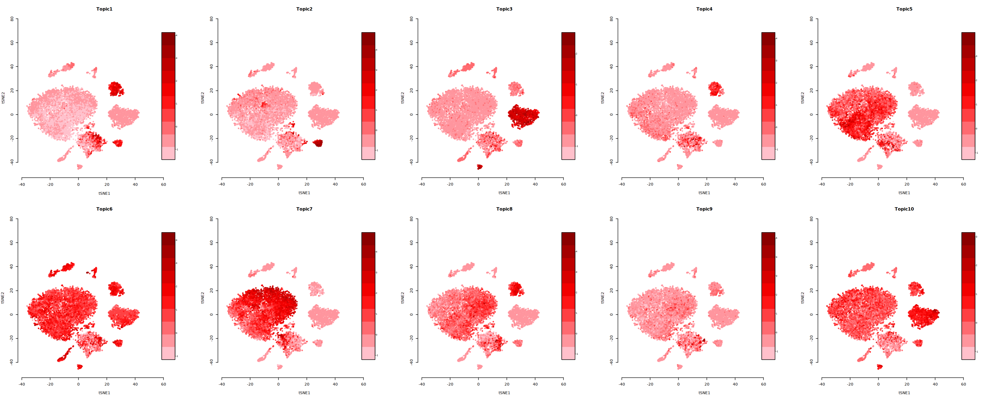

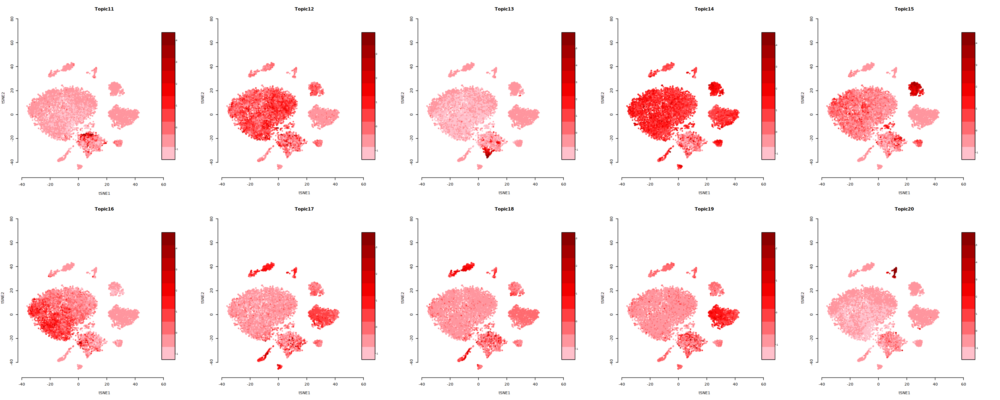

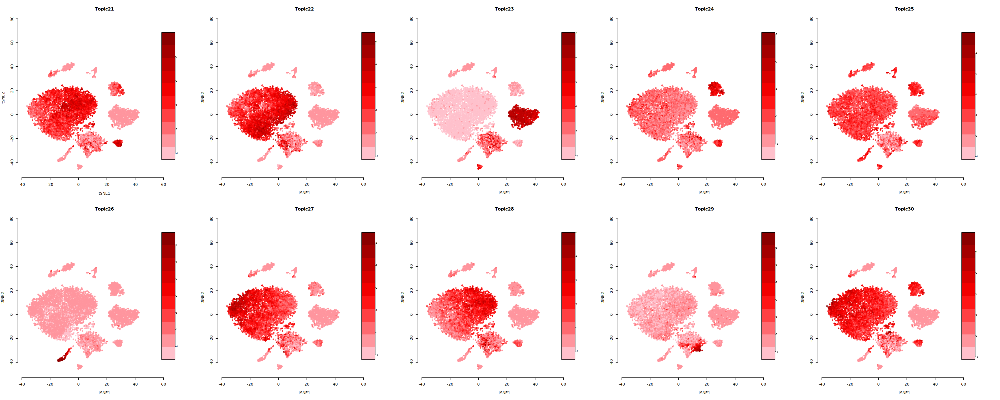

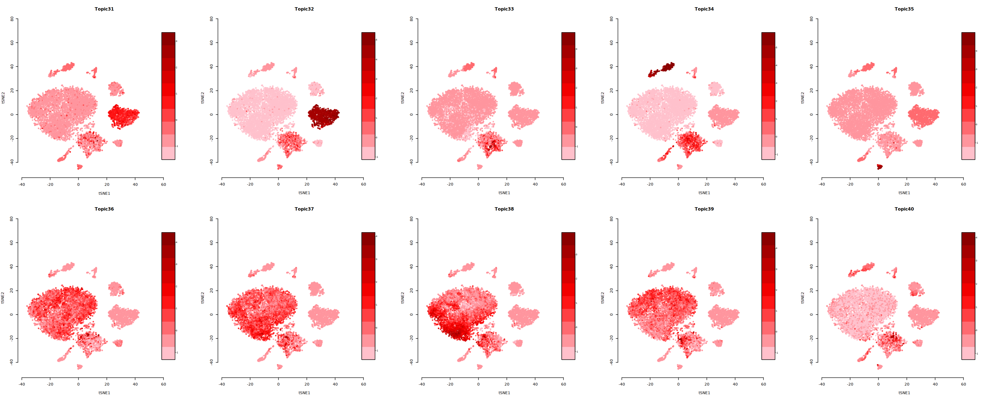

In [255]:
fig(30,12)
par(mfrow=c(2,5))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell', 
             topic_contr='Z-score', 
             colorBy=NULL, 
             cex.legend = 0.8,
            cex.dot = .75,
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

In [213]:
ProjectDir <- '/lustre1/project/stg_00041/SanKit/SKT005/'
FIG_Dir <- paste0(ProjectDir, "Figures_2022/")

pdf(file = paste0(FIG_Dir,'CisTopic-CombinedPancreas-tSNE-Topics.pdf'),  
    width = 10, # The width of the plot in inches
    height = 10 # The height of the plot in inches
  # units = "cm",
   # res = 300) 
)

par(mfrow=c(3,3))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell', 
             topic_contr='Probability', 
             colorBy=NULL, 
             cex.legend = 0.7,
             cex.dot = .50,
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

dev.off()

png 
  2

In [ ]:
par(mfrow=c(2,5))
plotFeatures(cisTopicObject,
             method='Umap',
             target='cell', 
             topic_contr='Probability',
             topics=c('Topic1',
                      'Topic4',
                      'Topic6',
                      'Topic7',
                      'Topic9',
                      'Topic11',
                      'Topic13',
                      'Topic15'),
             colorBy=NULL, 
             cex.legend = 0.8, 
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

options(repr.plot.width = 20, repr.plot.height = 20)

## Save RDS

In [ ]:
setwd(RDS_Dir)
saveRDS(cisTopicObject, file='SKT012.01.03_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

getwd()
list.files()

## Load RDS (no idea what this section is about again)

In [8]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS/')
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS"

[1] "CisTopic_MetaData.csv"                                   
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"           
 [3] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"     
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"
 [5] "CisTopicObject_2.1_Mm10-Pancreas-CA_Object.rds"          
 [6] "SeuratObject_1_Mm10-Pancreas-CA_QC_Normalization_LDR.rds"
 [7] "SeuratObject_2_Mm10-Pancreas-CA_UMAP-Clustering.rds"     
 [8] "SeuratObject_3_Mm10-Pancreas-CA_Cell-Type-ID.rds"        
 [9] "SeuratObject_4_Mm10-Pancreas-CA_Cell-Type-AlphaCells.rds"
[10] "SeuratObject_5_Mm10-Pancreas-CA_JASPAR2020Motifs.rds"

In [22]:
#cells <- 'Your vector with cells'
#subset_counts <- cisTopicObject@count.matrix[,cells]
#subset_metadata <- cisTopicObject@cell.data[cells,]
#subset_cisTopicObject <- createcisTopicObject(subset_counts)
#subset_cisTopicObject <- AddCellMetadata(subset_cisTopicObject, subset_metadata)

In [8]:
cisTopicObject

An object of class cisTopic in project MmPancreasCA 
 149953 regions across 1486 samples.

In [5]:
head(cisTopicObject@count.matrix)
head(cisTopicObject@dr$cell$tSNE)
head(cisTopicObject@dr$cell$Umap)
head(cisTopicObject@cell.data$densityClust)
#head(cisTopicObject@cell.data$)

   [[ suppressing 1486 column names 'AAACGAAAGCTATCCA-1', 'AAACGAAAGGCCTCTG-1', 'AAACGAAAGTGTCCCG-1' ... ]]



6 x 1486 sparse Matrix of class "dgCMatrix"
                                                                              
chr1:3119728-3120367 . . . . . . . . . . . . . . . 1 . . . . . . . . . . . . .
chr1:3121419-3121624 . . . . . . . . . . . . . . . . . . . . . . . 1 . . . . .
chr1:3126148-3126360 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:3360948-3361206 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:3416134-3416560 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:3514859-3515136 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                                                              
chr1:3119728-3120367 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:3121419-3121624 . . . . . . . . . . . . . 1 . . . . . . . . . . . . . . .
chr1:3126148-3126360 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:3360948-3361206 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1:341

,tSNE1,tSNE2
AAACGAAAGCTATCCA-1,12.753697,-5.07356644
AAACGAAAGGCCTCTG-1,2.004406,18.76631867
AAACGAAAGTGTCCCG-1,-2.220770,-5.21651322
AAACGAACATCCGTAA-1,-18.581603,0.01359788
AAACGAAGTACGTAGG-1,-5.517503,-4.24769834
AAACGAAGTGATAGAT-1,4.780290,4.26823966


,UMAP1,UMAP2
AAACGAAAGCTATCCA-1,-2.8294873,2.6055768
AAACGAAAGGCCTCTG-1,-2.5405586,-0.8526702
AAACGAAAGTGTCCCG-1,0.3804863,1.2018469
AAACGAACATCCGTAA-1,2.8717322,1.0398410
AAACGAAGTACGTAGG-1,0.5705356,0.8477676
AAACGAAGTGATAGAT-1,-1.1899046,2.3709723


[1] 13 8  7  4  12 13
Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14

In [84]:
head(cisTopicObject@cell.data)

,nCounts,nAcc,10X_total,10X_duplicate,10X_chimeric,10X_unmapped,10X_lowmapq,10X_mitochondrial,10X_passed_filters,10X_cell_id,...,10X_TSS_fragments,10X_DNase_sensitive_region_fragments,10X_enhancer_region_fragments,10X_promoter_region_fragments,10X_on_target_fragments,10X_blacklist_region_fragments,10X_peak_region_fragments,10X_peak_region_cutsites,graphBasedClusters_CRA,densityClust
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<fct>,<fct>
AAACGAAAGCTATCCA-1,358,293,1858,211,67,136,321,3,1120,_cell_0,...,254,327,277,143,529,62,358,700,4,13
AAACGAAAGGCCTCTG-1,7508,6218,25859,2906,214,313,2032,46,20348,_cell_1,...,4413,6491,4745,2818,10511,10,7505,14240,1,8
AAACGAAAGTGTCCCG-1,10622,8337,20035,3652,197,374,1366,22,14424,_cell_2,...,5652,8199,4228,5047,10743,65,10622,20843,2,7
AAACGAACATCCGTAA-1,6002,5136,10892,1614,122,174,762,43,8177,_cell_3,...,3100,4583,2390,2732,6027,41,6002,11803,2,4
AAACGAAGTACGTAGG-1,8435,7045,14934,2205,154,282,955,30,11308,_cell_4,...,4385,6489,3379,3886,8505,54,8435,16523,2,12
AAACGAAGTGATAGAT-1,12286,9853,21611,2461,265,330,1584,21,16950,_cell_5,...,6142,9430,5195,5319,12469,50,12286,23944,2,13


In [85]:
CistTopic_CountMatrix <- cisTopicObject@count.matrix
CisTopic_tSNE <- cisTopicObject@dr$cell$tSNE
CisTopic_Umap <- cisTopicObject@dr$cell$Umap
CisTopic_Metadata <- cisTopicObject@cell.data

In [88]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/Data/')
list.files()


[1] "CisTopic_ClusterData.csv"                                              
 [2] "CisTopic_CountMatrix.csv"                                              
 [3] "CisTopic_MetaData.csv"                                                 
 [4] "CisTopic_Umap.csv"                                                     
 [5] "CisTopic_tSNE.csv"                                                     
 [6] "Cluster4-DA-PosLog2FC.txt"                                             
 [7] "Cluster5-DA-PosLog2FC.txt"                                             
 [8] "Cluster6-DA-PosLog2FC.txt"                                             
 [9] "Cluster7-DA-PosLog2FC.txt"                                             
[10] "Mm10-Pancreas-scATACseq-Acinar Cells.xlsx"                             
[11] "Mm10-Pancreas-scATACseq-Alpha Cells.xlsx"                              
[12] "Mm10-Pancreas-scATACseq-Beta Cells.xlsx"                               
[13] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaks.xlsx"              
[14] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksAcinar Cells.xlsx"  
[15] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksAlpha Cells.xlsx"   
[16] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksBeta Cells.xlsx"    
[17] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksDuctal Cells.xlsx"  
[18] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksImmune Cells.xlsx"  
[19] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaksStellate Cells.xlsx"
[20] "Mm10-Pancreas-scATACseq-DifferentialAccessiblePeaks_Backup.xlsx"       
[21] "Mm10-Pancreas-scATACseq-Ductal Cells.xlsx"                             
[22] "Mm10-Pancreas-scATACseq-Immune Cells.xlsx"                             
[23] "Mm10-Pancreas-scATACseq-MotifAnalysis.xlsx"                            
[24] "Mm10-Pancreas-scATACseq-MotifAnalysisJASPAR2020.txt"                   
[25] "Mm10-Pancreas-scATACseq-MotifAnalysisJASPAR2020.xlsx"                  
[26] "Mm10-Pancreas-scATACseq-Stellate Cells.xlsx"                           
[27] "MotifEnrichmentList.txt"

In [27]:
class(CisTopic_tSNE)

[1] "matrix" "array"

In [24]:
write.csv(as.matrix(CistTopic_CountMatrix), 'CisTopic_CountMatrix.csv')

In [28]:
write.csv(CisTopic_tSNE, 'CisTopic_tSNE.csv')

In [30]:
write.csv(CisTopic_Umap, 'CisTopic_Umap.csv')

In [89]:
write.csv(CisTopic_Metadata, 'CisTopic_MetaData.csv')

# Analysis of the regulatory topics
## Defining topics
To analyze the regions included in the cisTopics, the first step is always to derive a score that evaluates how likely is for a region to belong to a topic.<br/>
getRegionsScores() calculates these scores based on the proportion of region specific assignments to a topic.<br/>
These scores can be rescaled into the range [0,1], which will be useful for the binarization step (as it will force data to follow a gamma distribution shape).<br/>
This information is stored in the region.data slot.

In [ ]:
setwd(RDS_Dir)
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('SKT012.01.03_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

In [8]:
cisTopicObject <- getRegionsScores(cisTopicObject, method='NormTop', scale=TRUE)


BigWig files for observing the scored regions in the genome can be generated. Note that information on the length of the chromosomes has to be provided. These files can be uploaded in IGV or UCSC for visualisation. This information can be easily found in the TxDb objects of the corresponding genomes, for example.

In [9]:
library(AnnotationDbi)
library(Biobase)
library(GenomicFeatures)

Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.



Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select


Loading required package: GenomicRanges



In [ ]:
BiocManager::install("TxDb.Hsapiens.UCSC.hg38.knownGene")


In [10]:
library(TxDb.Hsapiens.UCSC.hg38.knownGene)

In [12]:
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene
pathToBigWig <- '/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/'
BigWig_folder <- paste0(pathToBigWig, 'Hg38Pancreas97Topics')


getBigwigFiles(cisTopicObject, path=BigWig_folder, seqlengths=seqlengths(txdb))

[[1]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_1.bw 

[[2]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_2.bw 

[[3]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_3.bw 

[[4]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_4.bw 

[[5]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_5.bw 

[[6]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_6.bw 

[[7]]
BigWigFile object
resource: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BigWig/Hg38Pancreas97Topics/Topic_7.bw 


However, many tools are limited to work with sets of regions rather than rankings of regions. <br/>
Keywords, or the most contributing regions in a topic, can be used as a representative set of regions of the topic.<br/>
binarizecisTopics() allows to select the top regions based on two methods:

* method = "Predefined": to select a predefined number of regions (determined by the cutoffs argument)

* method = "GammaFit" (default): to automatically select a threshold based on a fit of the scores to a gamma distribution. <br/> This is recommended when using method="NormTop" and scale=TRUE in getRegionScores(). <br/>Note that the probability threshold must be provided by the user and it must be taken after the density (based on the fitted gamma distribution) is stabilised (i.e. in the tail of the distribution).

In [13]:
library(MASS)
library(survival)
library(fitdistrplus)


Attaching package: ‘MASS’


The following object is masked from ‘package:AnnotationDbi’:

    select


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select




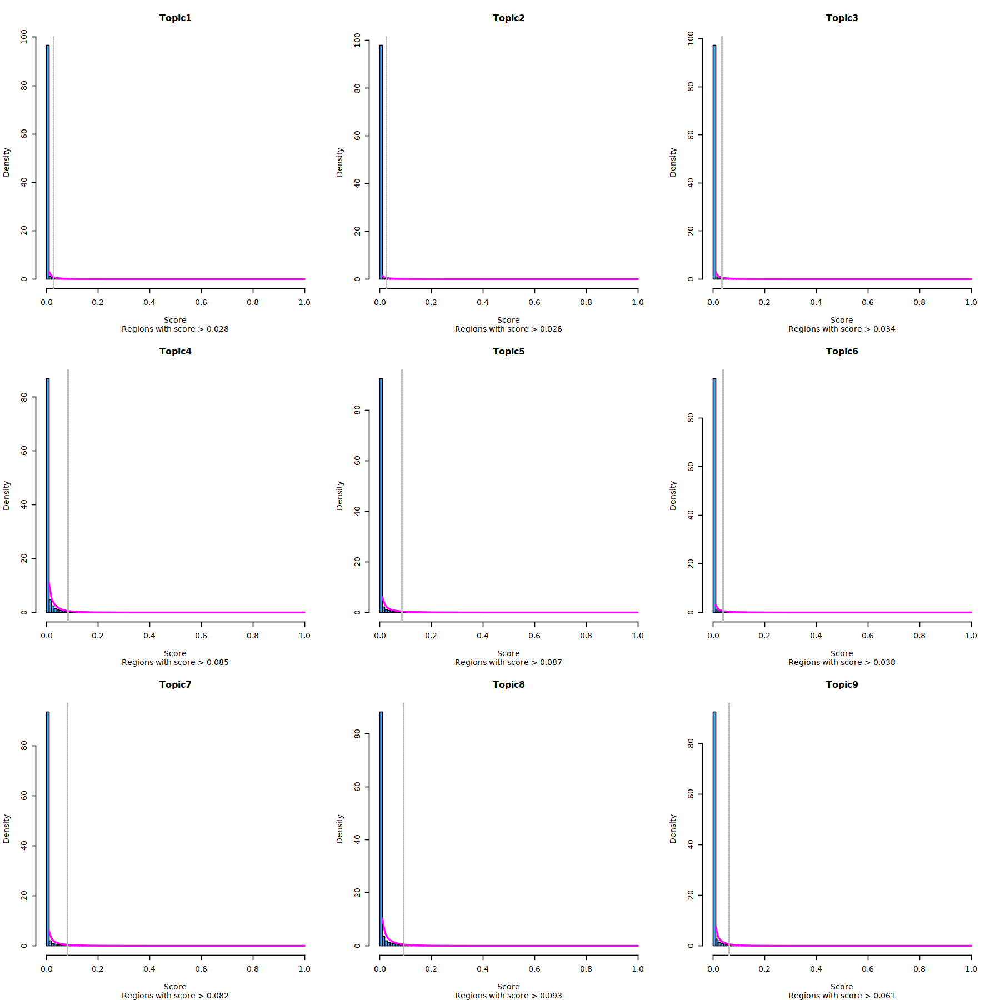

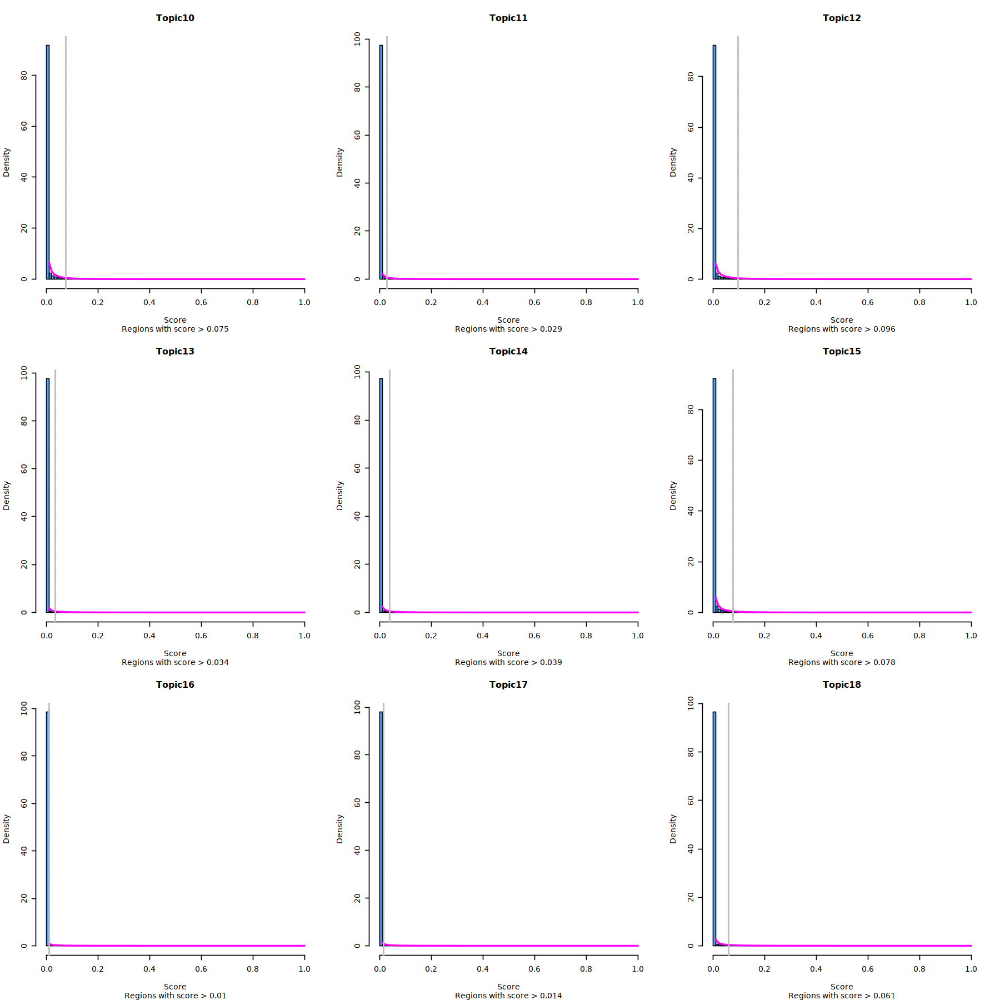

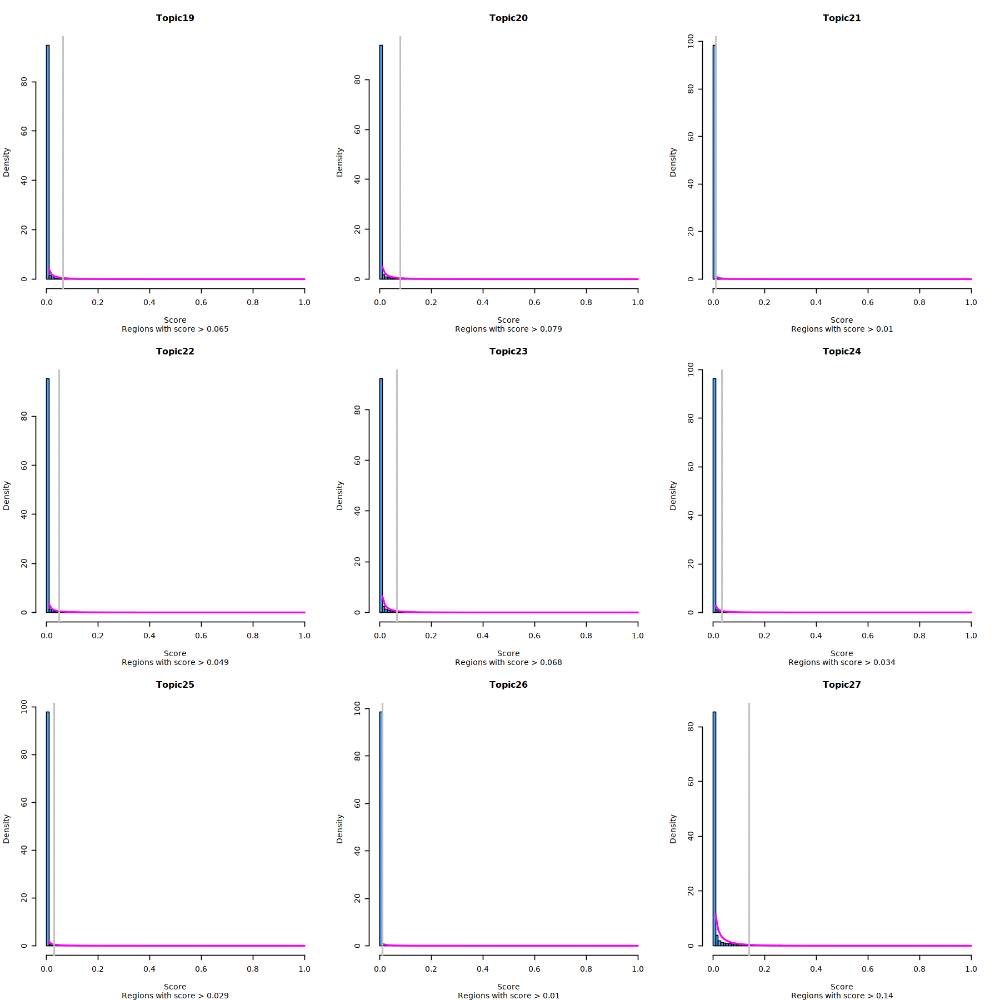

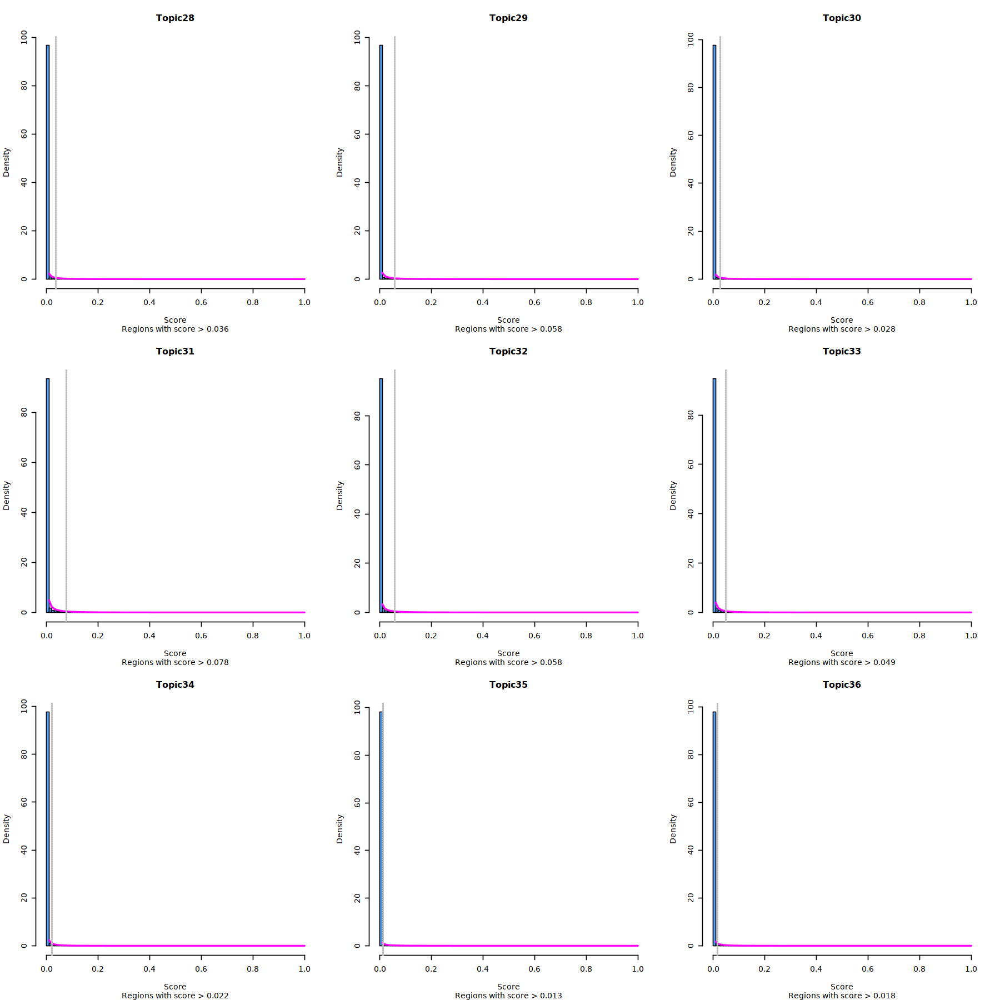

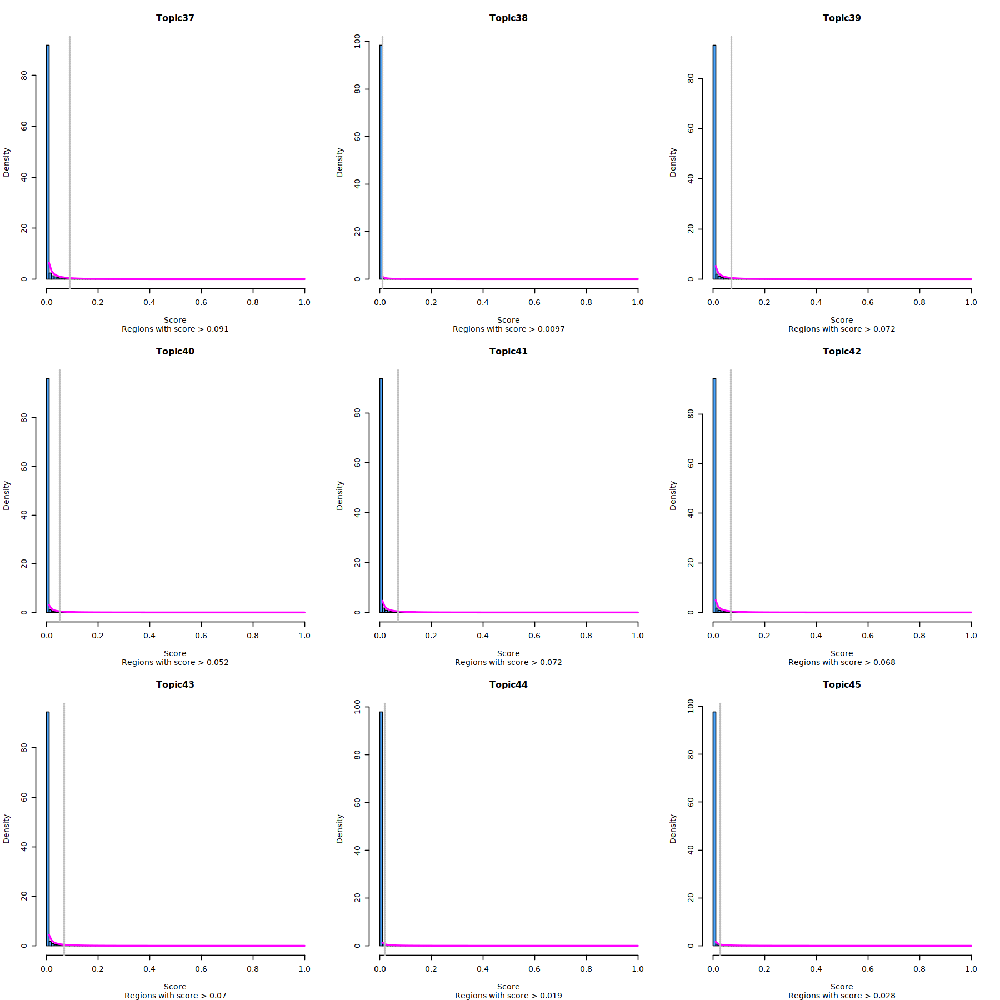

...

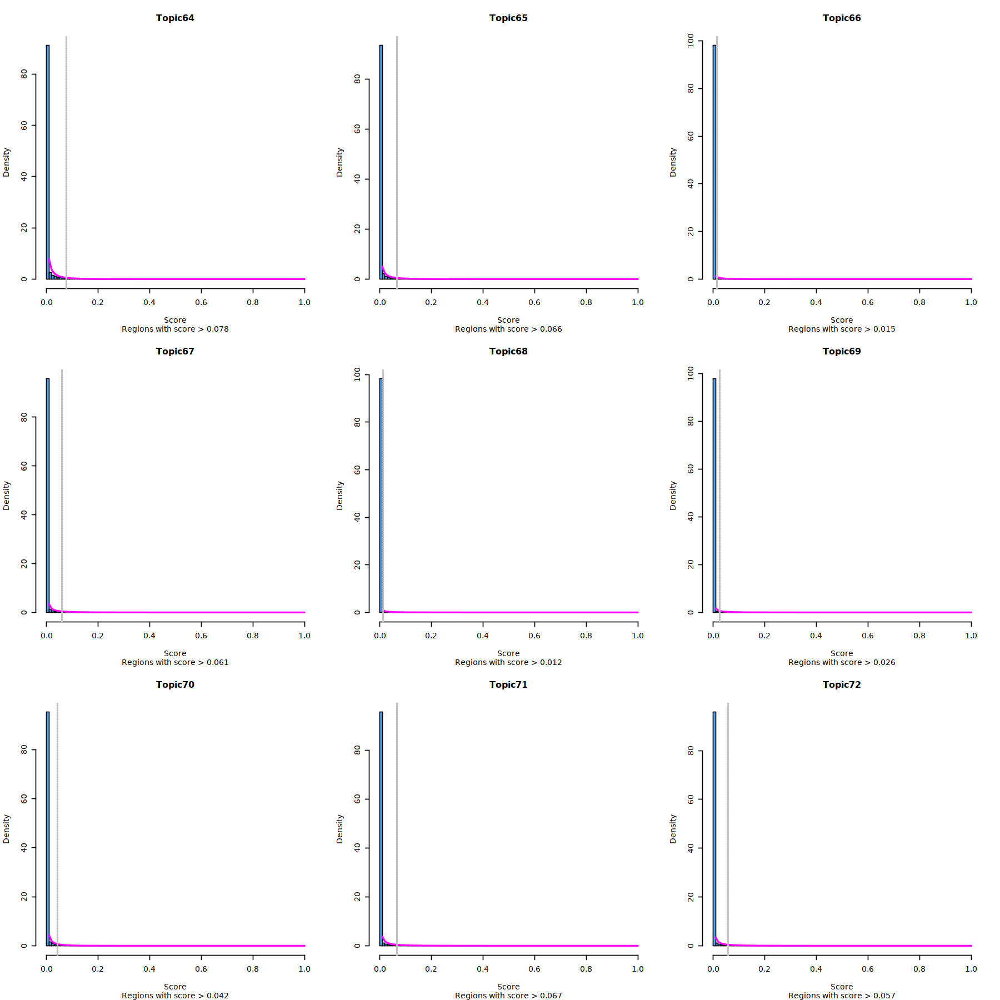

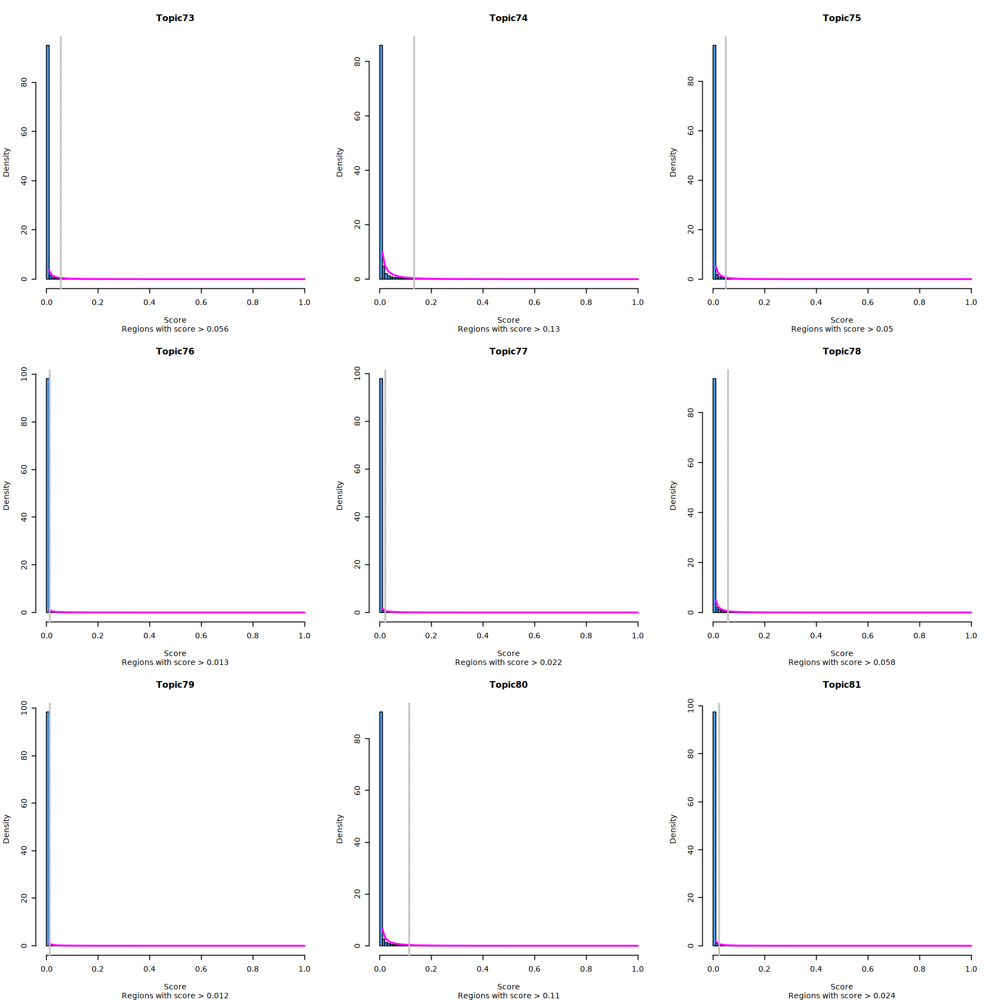

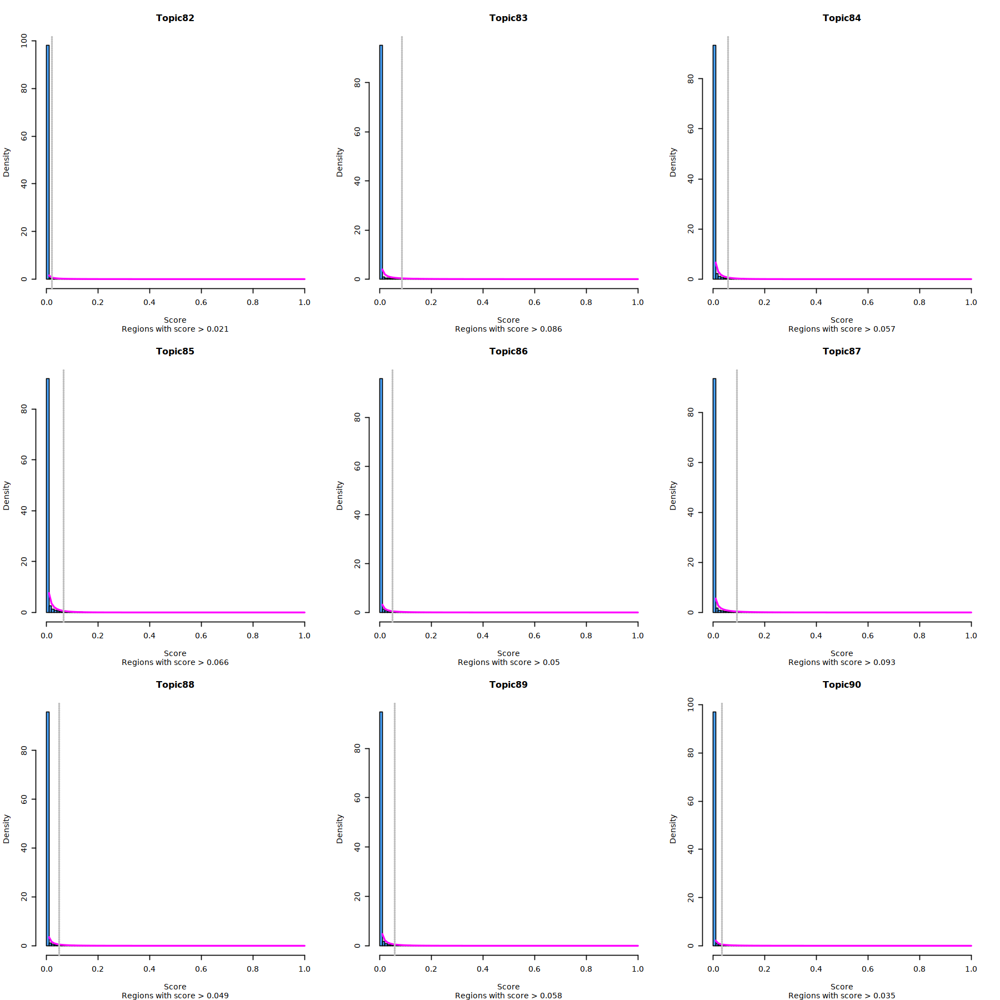

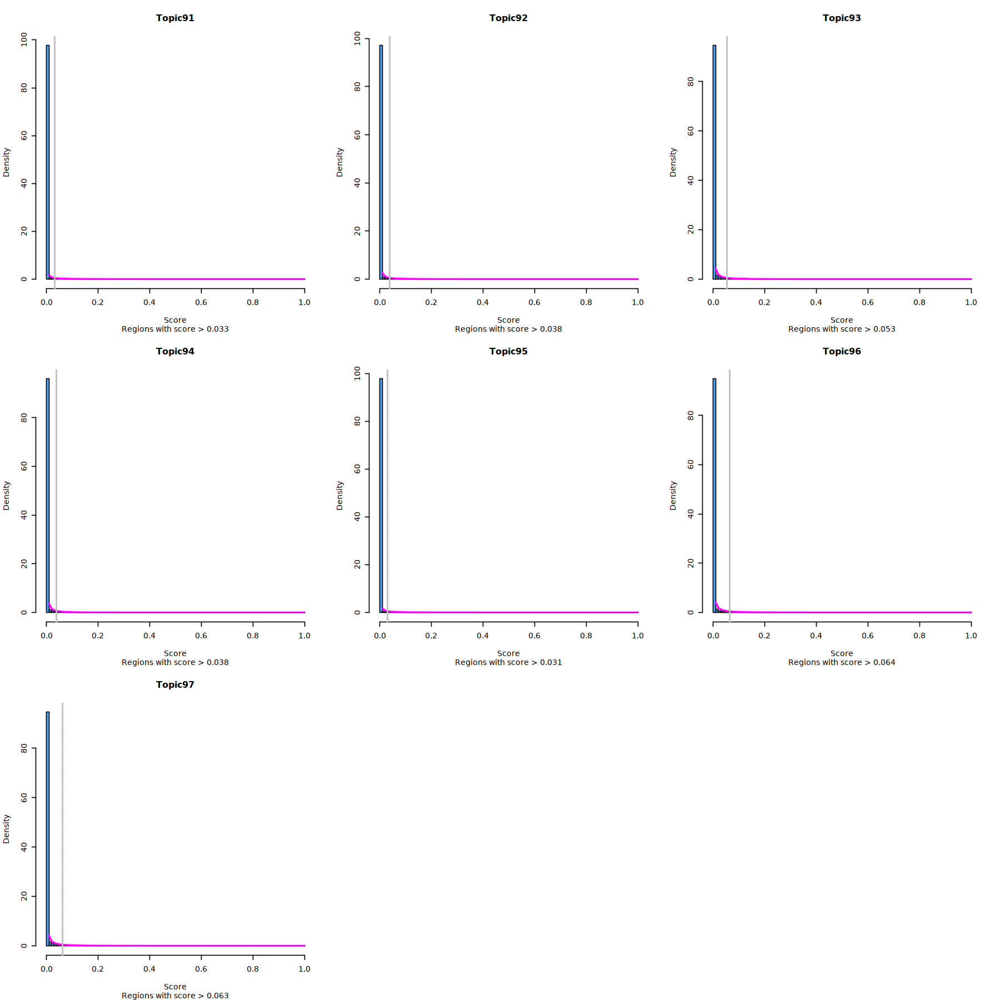

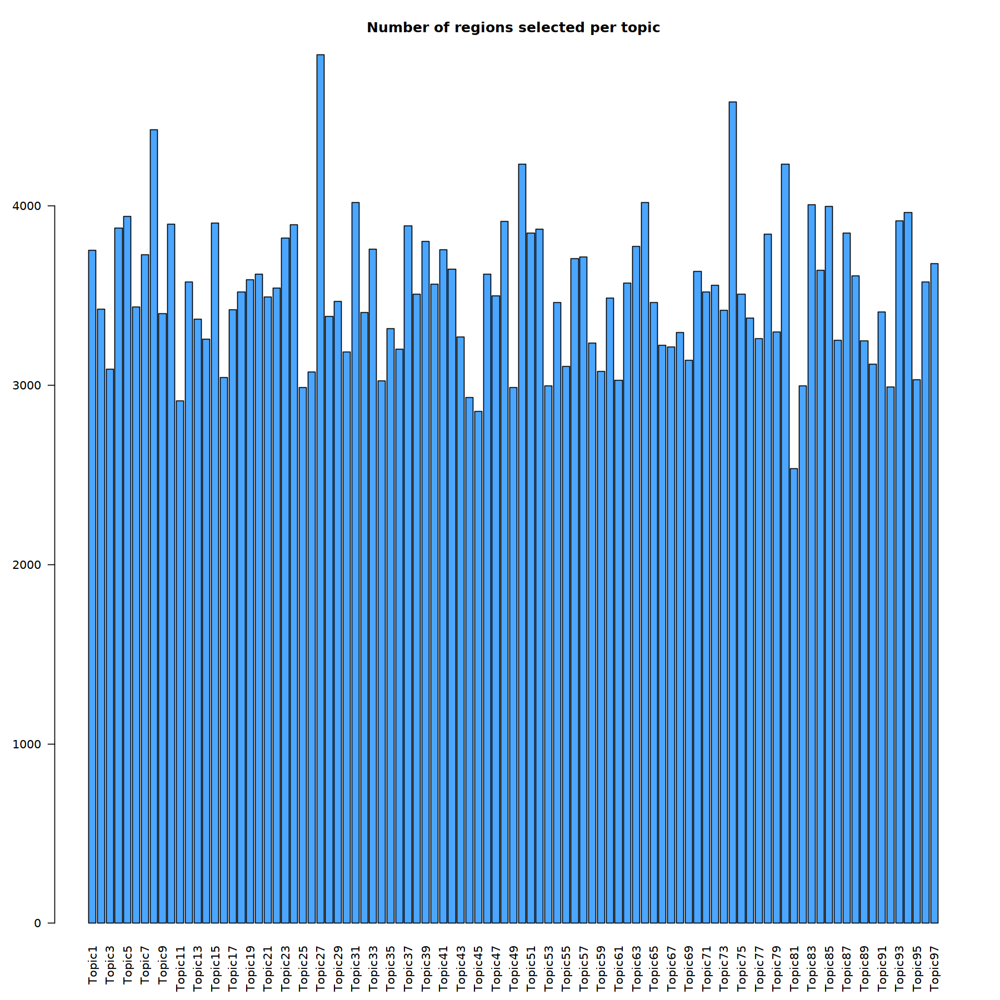

In [16]:
fig(15,15)
par(mfrow=c(3,3))
cisTopicObject <- binarizecisTopics(cisTopicObject, thrP=0.975, plot=TRUE)

The regions sets selected and distributions for each cisTopic can then be analized in different ways (examples in next sections). They can also be exported to bed files to analyze with external tools:

In [17]:
getBedFiles(cisTopicObject, path='/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/BedFiles/Hg38Pancreas97Topics/')

## Topic visualization
Based on the topic scores for each region, different methods can be used for clustering and/or visualization (as shown for cells). cisTopic includes wrapper functions to easily run Umap, tSNE, diffussion maps and PCA (the results are saved in the slot @dr$region). In the case of regions, only high confidence regions (i.e. that pass the binarization threshold at least in 1 topic) are used:

In [ ]:
cisTopicObject <- runtSNE(cisTopicObject, target='region', perplexity=200, check_duplicates=FALSE)

The function plotFeatures can also be used to visualize region-based tSNEs, diffussion maps, principal components and biplots (in 2/3D), colored by metadata and/or topic enrichment.

In [ ]:
plotFeatures(cisTopicObject,
             method='tSNE',
             target='region',
             topic_contr=NULL,
             colorBy=c('nCells'),
             cex.legend = 0.8,
             factor.max=.75,
             dim=2,
             legend=TRUE,
             col.low='darkgreen', col.mid='yellow', col.high='brown1',
             intervals=10)

par(mfrow=c(2,5))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='region',
             topic_contr='Z-score',
             colorBy=NULL,
             cex.legend = 0.8,
             factor.max=.75,
             dim=2, legend=TRUE, col.low='darkgreen', col.mid='yellow', col.high='brown1')

# Annotation to GO terms
Another way of gaining insight on the topics is to link the regions to genes, and to determine GO terms (or pathways or any other type of gene-set) that are enriched within them. cisTopic provides the function annotateRegions() to annotate regions to GO terms using the “TxDb” Bioconductor packages (replace ‘TxDb.Hsapiens.UCSC.hg19.knownGene’ by the appropiate organism package), and annotation databases (“OrgDb” packages).

In [31]:
library(org.Mm.eg.db)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
cisTopicObject <- annotateRegions(cisTopicObject,
                                  txdb=TxDb.Mmusculus.UCSC.mm10.knownGene,
                                  annoDb='org.Mm.eg.db')

Loading required package: AnnotationDbi

Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.



Attaching package: 'AnnotationDbi'


The following object is masked from 'package:plotly':

    select


The following object is masked from 'package:dplyr':

    select




Loading required package: GenomicFeatures

Loading required package: GenomicRanges

Loading required package: ChIPseeker



ChIPseeker v1.26.2  For help: https://guangchuangyu.github.io/software/ChIPseeker

If you use ChIPseeker in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Qing-Yu He. ChIPseeker: an R/Bioconductor package for ChIP peak annotation, comparison and visualization. Bioinformatics 2015, 31(14):2382-2383



>> preparing features information...		 2022-02-09 13:33:01 
>> identifying nearest features...		 2022-02-09 13:33:02 
>> calculating distance from peak to TSS...	 2022-02-09 13:33:05 
>> assigning genomic annotation...		 2022-02-09 13:33:05 
>> adding gene annotation...			 2022-02-09 13:33:20 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2022-02-09 13:33:20 
>> done...					 2022-02-09 13:33:20 


As we saw before, we can use the region type annotations as region sets/signatures to check whether a topic is more enriched in a certain type of region. <br/>
We see that regions that belong to topics that are not enriched for any of the cell type specific signatures are promoter topics. <br/>
Additionally, the set of regions that are accessible in a higher number of cells are also promoters.

In [99]:
str(cisTopicObject)

Formal class 'cisTopic' [package "cisTopic"] with 24 slots
  ..@ count.matrix            :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:64429279] 47 49 65 71 72 82 85 90 98 119 ...
  .. .. ..@ p       : int [1:9694] 0 28868 54382 77614 102808 125437 148743 171966 194560 217228 ...
  .. .. ..@ Dim     : int [1:2] 176188 9693
  .. .. ..@ Dimnames:List of 2
  .. .. .. ..$ : chr [1:176188] "chr1:3119737-3120237" "chr1:3121251-3121751" "chr1:3203899-3204399" "chr1:3205083-3205583" ...
  .. .. .. ..$ : chr [1:9693] "AGGCGAACAACTCGTA.1_CA" "AACAAAGGTTTCTTAC.1_CA" "CCCTCTCGTATCCTTT.1_CA" "ATGGATCGTAACCGAG.1_CA" ...
  .. .. ..@ x       : num [1:64429279] 4 1 1 2 2 1 1 3 1 1 ...
  .. .. ..@ factors : list()
  ..@ binary.count.matrix     :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:64429279] 47 49 65 71 72 82 85 90 98 119 ...
  .. .. ..@ p       : int [1:9694] 0 28868 54382 77614 102808 125437 148743 171966 194560 2

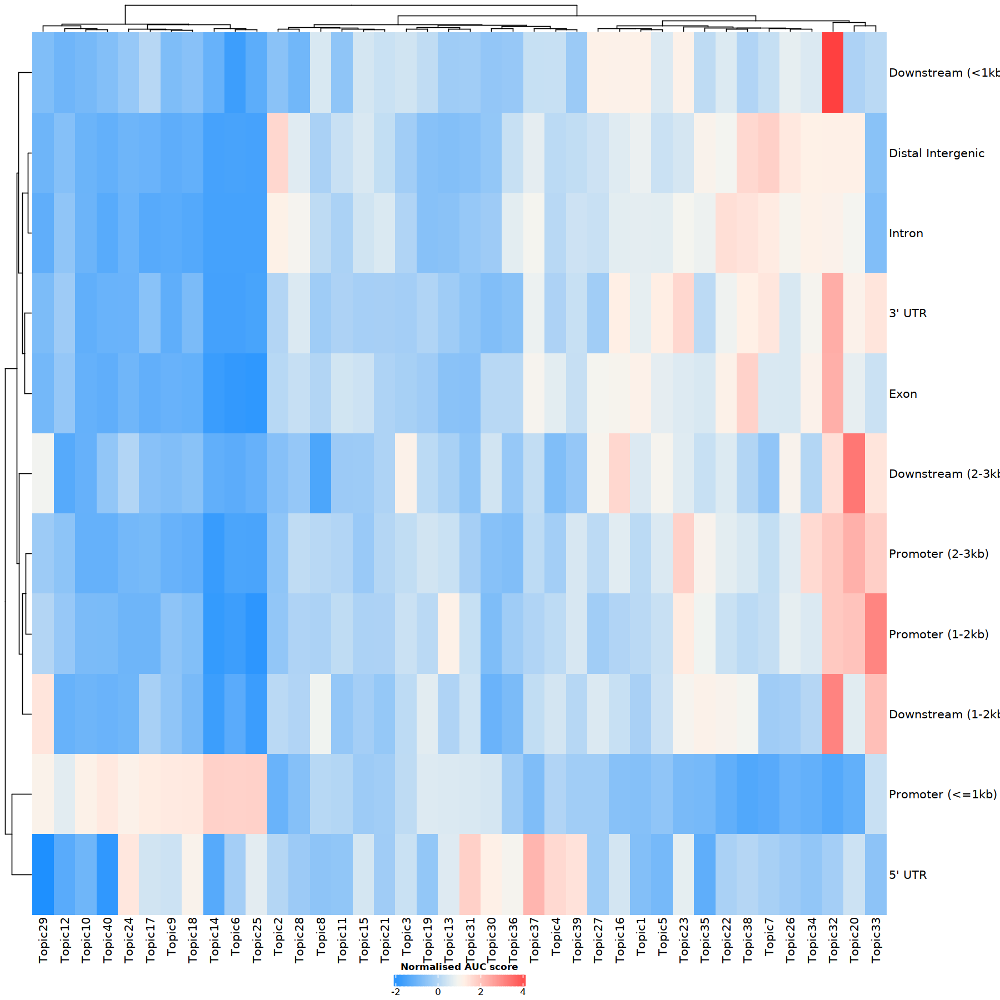

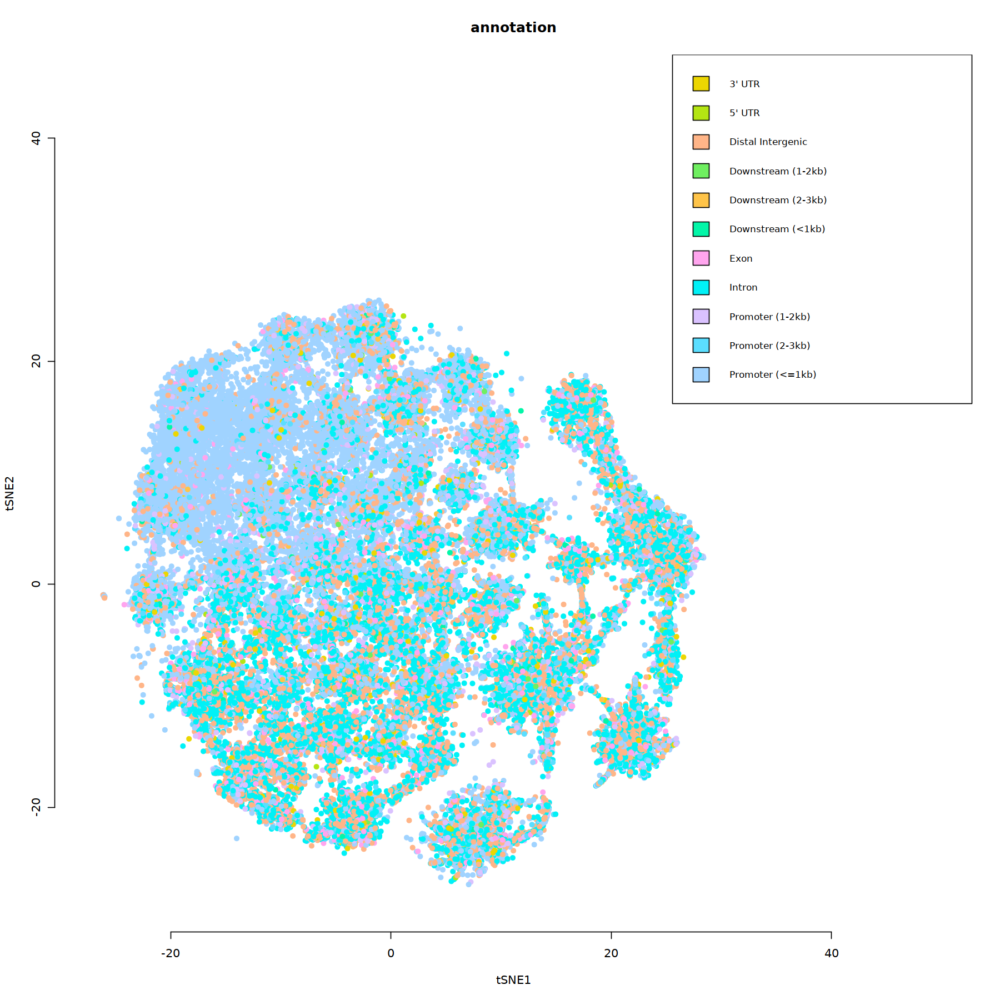

In [59]:
fig(15,15)

par(mfrow=c(1,1))
signaturesHeatmap(cisTopicObject, selected.signatures = 'annotation')
plotFeatures(cisTopicObject,
             method='tSNE',
             target='region',
             topic_contr=NULL,
             colorBy=c('annotation'),
             cex.legend = 0.8,
             factor.max=.75,
             dim=2,
             legend=TRUE,
             intervals=20)

For identifying enriched GO terms per topic, cisTopic provides a wrapper over rGREAT (Gu Z, 2017) [Reference running time: 20 minutes]. The binarised topics (i.e. sets of top regions per topic) are used in this step. Results are stored in object@binarized.rGREAT.

In [ ]:
date()
cisTopicObject <- GREAT(cisTopicObject, genome='mm10', fold_enrichment=2, geneHits=1, sign=0.05, request_interval=10)
date()

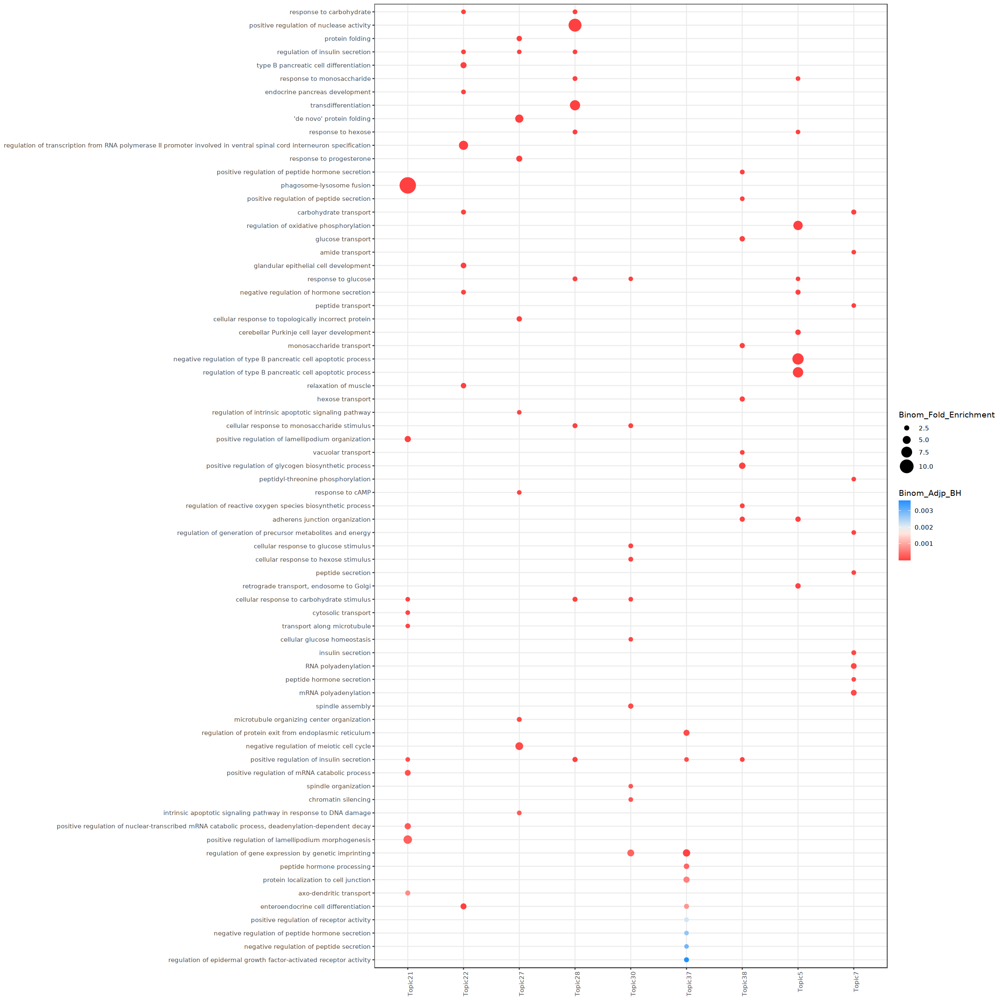

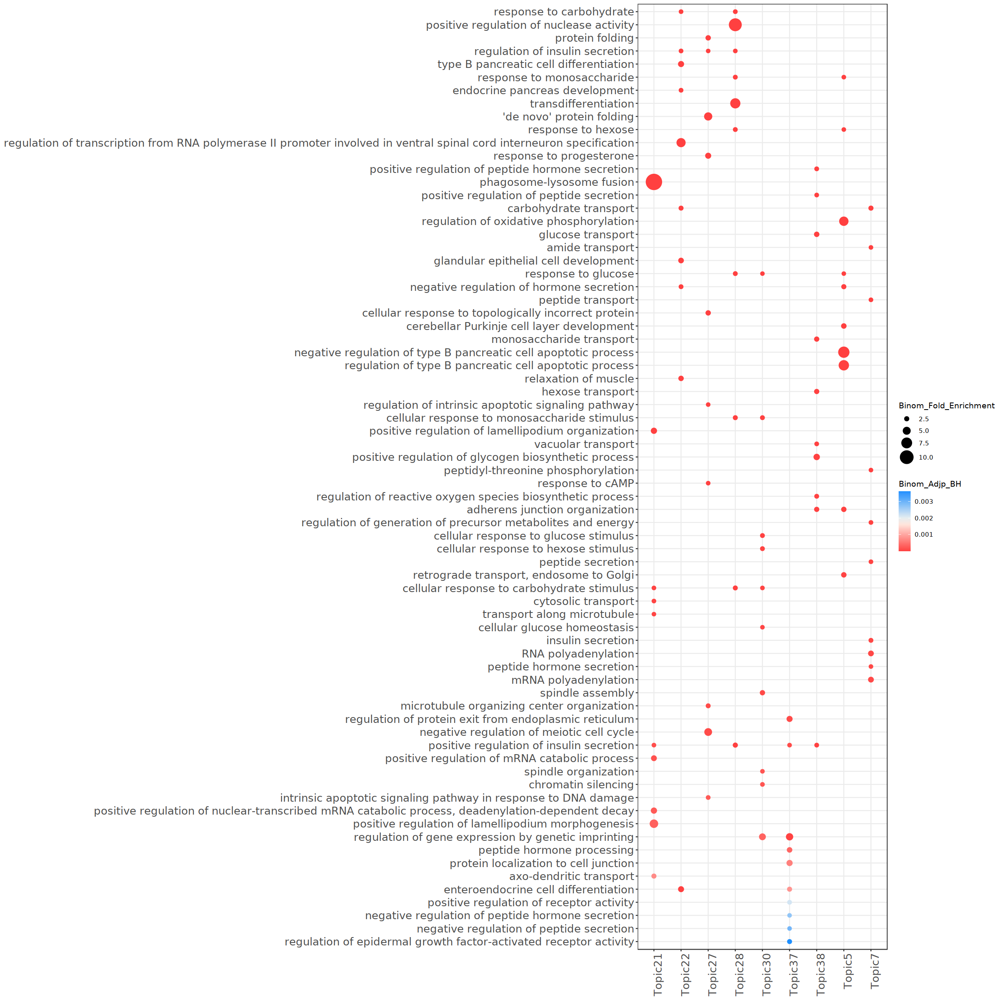

In [250]:
fig(20,20)
ontologyDotPlot(cisTopicObject, top=10, topics=c(5,7,21,22,27,28,30,38,37), var.y='name', order.by='Binom_Adjp_BH') + theme(
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 15)
  )

In [ ]:
fig(18,9)
ontologyDotPlot(cisTopicObject, top=5, topics=c(4,6,17, 14, 18, 9, 1, 8), var.y='name', order.by='Binom_Adjp_BH') + theme(
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 15)
  )

In [ ]:
library(magick)

In [ ]:
fig(15,15)
cellTopicHeatmap(cisTopicObject,
                 method='Z-score', 
                 colorBy=c('cell_type'), 
                 col.low = "dodgerblue",
                 col.mid = "floralwhite", 
                 col.high = "brown1")

We can visualize the enrichment results:

## Save RDS

In [60]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
saveRDS(cisTopicObject, file='CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds')

getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_AcinarCells_WarpLDA.rds"        
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"                    
 [3] "CisTopicObject_1_Mm10-Pancreas-Combined.rds"                      
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"              
 [5] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"         
 [6] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels_45Topics.rds"
 [7] "CisTopicObject_2_Mm10-Pancreas-CA_MotifEnrichment.rds"            
 [8] "CisTopicObject_2_Mm10-Pancreas-Combined_WarpLDA.rds"              
 [9] "CisTopicObject_3_Mm10-Pancreas-Combined_InterpretingModels.rds"   
[10] "CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds"        
[11] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"         
[12] "mm10Tomm9.over.chain"

# (Transcription factor) motif enrichment
It is also possible to identify enriched motifs within the topics and form cistromes (i.e. sets of sequences enriched for a given motif). To do this, we use RcisTarget (Aibar et al., 2017). The current version provides databases for human (hg19). You can find the region-based database at: https://resources.aertslab.org/cistarget/

For this analysis, we first need to convert the cisTopic regions to the regions in the databases (“ctx regions”). We can do this in two ways:

* Binarised, converting the binarised topic to a set of equivalent ctx regions (a region can map to more than one ctx region, and all regions which overlap more than the given threshold are taken).

## Load RDS

In [9]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"           
[2] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"     
[3] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"
[4] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"

## Mm10 to Mm9 coordinates liftover

In [65]:
# For using RcisTarget, we need to liftover the coordinates from Mm10 to the Mm9 assemble

# download Mm10 to Mm9 liftover coordinate file

library(R.utils)
url <- "http://hgdownload.soe.ucsc.edu/goldenPath/mm10/liftOver/mm10ToMm9.over.chain.gz"
mm10Tomm9.chain <- "mm10Tomm9.over.chain"
download.file(url, destfile = paste0(mm10Tomm9.chain, ".gz"))
gunzip(paste0(mm10Tomm9.chain, ".gz"))

Loading required package: R.oo

Loading required package: R.methodsS3

R.methodsS3 v1.8.1 (2020-08-26 16:20:06 UTC) successfully loaded. See ?R.methodsS3 for help.

R.oo v1.24.0 (2020-08-26 16:11:58 UTC) successfully loaded. See ?R.oo for help.


Attaching package: 'R.oo'


The following object is masked from 'package:R.methodsS3':

    throw


The following object is masked from 'package:GenomicRanges':

    trim


The following object is masked from 'package:IRanges':

    trim


The following objects are masked from 'package:methods':

    getClasses, getMethods


The following objects are masked from 'package:base':

    attach, detach, load, save


R.utils v2.10.1 (2020-08-26 22:50:31 UTC) successfully loaded. See ?R.utils for help.


Attaching package: 'R.utils'


The following object is masked from 'package:ComplexHeatmap':

    draw


The following object is masked from 'package:tidyr':

    extract


The following object is masked from 'package:utils':

    timestamp


The fol

ERROR: Error in decompressFile.default(filename = filename, ..., ext = ext, FUN = FUN): File already exists: mm10Tomm9.over.chain


In [67]:
# Import chain file
library(rtracklayer)
mm10Tomm9.chain  <- import.chain(mm10Tomm9.chain)


Attaching package: 'rtracklayer'


The following object is masked from 'package:plotly':

    export




In [68]:
# Obtain liftOver dictionary (as list)
mm10_coord <- cisTopicObject@region.ranges
#  liftover to mm9 coordinates as list
mm10_to_mm9_list <- liftOver(mm10_coord, mm10Tomm9.chain)

## Conversion of cisTopic regions to the regions in the databases (https://resources.aertslab.org/cistarget/)

### Binerised: converting binarised topic to a set of equivalent ctv regions.
A region can map to more than one ctx region, and all regions which overlap more than the given threshold are taken.

In [69]:
cisTopicObject <- binarizedcisTopicsToCtx(cisTopicObject, liftOver=mm10_to_mm9_list, genome='mm9')

Number of regions selected: 3832

Number of regions selected: 3714

Number of regions selected: 3571

Number of regions selected: 3833

Number of regions selected: 3719

Number of regions selected: 3608

Number of regions selected: 3650

Number of regions selected: 3855

Number of regions selected: 3407

Number of regions selected: 3338

Number of regions selected: 3800

Number of regions selected: 3713

Number of regions selected: 2939

Number of regions selected: 3256

Number of regions selected: 3776

Number of regions selected: 3754

Number of regions selected: 3641

Number of regions selected: 3752

Number of regions selected: 3541

Number of regions selected: 5108

Number of regions selected: 3797

Number of regions selected: 3876

Number of regions selected: 4166

Number of regions selected: 3540

Number of regions selected: 3487

Number of regions selected: 4806

Number of regions selected: 3645

Number of regions selected: 3904

Number of regions selected: 3002

Number of regi

### Scored Regions to Ctx: Maximum overlap.
When we need the scores: A region is mapped to its most overlapping ctx region

In [70]:
cisTopicObject <- scoredRegionsToCtx(cisTopicObject, liftOver=mm10_to_mm9_list, genome='mm9')

Number of regions selected: 168036



In [71]:
pathToFeather <- '/lustre1/project/stg_00041/Resources/mm9-regions-9species.all_regions.mc9nr.feather'

## Run RcisTarget in each topic

In [72]:
cisTopicObject <- topicsRcisTarget(cisTopicObject, genome='mm9', pathToFeather, reduced_database=FALSE, nesThreshold=3, rocthr=0.005, maxRank=20000, nCores=4)

Loading required package: RcisTarget



[1] "Exporting data to clusters..."
[1] "Running RcisTarget..."


Once RcisTarget is run, interactive motif enrichment tables can be explored (e.g. per topic):

## Save RDS

In [73]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
saveRDS(cisTopicObject, file='CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds')

getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_AcinarCells_WarpLDA.rds"        
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"                    
 [3] "CisTopicObject_1_Mm10-Pancreas-Combined.rds"                      
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"              
 [5] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"         
 [6] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels_45Topics.rds"
 [7] "CisTopicObject_2_Mm10-Pancreas-CA_MotifEnrichment.rds"            
 [8] "CisTopicObject_2_Mm10-Pancreas-Combined_WarpLDA.rds"              
 [9] "CisTopicObject_3_Mm10-Pancreas-Combined_InterpretingModels.rds"   
[10] "CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds"        
[11] "CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds"      
[12] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"         
[13] "mm10Tomm9.over.chain"                                             
[14] "mm10Tomm9.over.chain.gz"

## Load RDS

In [7]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_AcinarCells_WarpLDA.rds"        
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"                    
 [3] "CisTopicObject_1_Mm10-Pancreas-Combined.rds"                      
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"              
 [5] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels_45Topics.rds"
 [6] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"         
 [7] "CisTopicObject_2_Mm10-Pancreas-CA_MotifEnrichment.rds"            
 [8] "CisTopicObject_2_Mm10-Pancreas-Combined_WarpLDA.rds"              
 [9] "CisTopicObject_3_Mm10-Pancreas-Combined_InterpretingModels.rds"   
[10] "CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds"        
[11] "CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds"      
[12] "mm10Tomm9.over.chain"                                             
[13] "mm10Tomm9.over.chain.gz"                                          
[14] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"

In [16]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_AcinarCells_WarpLDA.rds"        
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"                    
 [3] "CisTopicObject_1_Mm10-Pancreas-Combined.rds"                      
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"              
 [5] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels_45Topics.rds"
 [6] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"         
 [7] "CisTopicObject_2_Mm10-Pancreas-CA_MotifEnrichment.rds"            
 [8] "CisTopicObject_2_Mm10-Pancreas-Combined_WarpLDA.rds"              
 [9] "CisTopicObject_3_Mm10-Pancreas-Combined_InterpretingModels.rds"   
[10] "CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds"        
[11] "CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds"      
[12] "mm10Tomm9.over.chain"                                             
[13] "mm10Tomm9.over.chain.gz"                                          
[14] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"

## Interactive Motif Enrichment table

In [257]:
MotifEnrichment <- cisTopicObject@binarized.RcisTarget[[5]]
DT::datatable(MotifEnrichment[,-c("enrichedRegions", "TF_lowConf"),
                              with=FALSE],
              escape = FALSE,
              filter="top",
              options=list(pageLength=100))

HTML widgets cannot be represented in plain text (need html)

We find SPI1 and CEBPB as master regulators, for example, of the B cell and the monocyte topic, respectively.

# Formation of cistromes
RcisTarget results can be used to form cistromes. We define a cistrome as a set of sequences enriched for motifs linked to a certain transcription factor. In the case of cisTopic, we build topic-specific cistromes. cisTopic produces 3 different types of cistromes: ctx-regions based, original-regions based and gene based (based on region annotation). The annotation parameter decides whether only motifs linked with high confidence should be used or also motifs indirectly annotated should be considered (i.e. in this case, the *_extended cistromes will contain both annotations).

In [43]:
cisTopicObject <- getCistromes(cisTopicObject, annotation = 'Both', nCores=6)


[1] "Exporting data to clusters..."
[1] "Annotating..."


Cistromes are useful to compare regions linked to a TF which have different spatio-temporal patterns, which may be caused i.e. by the presence of co-factors or different concentrations of the TF. Importantly, we can also estimate and visualize the enrichment of these topic specific cistromes in the cells (as shown above). For example, below we show the different enrichment pattern of cell type-specific SPI1 regions.

In [44]:
# Compute AUC rankings based on the predictive distribution
pred.matrix <- predictiveDistribution(cisTopicObject)

library(AUCell)
aucellRankings <- AUCell_buildRankings(pred.matrix, plot=FALSE, verbose=FALSE)

In [50]:
cisTopicObject <- getCistromeEnrichment(cisTopicObject, topic=11, TFname='Sp1', aucellRankings = aucellRankings, aucMaxRank = 0.05*nrow(aucellRankings), plot=FALSE)
cisTopicObject <- getCistromeEnrichment(cisTopicObject, topic=10, TFname='Sp1', aucellRankings = aucellRankings, aucMaxRank = 0.05*nrow(aucellRankings), plot=FALSE)

In [53]:
cisTopicObject@ %>% str

List of 18
 $ :List of 272
  ..$ 4921501E09Rik (993r)          : chr [1:993] "mm9_r70__chr10:102829781-102832271" "mm9_r70__chr10:114821332-114822253" "mm9_r70__chr10:117280387-117284010" "mm9_r70__chr10:119857761-119859590" ...
  ..$ Atf3 (315r)                   : chr [1:315] "mm9_r70__chr10:102829781-102832271" "mm9_r70__chr10:114688468-114690107" "mm9_r70__chr10:117280387-117284010" "mm9_r70__chr10:12586681-12589691" ...
  ..$ Bclaf1 (685r)                 : chr [1:685] "mm9_r70__chr10:114821332-114822253" "mm9_r70__chr10:117280387-117284010" "mm9_r70__chr10:119857761-119859590" "mm9_r70__chr10:121061861-121066330" ...
  ..$ Brca1 (818r)                  : chr [1:818] "mm9_r70__chr10:102829781-102832271" "mm9_r70__chr10:114821332-114822253" "mm9_r70__chr10:117280387-117284010" "mm9_r70__chr10:119857761-119859590" ...
  ..$ Brf1 (910r)                   : chr [1:910] "mm9_r70__chr10:102829781-102832271" "mm9_r70__chr10:114821332-114822253" "mm9_r70__chr10:117280387-117284010" "mm9_r

In [51]:
par(mfrow=c(1,2))
plotFeatures(cisTopicObject, method='Umap', target='cell', topic_contr=NULL, colorBy=c('Topic10_Sp1 (751p)','Topic11_Sp1 (587p)'), cex.legend = 0.8, factor.max=.75, dim=2, legend=TRUE, intervals=10)

ERROR: Error in plotFeatures(cisTopicObject, method = "Umap", target = "cell", : The variable  is not included in the cell data. Please check and re-run.


Differential motif enrichment can be performed using RSAT or Homer (Medina-Rivera et al, 2015; Heinz et al, 2017); and shape features can be modelled per sequence using GBshape bigwig files (Chiu et al., 2015). These features can be used as input to Machine Learning methods (i.e. Random Forest) to determine their relevance in generating the different patterns.

Gene accessibility scores
We can also evaluate the overall accessibility around certain markers using the predictive distribution. In this case, we will sum the probability of each region linked to each marker gene (based on ChIPseeker annotations in this tutorial).

Finally, you can save your cisTopic object:

In [5]:
cisTopicObject <- readRDS('WarpLDA_cisTopicObject_MmPancreasCA.Rds')

Warning message in gzfile(file, "rb"):
"cannot open compressed file 'WarpLDA_cisTopicObject_MmPancreasCA.Rds', probable reason 'No such file or directory'"


ERROR: Error in gzfile(file, "rb"): cannot open the connection


In [54]:
saveRDS(cisTopicObject, file='WarpLDA_cisTopicObject_MmPancreasCA.Rds')

# Gene accessibility scores

## Load RDS

In [9]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS/')
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('CisTopicObject_2.1_Mm10-Pancreas-CA_Object.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"           
[2] "CisTopicObject_2.1_Mm10-Pancreas-CA_Object.rds"          
[3] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"
[4] "SeuratObject_1_Mm10-Pancreas-CA_QC_Normalization_LDR.rds"
[5] "SeuratObject_2_Mm10-Pancreas-CA_UMAP-Clustering.rds"     
[6] "SeuratObject_3_Mm10-Pancreas-CA_Cell-Type-ID.rds"        
[7] "SeuratObject_4_Mm10-Pancreas-CA_Cell-Type-AlphaCells.rds"
[8] "SeuratObject_5_Mm10-Pancreas-CA_JASPAR2020Motifs.rds"

In [34]:
str(cisTopicObject)

Formal class 'cisTopic' [package "cisTopic"] with 24 slots
  ..@ count.matrix            :Formal class 'dgTMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:11388235] 1051 1592 3461 3909 3989 4358 4499 4706 4987 5092 ...
  .. .. ..@ j       : int [1:11388235] 0 0 0 0 0 0 0 0 0 0 ...
  .. .. ..@ Dim     : int [1:2] 145519 1486
  .. .. ..@ Dimnames:List of 2
  .. .. .. ..$ : chr [1:145519] "chr1:3119728-3120367" "chr1:3121419-3121624" "chr1:3126148-3126360" "chr1:3360948-3361206" ...
  .. .. .. ..$ : chr [1:1486] "AAACGAAAGCTATCCA-1" "AAACGAAAGGCCTCTG-1" "AAACGAAAGTGTCCCG-1" "AAACGAACATCCGTAA-1" ...
  .. .. ..@ x       : num [1:11388235] 2 2 2 2 2 2 1 2 2 2 ...
  .. .. ..@ factors : list()
  ..@ binary.count.matrix     :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:11388235] 1051 1592 3461 3909 3989 4358 4499 4706 4987 5092 ...
  .. .. ..@ p       : int [1:1487] 0 293 6462 14776 19898 26927 36743 42837 48144 66441 ...
  .. .. ..@

In [35]:
cisTopicObject@region.data

,seqnames,start,end,width,nCounts,nCells
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:3119728-3120367,chr1,3119728,3120367,639,55,23
chr1:3121419-3121624,chr1,3121419,3121624,205,12,6
chr1:3126148-3126360,chr1,3126148,3126360,212,17,9
chr1:3360948-3361206,chr1,3360948,3361206,258,18,11
chr1:3416134-3416560,chr1,3416134,3416560,426,27,16
chr1:3514859-3515136,chr1,3514859,3515136,277,16,11
chr1:3670400-3672770,chr1,3670400,3672770,2370,505,204
chr1:3673677-3673842,chr1,3673677,3673842,165,7,6
chr1:3900370-3900783,chr1,3900370,3900783,413,25,13


## Predictive distribution

By multiplying the cell and topic assignments, the likelihood of each region in each cell (i.e. predictive distribution). <br/> 
This matrix is stored in object@predictive.distribution.<br/>
These distributions can be used to estimate drop-outs and build cell-specific region rankings that can be used with AUCell for estimating the enrichment of epigenomic signatures within the cells

In [74]:
pred.matrix <- predictiveDistribution(cisTopicObject)

## Annotate regions

In [110]:
library(org.Mm.eg.db)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
cisTopicObject <- annotateRegions(cisTopicObject,
                                  txdb=TxDb.Mmusculus.UCSC.mm10.knownGene,
                                  annoDb='org.Mm.eg.db')

Loading required package: AnnotationDbi

Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.



Attaching package: 'AnnotationDbi'


The following object is masked from 'package:dplyr':

    select


The following object is masked from 'package:plotly':

    select




Loading required package: GenomicFeatures

Loading required package: ChIPseeker



ChIPseeker v1.26.2  For help: https://guangchuangyu.github.io/software/ChIPseeker

If you use ChIPseeker in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Qing-Yu He. ChIPseeker: an R/Bioconductor package for ChIP peak annotation, comparison and visualization. Bioinformatics 2015, 31(14):2382-2383



>> preparing features information...		 2022-01-12 14:35:41 
>> identifying nearest features...		 2022-01-12 14:35:42 
>> calculating distance from peak to TSS...	 2022-01-12 14:35:45 
>> assigning genomic annotation...		 2022-01-12 14:35:45 
>> adding gene annotation...			 2022-01-12 14:35:58 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2022-01-12 14:35:59 
>> done...					 2022-01-12 14:35:59 


In [75]:
region2gene <- cisTopicObject@region.data[,'SYMBOL', drop=FALSE]
region2gene <- split(region2gene, region2gene[,'SYMBOL']) 
region2gene <- lapply(region2gene, rownames) 

In [76]:
region2gene %>% head

$`0610009E02Rik`
[1] "chr2:26445697-26446197" "chr2:26449392-26449892"

$`0610010F05Rik`
[1] "chr11:23590041-23590541" "chr11:23632956-23633456"
[3] "chr11:23633507-23634007"

$`0610010K14Rik`
[1] "chr11:70236572-70237072" "chr11:70237688-70238188"

$`0610012G03Rik`
[1] "chr16:31947673-31948173" "chr16:31948268-31948768"

$`0610030E20Rik`
[1] "chr6:72347053-72347553" "chr6:72348304-72348804" "chr6:72349440-72349940"

$`0610031O16Rik`
[1] "chr3:138241303-138241803" "chr3:138241918-138242418"
[3] "chr3:138242849-138243349"

## Gene accessibility score calculation

### For selected Genes

In [99]:
# From pretrained Garnett's model markers on pBMC dataset from 10X (Pliner et al, 2019)
markerGenes  <- c( 'Pax6', 'Neurod1', # Canonical endocrine markers, could not find Nkx2.2
                   'Ins1', 'Ins2', 'Mafa', # Beta cells, could not find Nkx6.1
                   'Gcg', 'Arx', 'Irx1', 'Mafb', # Alpha cells
                   'Sst', # Delta cells
                   'Ppy', 'Tspan8', 'Pyy', 'Spp1', # Gamma cells
                   'Cd74', 'Ccl3', # Immune Cells, could not find 'H2-Ebb2'
                   'Cd34', 'Pecam1', 'Cdh5', # Endothelial Cells
                   'Hand2', 'Col6a1', 'Ano1', # Stellate cells
                   'Cpa1', 'Amy2b', 'Ptf1a', # Acinar Cells
                   'Pdgfrb', 'Pdgfra', # Activated Stellate cells?
                   'Krt19', 'Hnf1b', 'Sox9'  # Ductal Cells
                   )

region2gene_subset <- region2gene[which(names(region2gene) %in% markerGenes)]
predMatSumByGene <- sapply(region2gene_subset, function(x) apply(pred.matrix[x,, drop=F], 2, sum))
rownames(predMatSumByGene) <- cisTopicObject@cell.names
# Add to cell data
cisTopicObject <- addCellMetadata(cisTopicObject, predMatSumByGene)

### For all genes

In [100]:
predMatSumByGene <- sapply(region2gene, function(x) apply(pred.matrix[x,, drop=F], 2, sum))
rownames(predMatSumByGene) <- cisTopicObject@cell.names
# Add to cell data
cisTopicObject <- addCellMetadata(cisTopicObject, predMatSumByGene)

### Subset of genes

In [101]:
predMatSumByGene <- sapply(region2gene_subset, function(x) apply(pred.matrix[x,, drop=F], 2, sum))
rownames(predMatSumByGene) <- cisTopicObject@cell.names
# Add to cell data
cisTopicObject <- addCellMetadata(cisTopicObject, predMatSumByGene)

## Visualisation

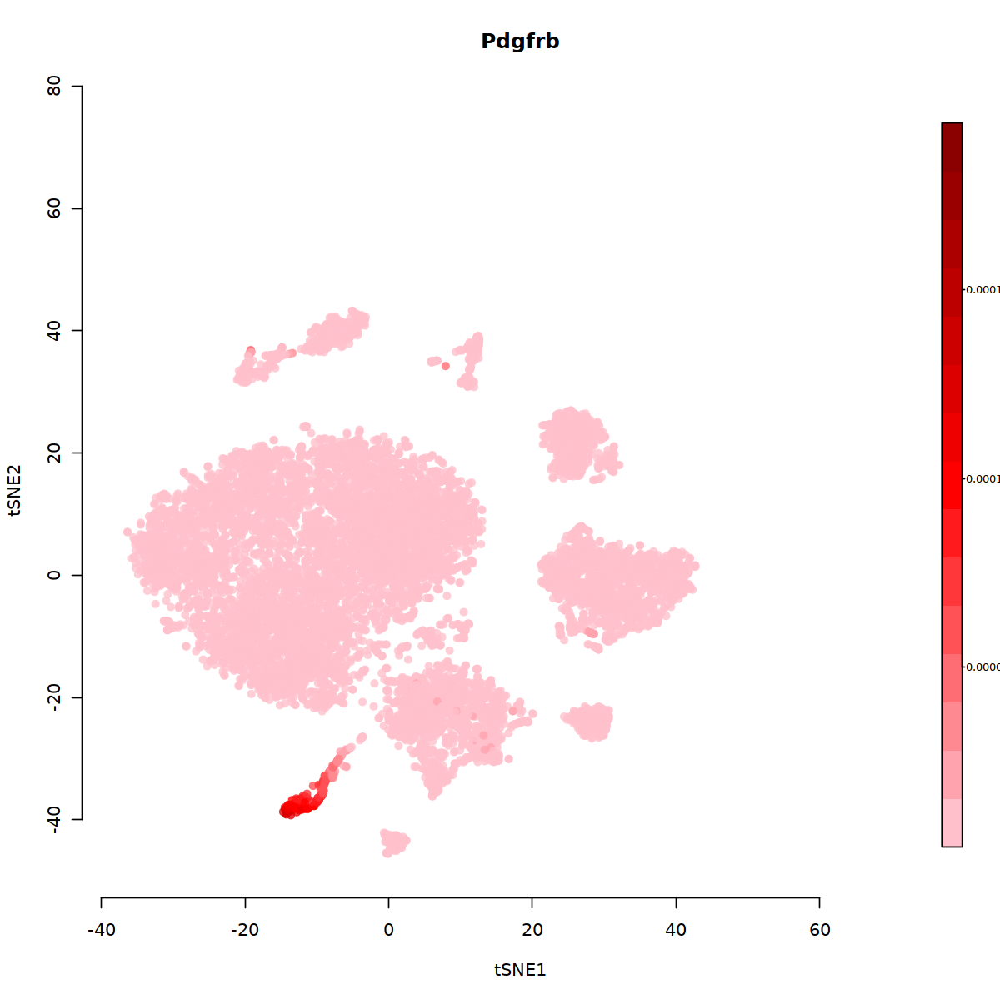

In [198]:
fig(10,10)
par(mfrow=c(1,1))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell',
             topic_contr=NULL, 
             colorBy= 'Pdgfrb',
             cex.legend = 0.3, factor.max=0.75, dim=2, legend=TRUE, intervals=15)

# Cell Annotation

In [199]:
# cisTopicObject@cell.data$densityClust <- paste0('C',cisTopicObject@cell.data$densityClust)

In [130]:
cisTopicObject@cell.data <- cisTopicObject@cell.data  %>%
    mutate(cell_type = case_when(
                           grepl("\\b1\\b",densityClust) ~ 'Beta Cells',
                           grepl("\\b2\\b",densityClust) ~ 'Acinar Cells',
                           grepl("\\b3\\b",densityClust) ~ 'Unknown1 Cells',
                           grepl("\\b4\\b",densityClust) ~ 'Beta Cells',
                           grepl("\\b5\\b",densityClust) ~ 'Alpha Cells',
                           grepl("\\b6\\b",densityClust) ~ 'Beta Cells',
                           grepl("\\b7\\b",densityClust) ~ 'Endothelial Cells',
                           grepl("\\b8\\b",densityClust) ~ 'Beta Cells',
                           grepl("\\b9\\b",densityClust) ~ 'Delta Cells',
                           grepl("\\b10\\b",densityClust) ~ 'Immune1 Cells',
                           grepl("\\b11\\b",densityClust) ~ 'Stellate Cells',
                           grepl("\\b12\\b",densityClust) ~ 'Endothelial Cells',
                           grepl("\\b13\\b",densityClust) ~ 'Ductal Cells',
                           grepl("\\b14\\b",densityClust) ~ 'Unknown2 Cells',
                           grepl("\\b15\\b",densityClust) ~ 'Unknown3 Cells',
                           grepl("\\b16\\b",densityClust) ~ 'Immune2 Cells'
                                                            )
          )

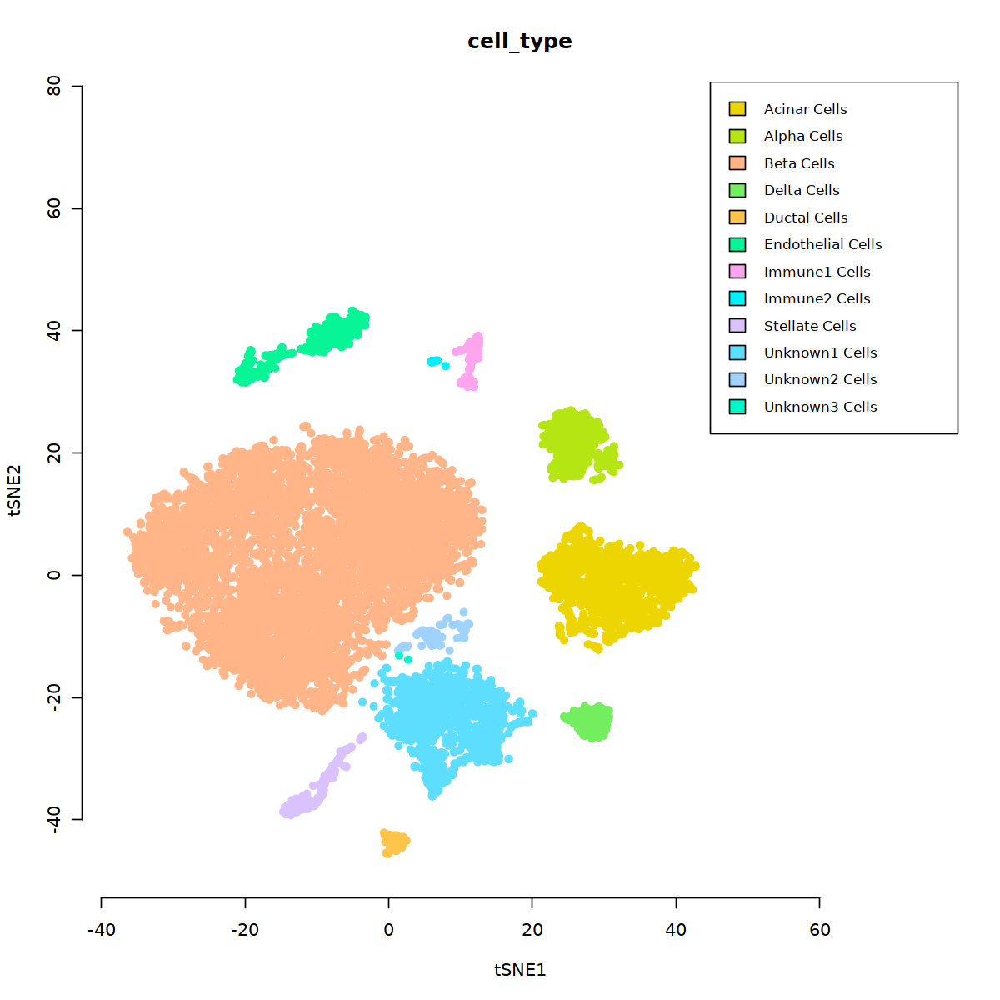

In [131]:
fig(10,10)
par(mfrow=c(1,1))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell',
             topic_contr=NULL,
             colorBy=c('cell_type'),
             cex.legend = 0.8,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10,
            label=TRUE) 


In [137]:
library(magick)

Linking to ImageMagick 7.0.11.9
Enabled features: cairo, fontconfig, freetype, fftw, pango, rsvg, webp, x11
Disabled features: ghostscript, heic, lcms, raw



`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



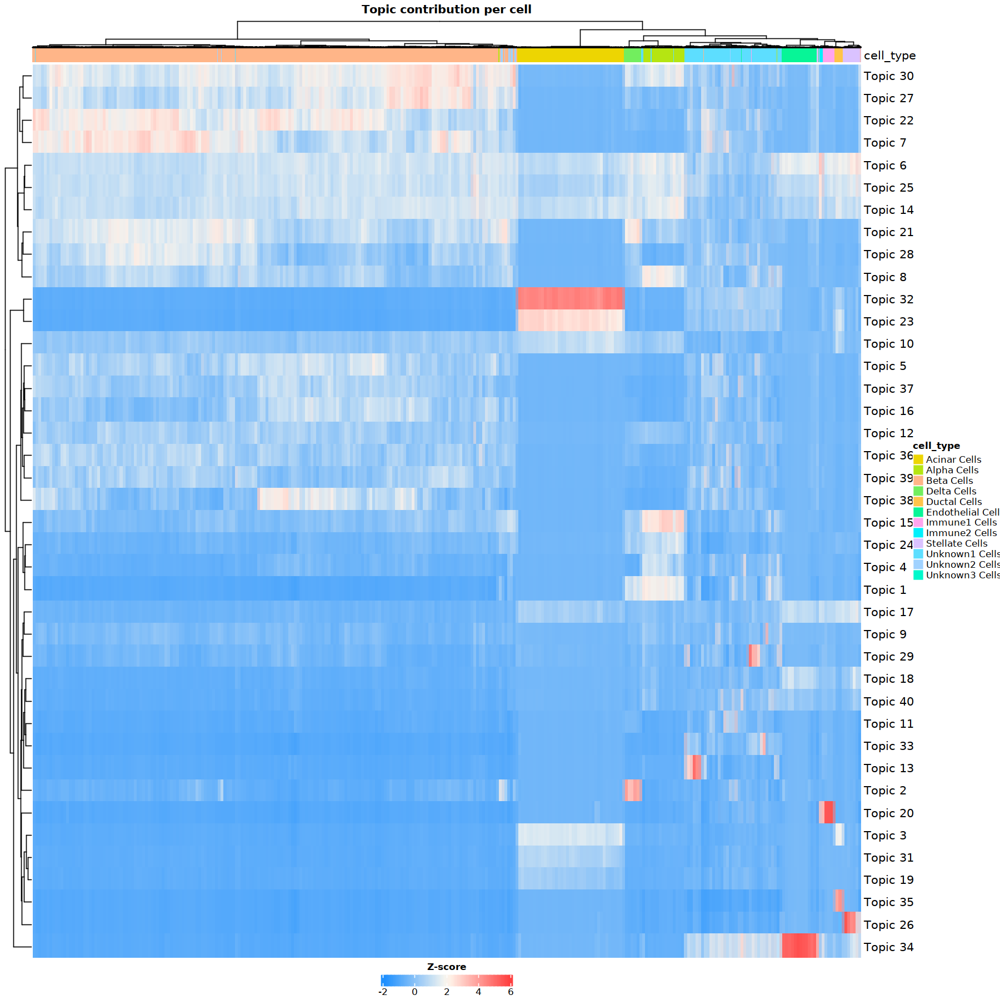

In [138]:
fig(15,15)
cellTopicHeatmap(cisTopicObject,
                 method='Z-score', 
                 colorBy=c('cell_type'), 
                 col.low = "dodgerblue",
                 col.mid = "floralwhite", 
                 col.high = "brown1")

In [139]:
# Open a pdf file
pdf(paste0(FIG_Dir,"cisTopicHeatMap.pdf")) 
# Create a plot
cellTopicHeatmap(cisTopicObject,
                 method='Z-score', 
                 colorBy=c('cell_type'), 
                 col.low = "dodgerblue",
                 col.mid = "floralwhite", 
                 col.high = "brown1")
# Close the pdf file
dev.off() 

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



png 
  2

In [9]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022/')
getwd()
list.files()

#Load Data
cisTopicObject <- readRDS('CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS_2022"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_AcinarCells_WarpLDA.rds"        
 [2] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"                    
 [3] "CisTopicObject_1_Mm10-Pancreas-Combined.rds"                      
 [4] "CisTopicObject_2_Mm10-Pancreas-CA_GO-Annotation.rds"              
 [5] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels_45Topics.rds"
 [6] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"         
 [7] "CisTopicObject_2_Mm10-Pancreas-CA_MotifEnrichment.rds"            
 [8] "CisTopicObject_2_Mm10-Pancreas-Combined_WarpLDA.rds"              
 [9] "CisTopicObject_3_Mm10-Pancreas-Combined_InterpretingModels.rds"   
[10] "CisTopicObject_4_Mm10-Pancreas-Combined_GO-Annotation.rds"        
[11] "CisTopicObject_5_Mm10-Pancreas-Combined_MotifEnrichment.rds"      
[12] "mm10Tomm9.over.chain"                                             
[13] "mm10Tomm9.over.chain.gz"                                          
[14] "SKT005_01_Seurat_Mm10PancreasCA_QC_Normalization_LDR.rds"

In [18]:
cisTopicObject@cell.data$densityClust %>% unique

[1] 2  11 13 10 4  5  16 1  7  12 9  3  8  14 6  15
Levels: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

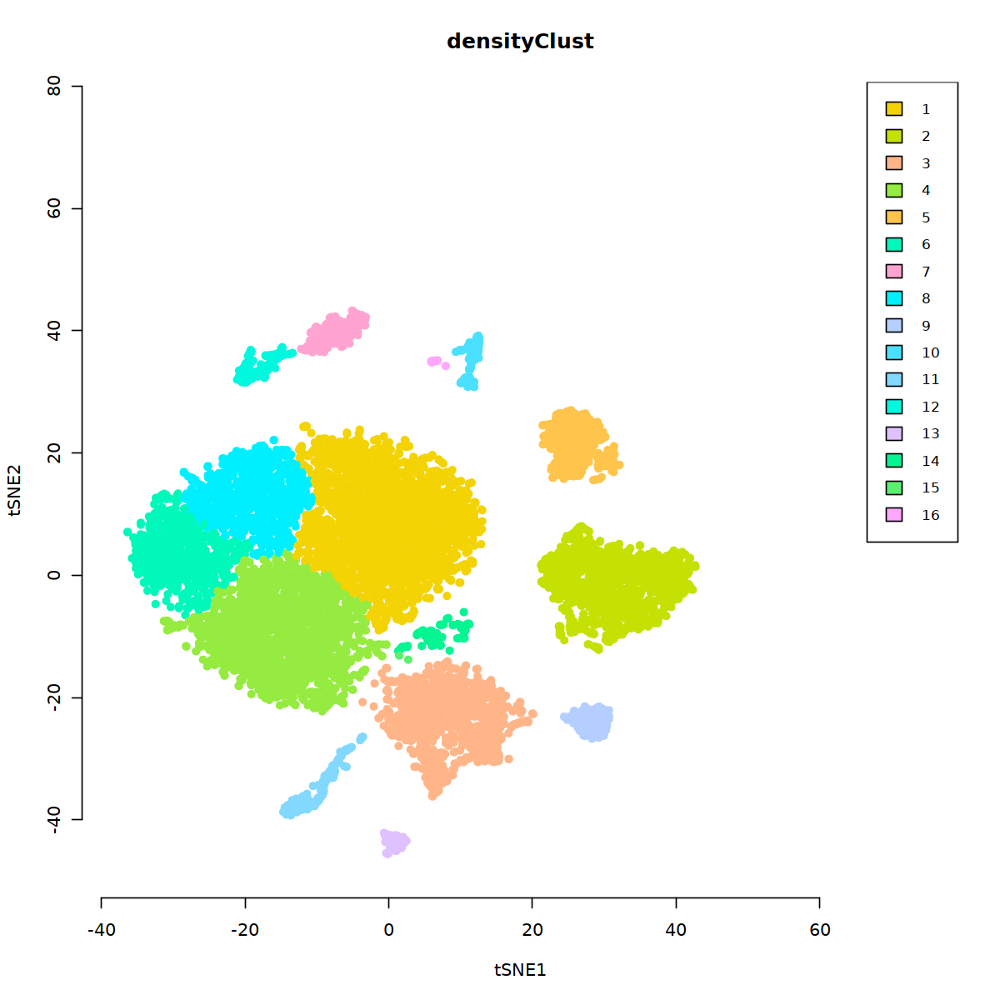

In [17]:
fig(10,10)
par(mfrow=c(1,1))
plotFeatures(cisTopicObject,
             method='tSNE',
             target='cell',
             topic_contr=NULL,
             colorBy=c('densityClust'),
             cex.legend = 0.8,
             factor.max=.75, 
             dim=2, 
             legend=TRUE,
             col.low='darkgreen',
             col.mid='yellow',
             col.high='brown1', 
             intervals=10,
            label=TRUE) 


In [12]:
par(mfrow=c(2,5))
plotFeatures(cisTopicObject,
             method='Umap',
             target='cell', 
             topic_contr='Probability',
             topics=c('Topic1',
                      'Topic4',
                      'Topic6',
                      'Topic7',
                      'Topic9',
                      'Topic11',
                      'Topic13',
                      'Topic15'),
             colorBy=NULL, 
             cex.legend = 0.8, 
             factor.max=.75, 
             dim=2, 
             legend=TRUE)

options(repr.plot.width = 20, repr.plot.height = 20)

## Save RDS

In [222]:
setwd('/lustre1/project/stg_00041/SanKit/SKT005/RDS/')
saveRDS(cisTopicObject, file='CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds')

getwd()
list.files()

[1] "/lustre1/project/stg_00041/SanKit/SKT005/RDS"

[1] "CisTopicObject_1_Mm10-Pancreas-CA_WarpLDA.rds"           
[2] "CisTopicObject_2.1_Mm10-Pancreas-CA_Object.rds"          
[3] "CisTopicObject_2_Mm10-Pancreas-CA_InterpretingModels.rds"
[4] "SeuratObject_1_Mm10-Pancreas-CA_QC_Normalization_LDR.rds"
[5] "SeuratObject_2_Mm10-Pancreas-CA_UMAP-Clustering.rds"     
[6] "SeuratObject_3_Mm10-Pancreas-CA_Cell-Type-ID.rds"        
[7] "SeuratObject_4_Mm10-Pancreas-CA_Cell-Type-AlphaCells.rds"
[8] "SeuratObject_5_Mm10-Pancreas-CA_JASPAR2020Motifs.rds"

# Enrichment of epigenomic signatures in the cells

Another way of exploring the topics is to check their overlap (i.e. the regions included in the topics) with predefined epigenomic signatures/datasets. <br/>
For example, regions from ChIP-seq can point towards enrichment of binding sites of a given TF, regions from FAIRE- or ATAC-seq to regions generally open in a given cell type or tissue, etc.

## Predictive distribution


By multiplying the cell and topic assignments, the likelihood of each region in each cell (i.e. predictive distribution). This matrix is stored in object@predictive.distribution. These distributions can be used to estimate drop-outs and build cell-specific region rankings that can be used with AUCell for estimating the enrichment of epigenomic signatures within the cells.

In [49]:
# Calculation of the probability of each region in each cell

pred.matrix <- predictiveDistribution(cisTopicObject)


## ChIP-, Faire- or ATAC-seq Signature Enrichment

For example, we can evaluate which cells are more enriched for certain ChIP-seq signatures. First, epigenomic regions are intersected and mapped to regions in the dataset (by default, with at least 40% overlap). To test the enrichment of these signatures in each cell, we use a GSEA-like recovery curve ranking-based approach. In each cell, regions are ranked based on their probability (x-axis), and when a region is present in the signature we increase one step in the y-axis. The Area Under the Curve (AUC) is used to evaluate the importance of that signature within that cell. The corresponding overlapping sets (which are stored in object@signatures) are used as input, together with the cell-specific region rankings, for the function signatureCellEnrichment. AUC values for each specific signature are stored in object@cell.data. In this case, we can use bulk signatures from the hematopoietic system from Corces et al. (2016).

In [97]:
# Obtain signatures
path_to_signatures <- paste0(pathTo10X, 'Bulk_peaks/')
Bulk_ATAC_signatures <- paste(path_to_signatures, list.files(path_to_signatures), sep='')
labels  <- gsub('._peaks.narrowPeak', '', list.files(path_to_signatures))
cisTopicObject <- getSignaturesRegions(cisTopicObject, Bulk_ATAC_signatures, labels=labels, minOverlap = 0.4)

# To only keep unique peaks per signature
cisTopicObject@signatures <- llply(1:length(cisTopicObject@signatures), function (i) cisTopicObject@signatures[[i]][-which(cisTopicObject@signatures[[i]] %in% unlist(as.vector(cisTopicObject@signatures[-i])))]) 
names(cisTopicObject@signatures) <- labels

Warning message in file(file, "rt"):
"cannot open file '/ddn1/vol1/staging/leuven/stg_00041/SanKit/SKT005/demultiplex.210203.NextSeq.FCA_cellranger/HLK7NAFX2/MmPancreasCA/outs/Bulk_peaks/': No such file or directory"


[1] "The signature NA has no overlap with the regions in this cisTopicObject and will be removed."


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'match': subscript out of bounds


In [ ]:
# Compute cell rankings
library(AUCell)
aucellRankings <- AUCell_buildRankings(pred.matrix, plot=FALSE, verbose=FALSE)

In [ ]:
# Check signature enrichment in cells (Reference time: 1 min)
cisTopicObject <- signatureCellEnrichment(cisTopicObject, aucellRankings, selected.signatures='all', aucMaxRank = 0.3*nrow(aucellRankings), plot=FALSE)

In [ ]:
# Plot
par(mfrow=c(2,2))
plotFeatures(cisTopicObject, method='Umap', target='cell', topic_contr=NULL, colorBy=c('CD4Tcell', 'Mono', 'Bcell', 'NKcell'), cex.legend = 0.4, factor.max=.75, dim=2, legend=TRUE, intervals=10)

NOTE: The predictive distributions and the AUCell rankings are not stored in the cisTopic object as they have a big size.

In [ ]:
# heatmap showing the row normalised AUC scores
signaturesHeatmap(cisTopicObject)

# Extract Total assignments per topic

## Load RDS

In [6]:
setwd(RDS_Dir)
getwd()
list.files()
#Load Data
cisTopicObject <- readRDS('SKT012.01.03_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds')

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/RDS"

[1] "CountMatrixHg38Pancreas.mtx"                                                    
 [2] "mm10Tomm9.over.chain"                                                           
 [3] "SKT012.01.01_CisTopic_Hg38PancreasCombined.rds"                                 
 [4] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA_20052022.rds"                
 [5] "SKT012.01.02_CisTopic_Hg38PancreasCombined_WarpLDA.rds"                         
 [6] "SKT012.01.03_CisTopic_Hg38PancreasCombined_97Topics_Embeddings.rds"             
 [7] "SKT012.01.03_CisTopic_Hg38PancreasCombined_Embeddings.rds"                      
 [8] "SKT012.01.04_CisTopic_Hg38PancreasCombined_97Topics_GOAnnotation.rds"           
 [9] "SKT012.01.05_CisTopic_Hg38PancreasCombined_97Topics_cisTargetCoordinatesCtx.rds"
[10] "SKT012.01.06_CisTopic_Hg38PancreasCombined_97Topics_MotifEnrichment.rds"        
[11] "SKT012.01.07_CisTopic_Hg38PancreasCombined_97Topics_ArchR.rds"

In [7]:
DATA_Dir

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/cisTopic/"

In [8]:
Topic_sums <- cisTopicObject@selected.model$topic_sums

In [9]:
write.csv(Topic_sums, paste0(DATA_Dir,'CisTopic__MHg38CombinedPancreas_Topic97_TotalAssignmentsPerTopic.csv'))

# References
* Blei, D. M., Ng, A. Y., & Jordan, M. I. (2003). Latent dirichlet allocation. Journal of machine Learning research, 3(Jan), 993-1022.
* Steyvers, M., & Griffiths, T. (2007). Probabilistic topic models. Handbook of latent semantic analysis, 427(7), 424-440.
* Chen, J., Li, K., Zhu, J., & Chen, W. (2016). Warplda: a cache efficient o (1) algorithm for latent dirichlet allocation. Proceedings of the VLDB Endowment, 9(10), 744-755.
* Cusanovich, D. A., Reddington, J. P., Garfield, D. A., Daza, R. M., Aghamirzaie, D., Marco-Ferreres, R., … & Trapnell, C. (2018). The cis-regulatory dynamics of embryonic development at single-cell resolution. Nature, 555(7697), 538.
* Aibar, S., Bravo González-Blas, C., Moerman, T., Imrichova, H., Hulselmans, G., Rambow, F., … & Atak, Z. K. (2017). SCENIC: single-cell regulatory network inference and clustering. Nature methods, 14(11), 1083.
* Medina-Rivera, A., Defrance, M., Sand, O., Herrmann, C., Castro-Mondragon, J. A., Delerce, J., … & Staines, D. M. (2015). RSAT 2015: regulatory sequence analysis tools. Nucleic acids research, 43(W1), W50-W56.
* Heinz, S., Benner, C., Spann, N., Bertolino, E., Lin, Y. C., Laslo, P., … & Glass, C. K. (2010). Simple combinations of lineage-determining transcription factors prime cis-regulatory elements required for macrophage and B cell identities. Molecular cell, 38(4), 576-589.
* Chiu, T. P., Yang, L., Zhou, T., Main, B. J., Parker, S. C., Nuzhdin, S. V., … & Rohs, R. (2014). GBshape: a genome browser database for DNA shape annotations. Nucleic acids research, 43(D1), D103-D109.
* Pliner, H. A., Shendure, J., & Trapnell, C. (2019). Supervised classification enables rapid annotation of cell atlases. BioRxiv, 538652.